***
# Residential Property Prices Analysis
***
_Report by Adi Agimba_

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib_venn import venn2, venn2_circles, venn3, venn3_circles
import seaborn as sns
from scipy import stats
import missingno as msno

%matplotlib inline

In [2]:
raw = pd.read_csv("house-prices.csv")

In [3]:
raw_te =  pd.read_csv("house-prices-test.csv")

In [4]:
print(f"The training data set has {raw.shape[0]} rows and {raw.shape[1]} columns.\n")

print(f"The test data set has {raw_te.shape[0]} rows and {raw_te.shape[1]} columns.")

The training data set has 2430 rows and 82 columns.

The test data set has 500 rows and 81 columns.


<br>**Count of feaure data types**

In [5]:
print(f"Training dataset:\n")

raw.dtypes.value_counts()

Training dataset:



object     43
int64      28
float64    11
Name: count, dtype: int64

In [6]:
print(f"Test dataset:\n")

raw_te.dtypes.value_counts()

Test dataset:



object     43
int64      27
float64    11
Name: count, dtype: int64

<br>Converting the selected columns to continuous, discrete or categorical data as per the detailed data description document would best define the attributes.

In [7]:
raw[["SalePrice", "Lot Area", "1st Flr SF",
      "2nd Flr SF","Low Qual Fin SF", "Gr Liv Area", 
      "Wood Deck SF", "Open Porch SF", "Enclosed Porch",
      "3Ssn Porch", "Pool Area"]] = raw[["SalePrice", "Lot Area", "1st Flr SF",
      "2nd Flr SF","Low Qual Fin SF", "Gr Liv Area", 
      "Wood Deck SF", "Open Porch SF", "Enclosed Porch",
      "3Ssn Porch", "Pool Area"]].astype("float64")

In [8]:
raw_te[["Lot Area", "1st Flr SF",
      "2nd Flr SF","Low Qual Fin SF", "Gr Liv Area", 
      "Wood Deck SF", "Open Porch SF", "Enclosed Porch",
      "3Ssn Porch", "Pool Area"]] = raw_te[["Lot Area", "1st Flr SF",
      "2nd Flr SF","Low Qual Fin SF", "Gr Liv Area", 
      "Wood Deck SF", "Open Porch SF", "Enclosed Porch",
      "3Ssn Porch", "Pool Area"]].astype("float64")

In [9]:
raw[["PID", "Order"]] = raw[["PID", "Order"]].astype("object")

In [10]:
raw_te[["PID", "Order"]] = raw_te[["PID", "Order"]].astype("object")

In [11]:
raw["MS SubClass"] = raw["MS SubClass"].astype(str)

In [12]:
raw_te["MS SubClass"] = raw_te["MS SubClass"].astype(str)

In [13]:
raw[["Overall Qual", "Overall Cond"]] = raw[["Overall Qual", "Overall Cond"]].astype("int64")

In [14]:
raw_te[["Overall Qual", "Overall Cond"]] = raw_te[["Overall Qual", "Overall Cond"]].astype("int64")

<br> **List of column names according to data type**

In [15]:
obj_col = [col for col in raw.columns if raw[col].dtypes == "object"]

obj_col

['Order',
 'PID',
 'MS SubClass',
 'MS Zoning',
 'Street',
 'Alley',
 'Lot Shape',
 'Land Contour',
 'Utilities',
 'Lot Config',
 'Land Slope',
 'Neighborhood',
 'Condition 1',
 'Condition 2',
 'Bldg Type',
 'House Style',
 'Roof Style',
 'Roof Matl',
 'Exterior 1st',
 'Exterior 2nd',
 'Mas Vnr Type',
 'Exter Qual',
 'Exter Cond',
 'Foundation',
 'Bsmt Qual',
 'Bsmt Cond',
 'Bsmt Exposure',
 'BsmtFin Type 1',
 'BsmtFin Type 2',
 'Heating',
 'Heating QC',
 'Central Air',
 'Electrical',
 'Kitchen Qual',
 'Functional',
 'Fireplace Qu',
 'Garage Type',
 'Garage Finish',
 'Garage Qual',
 'Garage Cond',
 'Paved Drive',
 'Pool QC',
 'Fence',
 'Misc Feature',
 'Sale Type',
 'Sale Condition']

In [16]:
int_col = [col for col in raw.columns if raw[col].dtypes == "int64"]

int_col

['Overall Qual',
 'Overall Cond',
 'Year Built',
 'Year Remod/Add',
 'Full Bath',
 'Half Bath',
 'Bedroom AbvGr',
 'Kitchen AbvGr',
 'TotRms AbvGrd',
 'Fireplaces',
 'Screen Porch',
 'Misc Val',
 'Mo Sold',
 'Yr Sold']

<br> As the test dataset does not have the sale price feature, an additional float_col list which accomodates this difference would ease future filtering. 

In [17]:
float_col = [col for col in raw.columns if raw[col].dtypes == "float64"]

float_col

['Lot Frontage',
 'Lot Area',
 'Mas Vnr Area',
 'BsmtFin SF 1',
 'BsmtFin SF 2',
 'Bsmt Unf SF',
 'Total Bsmt SF',
 '1st Flr SF',
 '2nd Flr SF',
 'Low Qual Fin SF',
 'Gr Liv Area',
 'Bsmt Full Bath',
 'Bsmt Half Bath',
 'Garage Yr Blt',
 'Garage Cars',
 'Garage Area',
 'Wood Deck SF',
 'Open Porch SF',
 'Enclosed Porch',
 '3Ssn Porch',
 'Pool Area',
 'SalePrice']

In [18]:
float_col_te = [col for col in raw_te if raw_te[col].dtypes == "float64"]

float_col_te

['Lot Frontage',
 'Lot Area',
 'Mas Vnr Area',
 'BsmtFin SF 1',
 'BsmtFin SF 2',
 'Bsmt Unf SF',
 'Total Bsmt SF',
 '1st Flr SF',
 '2nd Flr SF',
 'Low Qual Fin SF',
 'Gr Liv Area',
 'Bsmt Full Bath',
 'Bsmt Half Bath',
 'Garage Yr Blt',
 'Garage Cars',
 'Garage Area',
 'Wood Deck SF',
 'Open Porch SF',
 'Enclosed Porch',
 '3Ssn Porch',
 'Pool Area']

<br>**Duplicated Rows**

In [19]:
print(f"The training dataset has {raw.duplicated().sum()} duplicated observations\n.")

print(f"The test dataset has {raw.duplicated().sum()} duplicated observations.")

The training dataset has 0 duplicated observations
.
The test dataset has 0 duplicated observations.


<br> If the unique identifier columns for both dataframes have a total of 2430, and 500 unique values respectively, confirms that there aren't any duplicated observations or parcel identification numbers.

In [20]:
print("Count of unique values (training dataset):\n")

raw[["Order", "PID"]].nunique()

Count of unique values (training dataset):



Order    2430
PID      2430
dtype: int64

In [21]:
print("Count of unique values (test dataset):\n")

raw_te[["Order", "PID"]].nunique()

Count of unique values (test dataset):



Order    500
PID      500
dtype: int64

<br> 

## **Data cleaning**

<br> Amendments to missing values across both dataframes will be stored in the variables raw2 and raw2_te. 

In [22]:
raw2 = raw.copy()

raw2_te = raw_te.copy()

<br> Features that have missing values are stored in the variables missing_tr and missing_te.

In [23]:
missing_tr = raw2.columns[raw.isnull().any()]

missing_te = raw2_te.columns[raw_te.isnull().any()]

In [24]:
missing_tr

Index(['Lot Frontage', 'Alley', 'Mas Vnr Type', 'Mas Vnr Area', 'Bsmt Qual',
       'Bsmt Cond', 'Bsmt Exposure', 'BsmtFin Type 1', 'BsmtFin SF 1',
       'BsmtFin Type 2', 'BsmtFin SF 2', 'Bsmt Unf SF', 'Total Bsmt SF',
       'Electrical', 'Bsmt Full Bath', 'Bsmt Half Bath', 'Fireplace Qu',
       'Garage Type', 'Garage Yr Blt', 'Garage Finish', 'Garage Cars',
       'Garage Area', 'Garage Qual', 'Garage Cond', 'Pool QC', 'Fence',
       'Misc Feature'],
      dtype='object')

<br>**Matrix Plot of Missing Values per Column**

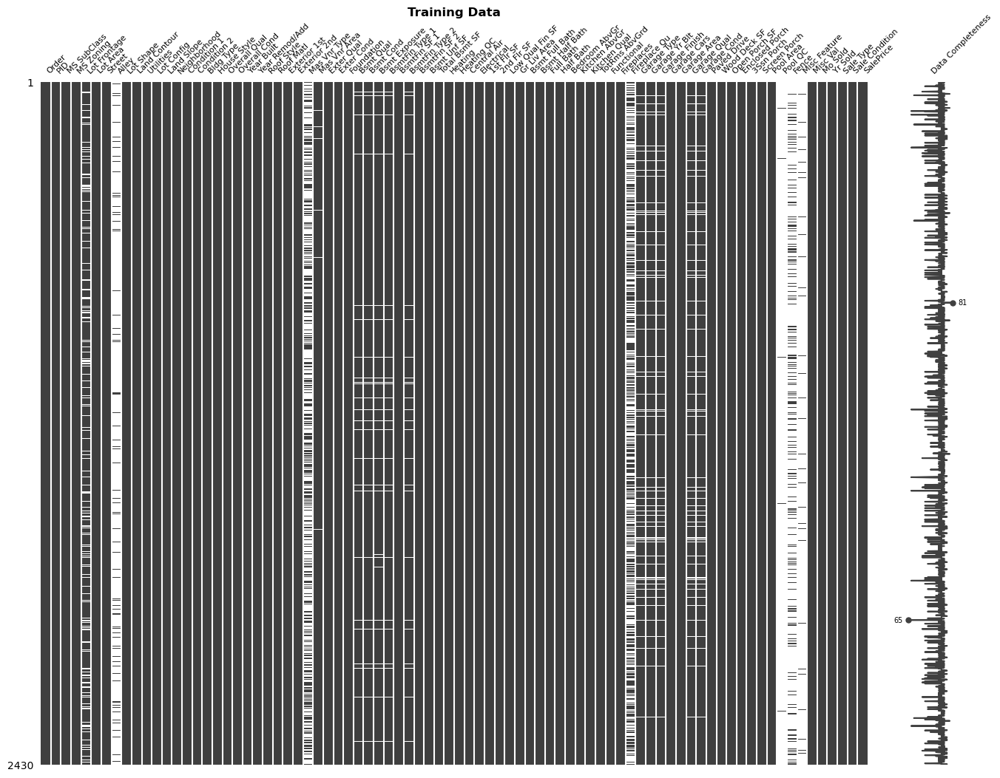

In [25]:
msno.matrix(raw2, figsize=(16,12), fontsize=8, labels=True)

plt.title("Training Data", weight="bold")
plt.show()

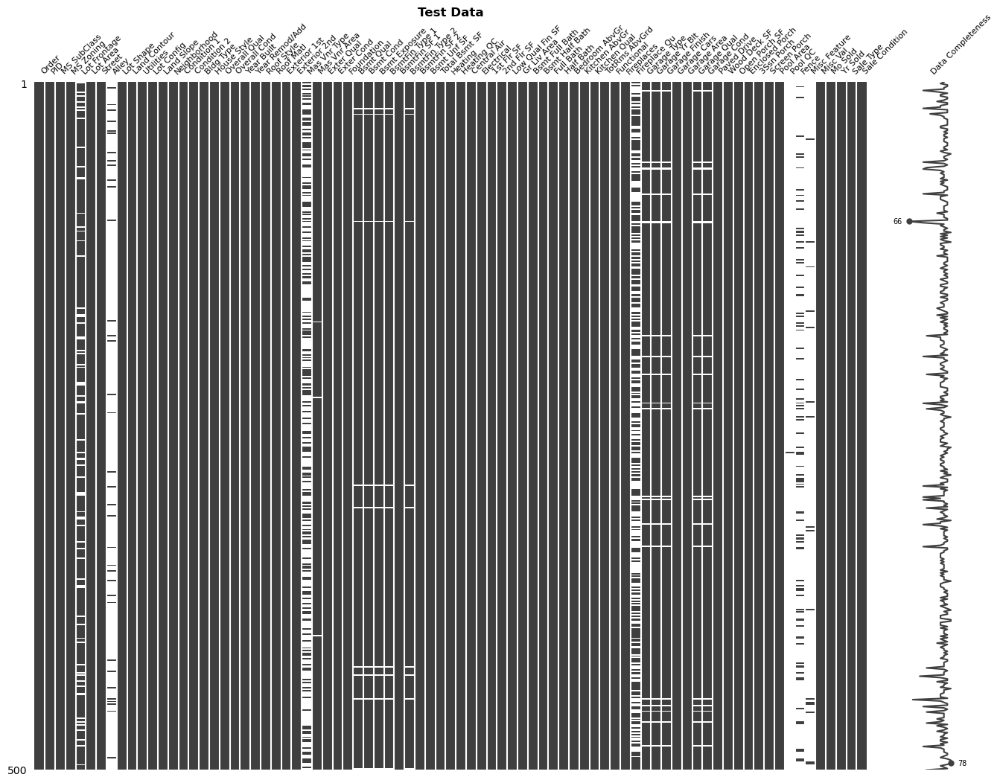

In [26]:
msno.matrix(raw2_te, figsize=(16,12), fontsize=8, labels=True)

plt.title("Test Data", weight="bold")
plt.show()

<br>There are a handful of columns that have a sizable sum of missing values. Visualising the 82 attributes by data type would illustrate how to most apprioriately resolve the nullity across both datasets.

<br> **Missing values: Object and Float Features**

In [27]:
missing_obj_tr = [col for col in raw[missing_tr] if raw[col].dtype == "object"]

missing_obj_te = [col for col in raw_te[missing_tr] if raw_te[col].dtype == "float64"]

missing_float_tr = [col for col in raw[missing_tr] if raw[col].dtype == "object"]

missing_float_te = [col for col in raw_te[missing_tr] if raw_te[col].dtype == "float64"]

Of the columns with an object data type, the training set has 16 features with missing values and the test set has 11 features with missing values.


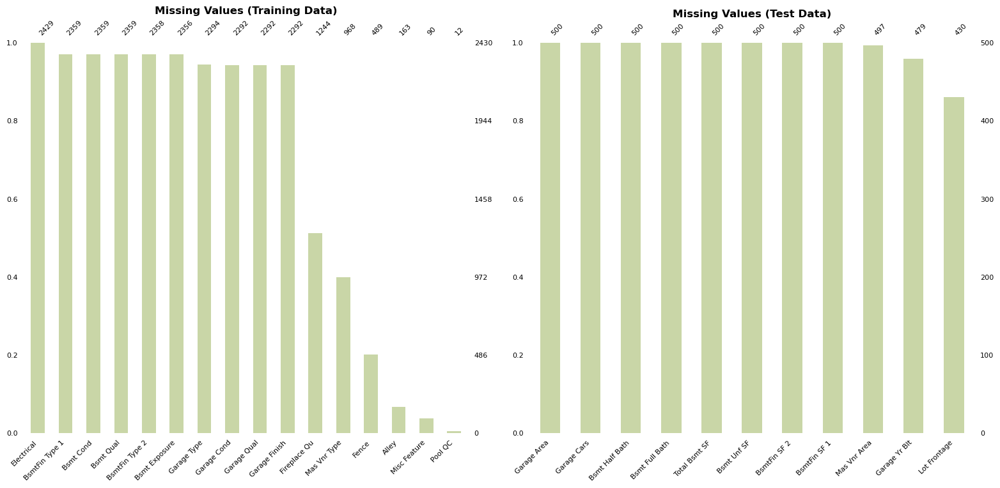

In [28]:
print(f"Of the columns with an object data type, the training set has {len(missing_obj_tr)} features with missing values \
and the test set has {len(missing_obj_te)} features with missing values.")

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16,8))

msno.bar(raw2[missing_obj_tr], ax=ax[0], sort="descending", fontsize=8, color="#c9d6a7")

ax[0].set_title("Missing Values (Training Data)", weight="bold")


msno.bar(raw2_te[missing_obj_te], ax=ax[1], sort="descending", fontsize=8, color="#c9d6a7")

ax[1].set_title("Missing Values (Test Data)", weight="bold")

plt.tight_layout(pad=2)
plt.show()

Of the columns with an float data type, the training set has 16 features with missing values and the test set has 11 features with missing values.


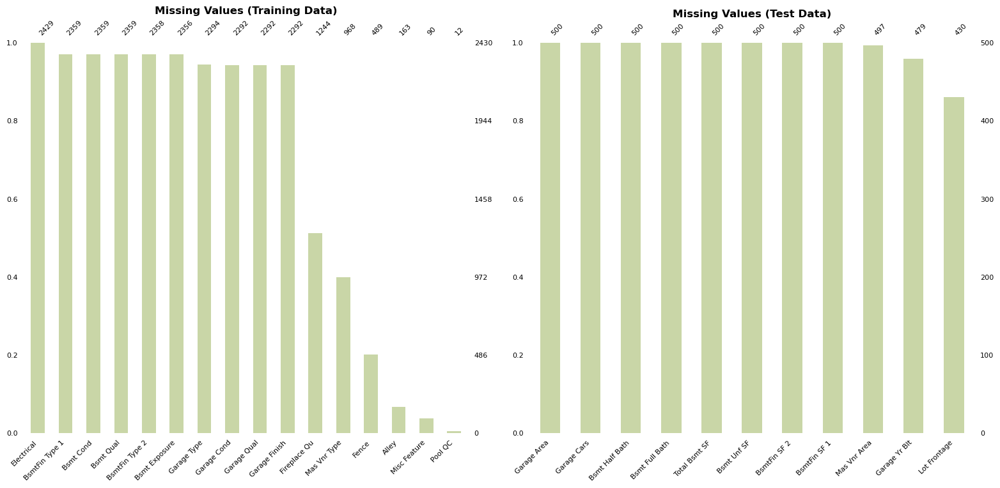

In [29]:
print(f"Of the columns with an float data type, the training set has {len(missing_float_tr)} features with missing values \
and the test set has {len(missing_float_te)} features with missing values.")

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16,8))

msno.bar(raw2[missing_float_tr], ax=ax[0], sort="descending", fontsize=8, color="#c9d6a7")

ax[0].set_title("Missing Values (Training Data)", weight="bold")


msno.bar(raw2_te[missing_float_te], ax=ax[1], sort="descending", fontsize=8, color="#c9d6a7")

ax[1].set_title("Missing Values (Test Data)", weight="bold")

plt.tight_layout(pad=2)
plt.show()

<br>**Alley**

In [30]:
print(f"Training dataset:\n")

raw2["Alley"].describe()

Training dataset:



count      163
unique       2
top       Grvl
freq       104
Name: Alley, dtype: object

In [31]:
print(f"Test dataset:\n")

raw2_te["Alley"].describe()

Test dataset:



count       35
unique       2
top       Pave
freq        19
Name: Alley, dtype: object

<br>A reasonable assumption would be that null values in the Alley column refer to observations that do not have an alley therefore NA is a fair substition.

In [32]:
raw2["Alley"] = raw2["Alley"].fillna("NA")

print(f"The column Alley in raw2 now has {raw2['Alley'].isnull().sum()} missing values.")

The column Alley in raw2 now has 0 missing values.


In [33]:
raw2_te["Alley"] = raw2_te["Alley"].fillna("NA")

print(f"The column Alley in raw2_te now has {raw2_te['Alley'].isnull().sum()} missing values.")

The column Alley in raw2_te now has 0 missing values.


<br> **Masonry Veneer**

In [34]:
print(f"Training dataset:\n")

raw2["Mas Vnr Type"].describe()

Training dataset:



count         968
unique          4
top       BrkFace
freq          736
Name: Mas Vnr Type, dtype: object

In [35]:
print(f"Test datasets:\n")

raw2_te["Mas Vnr Type"].describe()

Test datasets:



count         187
unique          3
top       BrkFace
freq          144
Name: Mas Vnr Type, dtype: object

<br> Values that have an area of 0.0 in Mas Vnr Area and a not-null value in Mas Vnr Type should be changed to None to reflect the absence of a masonry veneer wall. 

In [36]:
mask = raw2[["Mas Vnr Type", "Mas Vnr Area"]][(raw2["Mas Vnr Area"] == 0.0) & (raw2["Mas Vnr Type"].notnull())]

mask

,Mas Vnr Type,Mas Vnr Area
678,Stone,0.0
2220,BrkFace,0.0
2227,BrkFace,0.0


In [37]:
raw2.loc[mask.index, "Mas Vnr Type"] = "None"

In [38]:
print(f"The test dataset does not have any rows that meet the defined condition.\n")

raw2_te[["Mas Vnr Type", "Mas Vnr Area"]][(raw2_te["Mas Vnr Area"] == 0.0) & (raw2_te["Mas Vnr Type"].notnull())]

The test dataset does not have any rows that meet the defined condition.



,Mas Vnr Type,Mas Vnr Area


<br>A reasonable assumption would be that properties with a masonry veneer area of 0.0 may not have a masonry veneer wall, therefore a reasonable subsitution would be None.

In [39]:
mask2 = raw2[["Mas Vnr Type", "Mas Vnr Area"]][raw2["Mas Vnr Area"] == 0.0]

mask2

,Mas Vnr Type,Mas Vnr Area
0,NaN,0.0
3,NaN,0.0
4,NaN,0.0
5,NaN,0.0
6,NaN,0.0
...,...,...
2423,NaN,0.0
2424,NaN,0.0
2425,NaN,0.0
2426,NaN,0.0


In [40]:
raw2.loc[mask2.index, "Mas Vnr Type"] = "None"

print(f"The column Masonary Veneer Area in raw2 now has {raw2['Mas Vnr Area'].isnull().sum()} missing values.")

The column Masonary Veneer Area in raw2 now has 20 missing values.


In [41]:
mask3 = raw2_te[["Mas Vnr Type", "Mas Vnr Area"]][raw2_te["Mas Vnr Area"] == 0.0]

mask3

,Mas Vnr Type,Mas Vnr Area
1,NaN,0.0
4,NaN,0.0
6,NaN,0.0
7,NaN,0.0
9,NaN,0.0
...,...,...
491,NaN,0.0
495,NaN,0.0
496,NaN,0.0
497,NaN,0.0


In [42]:
raw2_te.loc[mask3.index, "Mas Vnr Type"] = "None"

print(f"The column Masonary Veneer Area in the raw2_te now has {raw2_te['Mas Vnr Area'].isnull().sum()} missing values.")

The column Masonary Veneer Area in the raw2_te now has 3 missing values.


<br> It would be reasonable to assume that samples with NaN values in both the Masonary Veneer Type and Masonary Veneer Area columns do not have a masonary veneer wall, therefore fair substitutions would be None and 0.0 respectively. 

In [43]:
mask4 = raw2[["Mas Vnr Type", "Mas Vnr Area"]][raw2["Mas Vnr Area"].isnull()]

mask4

,Mas Vnr Type,Mas Vnr Area
66,NaN,NaN
83,NaN,NaN
101,NaN,NaN
159,NaN,NaN
201,NaN,NaN
270,NaN,NaN
352,NaN,NaN
447,NaN,NaN
456,NaN,NaN
457,NaN,NaN


In [44]:
raw2.loc[mask4.index, "Mas Vnr Type"] = "None"

raw2.loc[mask4.index, "Mas Vnr Area"] = 0.0

print(f"The column Masonary Veneer Type in raw2 now has {raw2['Mas Vnr Type'].isnull().sum() } missing values.")

The column Masonary Veneer Type in raw2 now has 7 missing values.


In [45]:
mask5 = raw2_te[["Mas Vnr Type", "Mas Vnr Area"]][raw2_te["Mas Vnr Area"].isnull()]

mask5

,Mas Vnr Type,Mas Vnr Area
174,NaN,NaN
229,NaN,NaN
402,NaN,NaN


In [46]:
raw2_te.loc[mask5.index, "Mas Vnr Type"] = "None"

raw2_te.loc[mask5.index, "Mas Vnr Area"] = 0.0

print(f"The column Masonary Veneer Type in raw2_te now has {raw2_te['Mas Vnr Type'].isnull().sum() } missing values.")

The column Masonary Veneer Type in raw2_te now has 0 missing values.


<br>Visualising the count of masonry veneer types per neighborhood of the observations that have a missing value and a masonry veneer area value greater than 0, will help determine whether substituting the most frequent type per neighborhood is a reasoanable replacement. 

In [47]:
mask6 = raw2[["Neighborhood", "Mas Vnr Type", "Mas Vnr Area"]][raw2["Mas Vnr Type"].isnull()]

mask6

,Neighborhood,Mas Vnr Type,Mas Vnr Area
631,NridgHt,NaN,285.0
1286,Sawyer,NaN,1.0
1546,Gilbert,NaN,344.0
1737,BrDale,NaN,312.0
1975,OldTown,NaN,1.0
2135,NWAmes,NaN,288.0
2256,NAmes,NaN,1.0


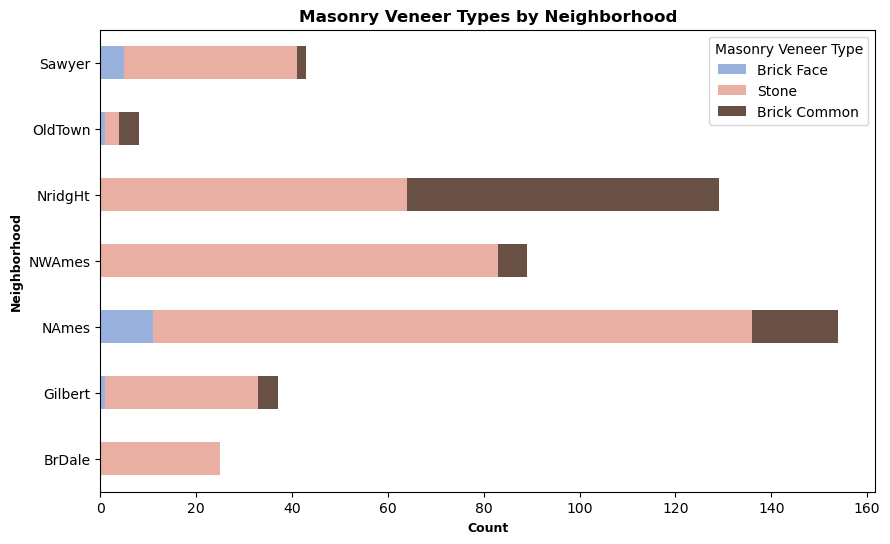

In [48]:
mas_vnr = raw2[["Neighborhood", "Mas Vnr Type", "Mas Vnr Area"]][(raw2["Mas Vnr Type"] != "None") & (raw2["Mas Vnr Type"].notnull())]

mas_vnr = mas_vnr[mas_vnr["Neighborhood"].isin(["NridgHt", "Sawyer", "Gilbert", "BrDale", "OldTown", "NWAmes", "NAmes"])]

mas_vnr = mas_vnr.groupby("Neighborhood")["Mas Vnr Type"].value_counts().to_frame()

mas_vnr_pivot = mas_vnr.unstack(level=1)

palette = ["#99B2DD", "#E9AFA3", "#685044"]
labels = ["Brick Face", "Stone", "Brick Common"]

mas_vnr_pivot.plot(kind="barh", stacked=True, figsize=(10, 6), color=palette)

plt.xlabel("Count", fontweight="bold", fontsize=9)
plt.ylabel("Neighborhood", fontweight="bold", fontsize=9)
plt.title("Masonry Veneer Types by Neighborhood", fontweight="bold")
plt.legend(title="Masonry Veneer Type", labels=labels)
plt.show()

<br> All the neighborhoods except Northridge Heights and Old Town, have Brick Face as the most common masonry veneer type. The missing values will be replaced with the most frequent value by neighborhood.

In [49]:
raw2.loc[[1286, 1546, 1737, 2135, 2256], "Mas Vnr Type"] = "BrkFace"

raw2.loc[[631, 1975], "Mas Vnr Type"] = "Stone"

print(f"The column Masonry Veneer Type in raw2 now has {raw2['Mas Vnr Type'].isnull().sum()} missing values.")

The column Masonry Veneer Type in raw2 now has 0 missing values.


<br> **Basement**

In [50]:
bsmt = [x for x in raw2.columns if x.startswith(("Bsmt")) or "Bsmt" in x]

print(f"There are {raw2[bsmt].shape[1]} variables that capture basement data and have a total of {raw2[bsmt].isnull().sum().sum()} missing values in the training dataset\
 and {raw2_te[bsmt].isnull().sum().sum()} in the test dataset.\n")

There are 11 variables that capture basement data and have a total of 367 missing values in the training dataset and 45 in the test dataset.



In [51]:
print(f"Training dataset:\n")

raw2[bsmt].info()

Training dataset:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2430 entries, 0 to 2429
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Bsmt Qual       2359 non-null   object 
 1   Bsmt Cond       2359 non-null   object 
 2   Bsmt Exposure   2356 non-null   object 
 3   BsmtFin Type 1  2359 non-null   object 
 4   BsmtFin SF 1    2429 non-null   float64
 5   BsmtFin Type 2  2358 non-null   object 
 6   BsmtFin SF 2    2429 non-null   float64
 7   Bsmt Unf SF     2429 non-null   float64
 8   Total Bsmt SF   2429 non-null   float64
 9   Bsmt Full Bath  2428 non-null   float64
 10  Bsmt Half Bath  2428 non-null   float64
dtypes: float64(6), object(5)
memory usage: 209.0+ KB


In [52]:
print(f"Test dataset:\n")

raw2_te[bsmt].info()

Test dataset:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Bsmt Qual       491 non-null    object 
 1   Bsmt Cond       491 non-null    object 
 2   Bsmt Exposure   491 non-null    object 
 3   BsmtFin Type 1  491 non-null    object 
 4   BsmtFin SF 1    500 non-null    float64
 5   BsmtFin Type 2  491 non-null    object 
 6   BsmtFin SF 2    500 non-null    float64
 7   Bsmt Unf SF     500 non-null    float64
 8   Total Bsmt SF   500 non-null    float64
 9   Bsmt Full Bath  500 non-null    float64
 10  Bsmt Half Bath  500 non-null    float64
dtypes: float64(6), object(5)
memory usage: 43.1+ KB


<br> The list bsmt_obj stores all the basement variables with an object data type and bsmt_float stores all the basement variables with float64.

In [53]:
bsmt_obj = [x for x in raw2.columns if x.startswith(("Bsmt")) and raw2[x].dtypes == "object"]

bsmt_float = [x for x in raw2.columns if (x.startswith(("Bsmt")) or "Bsmt" in x) and raw2[x].dtypes == "float64"]

<br>If all basement variables have missinng values, a reasonable assumption would be that the houses may not have a basement therefore NA or 0.0 are fair substitutes. 

In [54]:
raw2[bsmt][raw2[bsmt].isnull().all(axis=1)]

,Bsmt Qual,Bsmt Cond,Bsmt Exposure,BsmtFin Type 1,BsmtFin SF 1,BsmtFin Type 2,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,Bsmt Full Bath,Bsmt Half Bath
104,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [55]:
raw2.loc[104, bsmt_obj] = "NA"

raw2.loc[104, bsmt_float] = 0.0

In [56]:
print(f"All the basement variables in raw2 now have {raw2[bsmt].isnull().sum().sum()} missing values across\
 {raw2[raw2[bsmt].isnull().any(axis=1)].shape[0]} rows.")

All the basement variables in raw2 now have 356 missing values across 74 rows.


In [57]:
print(f"The test dataset does not have any rows that meet the defined condition.\n")

raw2_te[bsmt][raw2_te[bsmt].isnull().all(axis=1)]

The test dataset does not have any rows that meet the defined condition.



,Bsmt Qual,Bsmt Cond,Bsmt Exposure,BsmtFin Type 1,BsmtFin SF 1,BsmtFin Type 2,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,Bsmt Full Bath,Bsmt Half Bath


<br> As majority of the remianing rows with missing values across the basement columns are categorical variables with a large cardinality, inspecting the variables of dtype object will help determine which rating is most fitting to replace each NaN value with. If all the columns of float dtype have the value 0.0, a fair assumption would be that NA is the most appropriate substitution as the observations are likey to not have a basement. 

In [58]:
print(f"Training dataset:\n")

with pd.option_context("display.max_rows", None,):
 display(raw2[bsmt][raw2[bsmt_obj].isnull().all(axis=1)])

Training dataset:



,Bsmt Qual,Bsmt Cond,Bsmt Exposure,BsmtFin Type 1,BsmtFin SF 1,BsmtFin Type 2,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,Bsmt Full Bath,Bsmt Half Bath
35,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
48,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
75,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
117,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
152,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
176,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
217,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
233,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
234,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
252,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0


In [59]:
mask7 = raw2[bsmt_obj].isnull().all(axis=1)

mask7 = raw2[mask7 == True]

raw2.loc[mask7.index, bsmt_obj] = "NA"

print(f"The selected columns now have {raw2[bsmt_obj].isnull().all(axis=1).sum()} missing values.")

The selected columns now have 0 missing values.


<br>

In [60]:
print(f"All basement variables in raw2 now have {raw2[bsmt].isnull().sum().sum()} missing values across\
 {raw2[raw2[bsmt].isnull().any(axis=1)].shape[0]} rows.")

All basement variables in raw2 now have 6 missing values across 5 rows.


In [61]:
print(f"Test dataset:\n")

raw2_te[bsmt][raw2_te[bsmt_obj].isnull().all(axis=1)]

Test dataset:



,Bsmt Qual,Bsmt Cond,Bsmt Exposure,BsmtFin Type 1,BsmtFin SF 1,BsmtFin Type 2,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,Bsmt Full Bath,Bsmt Half Bath
19,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
23,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
101,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
293,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
309,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
425,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
431,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
448,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0
499,NaN,NaN,NaN,NaN,0.0,NaN,0.0,0.0,0.0,0.0,0.0


In [62]:
mask8 = raw2_te[bsmt_obj].isnull().all(axis=1)

mask8 = raw2_te[mask8 == True]

raw2_te.loc[mask8.index, bsmt_obj] = "NA"

print(f"The selected columns now have {raw2_te[bsmt_obj].isnull().all(axis=1).sum()} missing values.")

The selected columns now have 0 missing values.


In [63]:
print(f"All basement variables in raw2_te now have {raw2_te[bsmt].isnull().sum().sum()} missing values across\
 {raw2_te[raw2_te[bsmt].isnull().any(axis=1)].shape[0]} rows.")

All basement variables in raw2_te now have 0 missing values across 0 rows.


<br>

In [64]:
print(f"The sum of rows with more than one missing value in the training dataset is {raw2[bsmt][raw2[bsmt_float].isnull().any(axis=1)].shape[0]} which are in the columns:\n")

raw2[bsmt_float].columns[raw2[bsmt_float].isnull().any()]

The sum of rows with more than one missing value in the training dataset is 1 which are in the columns:



Index(['Bsmt Full Bath', 'Bsmt Half Bath'], dtype='object')

In [65]:
print(f"The observation with missing values in the columns Bsmt Full Bath and Bsmt Half Bath is:\n")

raw2[bsmt][(raw2["Bsmt Full Bath"].isnull()) & (raw2["Bsmt Half Bath"].isnull())].index

The observation with missing values in the columns Bsmt Full Bath and Bsmt Half Bath is:



Index([2056], dtype='int64')

In [66]:
raw2[bsmt].iloc[2056]

Bsmt Qual          NA
Bsmt Cond          NA
Bsmt Exposure      NA
BsmtFin Type 1     NA
BsmtFin SF 1      0.0
BsmtFin Type 2     NA
BsmtFin SF 2      0.0
Bsmt Unf SF       0.0
Total Bsmt SF     0.0
Bsmt Full Bath    NaN
Bsmt Half Bath    NaN
Name: 2056, dtype: object

<br> Of the basement columns at index 2056 that have numeric data, the value is 0.0 which likely suggests that the property does not have a basement. Moreover, as the variables with an object data type have been substituted with NA which indicates the residential property does not have the respective basement feature, replacing the two NaN values with 0.0 is fitting.

In addition, converting the numeric columns to dtype int64 better defines both attributes as per the detailed data description documentation.

In [67]:
raw2.loc[2056, bsmt_float] = 0.0

In [68]:
raw2[["Bsmt Full Bath", "Bsmt Half Bath"]] = raw2[["Bsmt Full Bath", "Bsmt Half Bath"]].astype("int64")

In [69]:
print(f"The basement features in raw2 that have missing values are:\n ")

bsmt2 = [x for x in bsmt if raw2[x].isnull().any()]

print(raw2[bsmt2].dtypes)

The basement features in raw2 that have missing values are:
 
Bsmt Exposure     object
BsmtFin Type 2    object
dtype: object


<br> Visualising the count of unique categorical values of the observations that have missing values will help determine whether substituting the most frequent rating by neighborhood is a reasoanable replacement. 

In [70]:
mask9 = raw2.loc[raw2[bsmt2].isnull().any(axis=1), bsmt + ['Neighborhood']]

mask9

,Bsmt Qual,Bsmt Cond,Bsmt Exposure,BsmtFin Type 1,BsmtFin SF 1,BsmtFin Type 2,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,Bsmt Full Bath,Bsmt Half Bath,Neighborhood
602,Gd,TA,No,GLQ,1124.0,NaN,479.0,1603.0,3206.0,1,0,NridgHt
875,Gd,TA,NaN,Unf,0.0,Unf,0.0,1595.0,1595.0,0,0,Somerst
1681,Gd,TA,NaN,Unf,0.0,Unf,0.0,725.0,725.0,0,0,Somerst
1726,Gd,TA,NaN,Unf,0.0,Unf,0.0,936.0,936.0,0,0,CollgCr


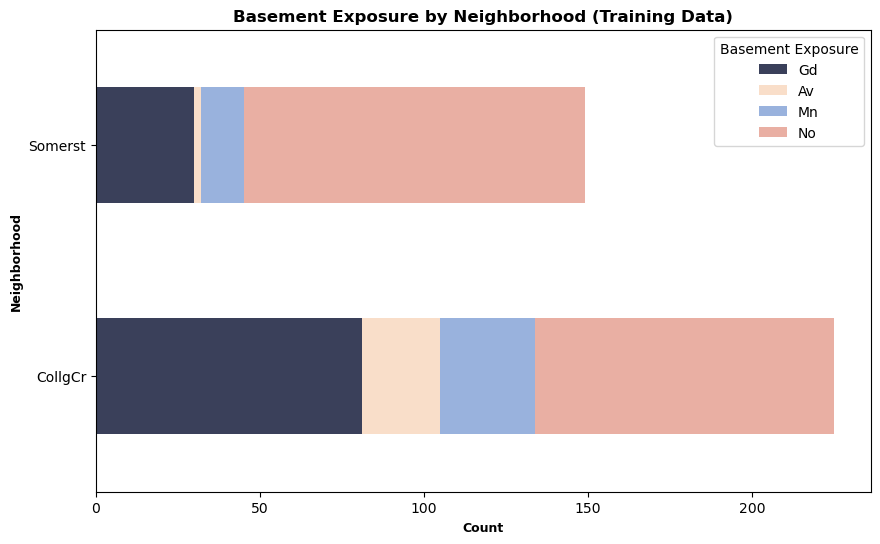

In [71]:
bsmt_exposure = raw2[["Neighborhood", "Bsmt Exposure"]]

bsmt_exposure = bsmt_exposure[bsmt_exposure["Neighborhood"].isin(["Somerst", "CollgCr"])]

bsmt_exposure = bsmt_exposure.groupby("Neighborhood")["Bsmt Exposure"].value_counts().to_frame()

bsmt_exposure_pivot = bsmt_exposure.unstack(level=1)

palette = ["#3A405A", "#F9DEC9", "#99B2DD", "#E9AFA3", "#685044"]
labels = ["Gd", "Av", "Mn", "No", "NA"]

bsmt_exposure_pivot.plot(kind="barh", stacked=True, figsize=(10, 6), color=palette)

plt.xlabel("Count", fontweight="bold", fontsize=9)
plt.ylabel("Neighborhood", fontweight="bold", fontsize=9)
plt.title("Basement Exposure by Neighborhood (Training Data)", fontweight="bold")
plt.legend(title="Basement Exposure", labels=labels)
plt.show()

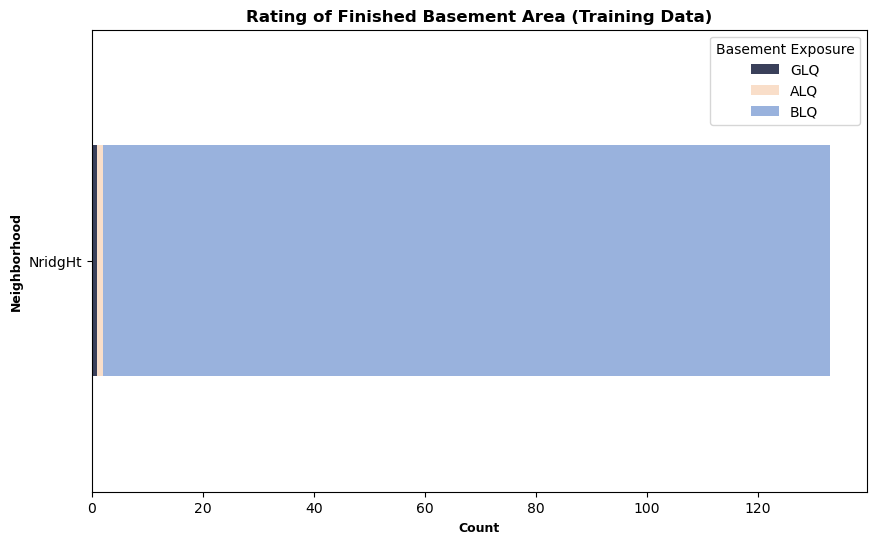

In [72]:
bsmt_type2 = raw2[["Neighborhood", "BsmtFin Type 2"]]

bsmt_type2 = bsmt_type2[bsmt_type2["Neighborhood"].isin(["NridgHt"])]

bsmt_type2 = bsmt_type2.groupby("Neighborhood")["BsmtFin Type 2"].value_counts().to_frame()

bsmt_type2_pivot = bsmt_type2.unstack(level=1)

palette = ["#3A405A", "#F9DEC9", "#99B2DD", "#E9AFA3", "#685044", "#C9F9DE", "#DEC9F9"]
labels = ["GLQ", "ALQ", "BLQ", "Rec", "LwQ", "Unf", "NA"]

bsmt_type2_pivot.plot(kind="barh", stacked=True, figsize=(10, 6), color=palette)

plt.xlabel("Count", fontweight="bold", fontsize=9)
plt.ylabel("Neighborhood", fontweight="bold", fontsize=9)
plt.title("Rating of Finished Basement Area (Training Data)", fontweight="bold")
plt.legend(title="Basement Exposure", labels=labels)
plt.show()

<br>The respective modes are used to substitute the missing values.

In [73]:
raw2.loc[[875, 1681, 1726], "Bsmt Exposure"] = raw2["Bsmt Exposure"].mode()[0]

In [74]:
raw2.loc[602, "BsmtFin Type 2"] = "BLQ"

In [75]:
print(f"All basement variables in raw2 now have {raw2[bsmt].isnull().sum().sum()} missing values.")

All basement variables in raw2 now have 0 missing values.


<br>**Electrical**

In [76]:
print(f"The feature only has {raw2['Electrical'].isnull().sum()} missing values in the training dataset.")

The feature only has 1 missing values in the training dataset.


In [77]:
print("The row with a missing value is index:\n")

raw2["Electrical"][raw2["Electrical"].isnull()]

The row with a missing value is index:



694    NaN
Name: Electrical, dtype: object

In [78]:
print("Observation 694 was built in Timber in 2006.\n")

raw2.loc[694, ["Electrical", "Year Built", "Neighborhood"]].to_frame()

Observation 694 was built in Timber in 2006.



,694
Electrical,NaN
Year Built,2006
Neighborhood,Timber


In [79]:
print("Of the properties built in 2006, SBrkr was the electrical system of choice.\n")

raw2[["Year Built", "Electrical"]][raw2["Year Built"]  == 2006].value_counts().to_frame()

Of the properties built in 2006, SBrkr was the electrical system of choice.



,,count
Year Built,Electrical,
2006,SBrkr,108


In [80]:
elec = raw2[["Neighborhood", "Year Built", "Electrical"]].groupby("Neighborhood").get_group("Timber")

print(f"The neighborhood Timber has {elec['Electrical'].nunique()} unique values:\n")

elec['Electrical'].value_counts()

The neighborhood Timber has 2 unique values:



Electrical
SBrkr    58
FuseA     1
Name: count, dtype: int64

In [81]:
print(f"{round(raw2['Electrical'].value_counts().max() / len(raw2['Electrical']) * 100, 2)}% \
of the observations have the electrical system SBrkr:\n\n{raw2['Electrical'].value_counts()}")

91.48% of the observations have the electrical system SBrkr:

Electrical
SBrkr    2223
FuseA     160
FuseF      38
FuseP       7
Mix         1
Name: count, dtype: int64


In [82]:
print("The most recently built houses installed with the electrical systems FuseF, FuseA, FuseP and Mix were built in 1965, 1960,\
 1955 and 1920 respectively. In comparison, houses built between 1965 and 2010,\
 which is over a 45 year period have the SBrkr electrical system. \n\nDomain knowledge could verify\
 the reasons behind the preferred installation of SBrkr.")

raw2.groupby("Electrical").agg(min_year_built=("Year Built", "min"),
    max_year_built=("Year Built", "max"),
    distinct_neighborhood_count=("Neighborhood", "nunique")).sort_values(by="max_year_built", ascending=False)

The most recently built houses installed with the electrical systems FuseF, FuseA, FuseP and Mix were built in 1965, 1960, 1955 and 1920 respectively. In comparison, houses built between 1965 and 2010, which is over a 45 year period have the SBrkr electrical system. 

Domain knowledge could verify the reasons behind the preferred installation of SBrkr.


,min_year_built,max_year_built,distinct_neighborhood_count
Electrical,,,
SBrkr,1875,2010,28
FuseF,1902,1965,8
FuseA,1879,1960,13
FuseP,1910,1955,4
Mix,1920,1920,1


<br> SBrkr is likely the most appropriate substitute as it is the most frequent electrical system installed amongst properties in the neighborhood Timber. Moreover, all properties built in 2006, as is the obervaion with a missing value, have the electrical system SBrKr. Of the observations that have the other four electrical systems, the maximum year for each installation ranges between 1955 to 1965, whereas properties built in 1966 onwards have the electrical system SBrKr. Therefore, substituting NaN with SBrkr may be a reasonable replacement.

In [83]:
raw2.loc[694, "Electrical"] = "SBrkr"

In [84]:
print(f"The column Electrical now has {raw2['Electrical'].isnull().sum()} missing values.")

The column Electrical now has 0 missing values.


<br> **Fireplace**

Of the observations that have a missing value in the Fireplace Qu column, the count of fireplaces from the variable Fireplaces will help determine the most appropriate value to replace the NaN values with.

In [85]:
print(f"The columns that hold data on fireplace are: {[x for x in raw2.columns if x.startswith(('Fire'))]}")

The columns that hold data on fireplace are: ['Fireplaces', 'Fireplace Qu']


In [86]:
print(f"The training dataset has {raw2['Fireplace Qu'].isnull().sum()} missing values, and test dataset has {raw2_te['Fireplace Qu'].isnull().sum()} missing values.")

The training dataset has 1186 missing values, and test dataset has 236 missing values.


In [87]:
mask10 = raw2[["Fireplaces", "Fireplace Qu"]][raw2["Fireplace Qu"].isnull()]

print(f"Training dataset:\n")

print(f"Of the missing values in the Fireplace Qu column, the sum of rows that have more than one fireplace is\
 {mask10[mask10['Fireplaces'] > 0].sum().sum()}.")

Training dataset:

Of the missing values in the Fireplace Qu column, the sum of rows that have more than one fireplace is 0.


In [88]:
mask11 = raw2_te[["Fireplaces", "Fireplace Qu"]][raw2_te["Fireplace Qu"].isnull()]

print(f"Test dataset:\n")

print(f"Of the missing values in the Fireplace Qu column, the sum of rows that have more than one fireplace is\
 {mask11[mask11['Fireplaces'] > 0].sum().sum()}.")

Test dataset:

Of the missing values in the Fireplace Qu column, the sum of rows that have more than one fireplace is 0.


<br>

<br>As all the filtered observations do not have a fireplace, replacing the NaN values with NA is reasonable.

In [89]:
raw2.loc[mask10.index, "Fireplace Qu"] = "NA"

In [90]:
raw2_te.loc[mask11.index, "Fireplace Qu"] = "NA"

In [91]:
print(f"The column Fireplace Qu in raw2 now has {raw2['Fireplace Qu'].isnull().sum()} missing values, and\
 {raw2['Fireplace Qu'].isnull().sum()} missing values in raw2_te.")

The column Fireplace Qu in raw2 now has 0 missing values, and 0 missing values in raw2_te.


<br> **Garage**

In [92]:
gar = [x for x in raw2.columns if x.startswith(("Gara"))]

print(f"There are {raw2[gar].isnull().sum().sum()} missing values in the training set.\n")

raw2[gar].isnull().sum()

There are 690 missing values in the training set.



Garage Type      136
Garage Yr Blt    138
Garage Finish    138
Garage Cars        1
Garage Area        1
Garage Qual      138
Garage Cond      138
dtype: int64

In [93]:
print(f"There are {raw2_te[gar].isnull().sum().sum()} missing values in the test set.\n")

raw2_te[gar].isnull().sum()

There are 105 missing values in the test set.



Garage Type      21
Garage Yr Blt    21
Garage Finish    21
Garage Cars       0
Garage Area       0
Garage Qual      21
Garage Cond      21
dtype: int64

<br> Of the observations with with a NaN value across all the garage features with an object data type, and the value 0.0 in the columns Garage Cars and Garage Area, a reasonable assumption would be that the filtered observations do not have a garage therefore substituting the missing value with NA is fitting.

The variables mask12 and mask13 store all rows across the garage variables with more than one missing value, and the value 0.0 in the columns Garage Cars and Garage Area.

In [94]:
mask12 = raw2[gar].loc[(raw2[gar].isnull().any(axis=1)) & ((raw2["Garage Cars"] == 0.0) | (raw2["Garage Area"] == 0.0))]

mask12

,Garage Type,Garage Yr Blt,Garage Finish,Garage Cars,Garage Area,Garage Qual,Garage Cond
16,NaN,NaN,NaN,0.0,0.0,NaN,NaN
48,NaN,NaN,NaN,0.0,0.0,NaN,NaN
62,NaN,NaN,NaN,0.0,0.0,NaN,NaN
73,NaN,NaN,NaN,0.0,0.0,NaN,NaN
76,NaN,NaN,NaN,0.0,0.0,NaN,NaN
...,...,...,...,...,...,...,...
2292,NaN,NaN,NaN,0.0,0.0,NaN,NaN
2308,NaN,NaN,NaN,0.0,0.0,NaN,NaN
2314,NaN,NaN,NaN,0.0,0.0,NaN,NaN
2354,NaN,NaN,NaN,0.0,0.0,NaN,NaN


In [95]:
raw2.loc[mask12.index, ["Garage Type", "Garage Finish", "Garage Qual", "Garage Cond"]] = "NA"

In [96]:
mask13 = raw2_te[gar].loc[(raw2_te[gar].isnull().any(axis=1)) & ((raw2_te["Garage Cars"] == 0.0) | (raw2_te["Garage Area"] == 0.0))]

mask13

,Garage Type,Garage Yr Blt,Garage Finish,Garage Cars,Garage Area,Garage Qual,Garage Cond
6,NaN,NaN,NaN,0.0,0.0,NaN,NaN
58,NaN,NaN,NaN,0.0,0.0,NaN,NaN
62,NaN,NaN,NaN,0.0,0.0,NaN,NaN
63,NaN,NaN,NaN,0.0,0.0,NaN,NaN
81,NaN,NaN,NaN,0.0,0.0,NaN,NaN
101,NaN,NaN,NaN,0.0,0.0,NaN,NaN
102,NaN,NaN,NaN,0.0,0.0,NaN,NaN
184,NaN,NaN,NaN,0.0,0.0,NaN,NaN
199,NaN,NaN,NaN,0.0,0.0,NaN,NaN
212,NaN,NaN,NaN,0.0,0.0,NaN,NaN


In [97]:
raw2_te.loc[mask13.index, ["Garage Type", "Garage Finish", "Garage Qual", "Garage Cond"]] = "NA"

In [98]:
print(f"All garage features in the training data set now have {raw2[gar].isnull().sum().sum()} missing values.\n")

raw2[gar].isnull().sum()

All garage features in the training data set now have 146 missing values.



Garage Type        0
Garage Yr Blt    138
Garage Finish      2
Garage Cars        1
Garage Area        1
Garage Qual        2
Garage Cond        2
dtype: int64

In [99]:
print(f"All garage features in the test dataset now have {raw2_te[gar].isnull().sum().sum()} missing values.\n")

raw2_te[gar].isnull().sum()

All garage features in the test dataset now have 21 missing values.



Garage Type       0
Garage Yr Blt    21
Garage Finish     0
Garage Cars       0
Garage Area       0
Garage Qual       0
Garage Cond       0
dtype: int64

<br> Of the rows in the training and test data set with missing values in the column Garage Year Built, substituting the null values with the year the property was built is likely appropriate.

In [100]:
mask14 = raw2[gar][raw2["Garage Yr Blt"].isnull()]

mask14

,Garage Type,Garage Yr Blt,Garage Finish,Garage Cars,Garage Area,Garage Qual,Garage Cond
16,NA,NaN,NA,0.0,0.0,NA,NA
48,NA,NaN,NA,0.0,0.0,NA,NA
62,NA,NaN,NA,0.0,0.0,NA,NA
73,NA,NaN,NA,0.0,0.0,NA,NA
76,NA,NaN,NA,0.0,0.0,NA,NA
...,...,...,...,...,...,...,...
2292,NA,NaN,NA,0.0,0.0,NA,NA
2308,NA,NaN,NA,0.0,0.0,NA,NA
2314,NA,NaN,NA,0.0,0.0,NA,NA
2354,NA,NaN,NA,0.0,0.0,NA,NA


In [101]:
raw2.loc[mask14.index, "Garage Yr Blt"] = raw2["Year Built"]

print(f"All the garage features in raw2 now have {raw2[gar].isnull().sum().sum()} missing values.")

raw2[gar].isnull().sum()

All the garage features in raw2 now have 8 missing values.


Garage Type      0
Garage Yr Blt    0
Garage Finish    2
Garage Cars      1
Garage Area      1
Garage Qual      2
Garage Cond      2
dtype: int64

In [102]:
mask15 = raw2_te[gar][raw2_te["Garage Yr Blt"].isnull()]

mask15

,Garage Type,Garage Yr Blt,Garage Finish,Garage Cars,Garage Area,Garage Qual,Garage Cond
6,NA,NaN,NA,0.0,0.0,NA,NA
58,NA,NaN,NA,0.0,0.0,NA,NA
62,NA,NaN,NA,0.0,0.0,NA,NA
63,NA,NaN,NA,0.0,0.0,NA,NA
81,NA,NaN,NA,0.0,0.0,NA,NA
101,NA,NaN,NA,0.0,0.0,NA,NA
102,NA,NaN,NA,0.0,0.0,NA,NA
184,NA,NaN,NA,0.0,0.0,NA,NA
199,NA,NaN,NA,0.0,0.0,NA,NA
212,NA,NaN,NA,0.0,0.0,NA,NA


In [103]:
raw2_te.loc[mask15.index, "Garage Yr Blt"] = raw2_te["Year Built"]

print(f"All the garage features in raw2_te now have {raw2_te[gar].isnull().sum().sum()} missing values.")

All the garage features in raw2_te now have 0 missing values.


<br>There are now two observations with garage features that have missing values in the training set.

In [104]:
raw2[gar][raw2[gar].isna().any(axis=1)]

,Garage Type,Garage Yr Blt,Garage Finish,Garage Cars,Garage Area,Garage Qual,Garage Cond
1114,Detchd,1910.0,NaN,1.0,360.0,NaN,NaN
1565,Detchd,1923.0,NaN,NaN,NaN,NaN,NaN


<br>Selecting the most frequent value to replace the 10 NaN values may not be a meaningful substitution; domain knowledge would be helpful to better assess which values would be a fitting alternative. Therefore, NA and 0.0 are likely the most appropriate replacements for all the NaN values.

In [105]:
raw2[gar].loc[(raw2[gar].isnull().any(axis=1))]

,Garage Type,Garage Yr Blt,Garage Finish,Garage Cars,Garage Area,Garage Qual,Garage Cond
1114,Detchd,1910.0,NaN,1.0,360.0,NaN,NaN
1565,Detchd,1923.0,NaN,NaN,NaN,NaN,NaN


In [106]:
raw2.loc[1114, ["Garage Yr Blt", "Year Built", "Year Remod/Add"]]

Garage Yr Blt     1910.0
Year Built          1910
Year Remod/Add      1983
Name: 1114, dtype: object

In [107]:
raw2.loc[[1114, 1565], ["Garage Finish", "Garage Qual", "Garage Cond"]] = "NA"

In [108]:
raw2.loc[1565, ["Garage Cars", "Garage Area"]] = 0.0

In [109]:
raw2.loc[[1114, 1565], "Garage Yr Blt"] = raw2["Year Built"]

In [110]:
print(f"All garage features in raw2 now have {raw2[gar].isnull().sum().sum()} missing values.")

All garage features in raw2 now have 0 missing values.


In [111]:
print(f"All garage features in raw2_te now have {raw2_te[gar].isnull().sum().sum()} missing values.")

All garage features in raw2_te now have 0 missing values.


In [112]:
print(f"Training set descriptivr statistics (numeric features):\n")

raw2[gar].describe()

Training set descriptivr statistics (numeric features):



,Garage Yr Blt,Garage Cars,Garage Area
count,2430.000000,2430.000000,2430.000000
mean,1975.950617,1.761728,471.785185
std,27.078177,0.758929,215.921493
min,1875.000000,0.000000,0.000000
25%,1958.250000,1.000000,323.250000
50%,1977.000000,2.000000,478.000000
75%,2001.000000,2.000000,576.000000
max,2207.000000,4.000000,1488.000000


The feature Garage Yr Blt has an unrealistic maximum value as the collected observations are of residential properties sold between 2006 and 2010.

In [113]:
raw2[raw2["Garage Yr Blt"] == 2207].index

Index([2219], dtype='int64')

In [114]:
raw2.loc[2219, gar + ["Year Built", "Year Remod/Add"]]

Garage Type       Attchd
Garage Yr Blt     2207.0
Garage Finish        RFn
Garage Cars          2.0
Garage Area        502.0
Garage Qual           TA
Garage Cond           TA
Year Built          2006
Year Remod/Add      2007
Name: 2219, dtype: object

<br>Replacing 2207 with the Year Remod/Add date is a reasonable substitution as the second digit, 2, is likely a typing error.

In [115]:
raw2.loc[2219, "Garage Yr Blt"] = 2007

<br> Converting the columns Garage Yr Blt and Garage Cars to dtype int64 best describes both features as per the detailed document description. 

In [116]:
raw2[["Garage Yr Blt", "Garage Cars"]] = raw2[["Garage Yr Blt", "Garage Cars"]].astype("int64")

In [117]:
raw2_te[["Garage Yr Blt", "Garage Cars"]] = raw2_te[["Garage Yr Blt", "Garage Cars"]].astype("int64")

<br>**Pool**

A fair assumption would be that houses with a pool area of 0 square feet do not have pools, therefore filling NA is a reasonable substitute.

In [118]:
print("Sum of null values with a pool area of 0 in raw2:\n")

raw2[raw2["Pool Area"] == 0].shape[0]

Sum of null values with a pool area of 0 in raw2:



2418

In [119]:
raw2["Pool QC"] = raw2["Pool QC"].fillna("NA")

print(f"The column pool QC in raw2 now has {raw2['Pool QC'].isnull().sum()} missing values.")

The column pool QC in raw2 now has 0 missing values.


In [120]:
print("Sum of null values with a pool area of 0 in raw2_te:\n")

raw2_te[raw2_te["Pool Area"] == 0].shape[0]

Sum of null values with a pool area of 0 in raw2_te:



499

In [121]:
raw2_te["Pool QC"] = raw2_te["Pool QC"].fillna("NA")

print(f"The column pool QC in raw2_te now has {raw2_te['Pool QC'].isnull().sum()} missing values.")

The column pool QC in raw2_te now has 0 missing values.


<br> **Fence**

A reasonable assumption would be that observations that have a missing value in the column Fence are fenceless properties, therefore NA is a reasonable substitution.

In [122]:
print(f"There are {raw2['Fence'].isnull().sum()} observations in raw2 with missing values in the Fence column.")

There are 1941 observations in raw2 with missing values in the Fence column.


In [123]:
raw2.fillna({"Fence": "NA"}, inplace=True)

In [124]:
print(f"The column Fence now has {raw2['Fence'].isnull().sum()} missing values.")

The column Fence now has 0 missing values.


In [125]:
print(f"There are {raw2_te['Fence'].isnull().sum()} observations in raw2_te with missing values in the Fence column.")

There are 417 observations in raw2_te with missing values in the Fence column.


In [126]:
raw2_te.fillna({"Fence": "NA"}, inplace=True)

In [127]:
print(f"The column Fence now has {raw2_te['Fence'].isnull().sum()} missing values.")

The column Fence now has 0 missing values.


<br>**Misc Feature**

As the column Misc Val has 0 missing values, a fair assumption would be that observations with a miscellaneous value of $0 may not have any miscellaneous features, therefore susbtituting missing values in the Misc Feature column with NA is reflective of this absence. 

In [128]:
mask16 = raw2[["Misc Feature", "Misc Val"]][raw2["Misc Feature"].isnull()]

mask16

,Misc Feature,Misc Val
0,NaN,0
1,NaN,0
2,NaN,0
3,NaN,0
4,NaN,0
...,...,...
2425,NaN,0
2426,NaN,0
2427,NaN,0
2428,NaN,0


In [129]:
raw2.loc[mask16.index, "Misc Feature"] = "NA"

In [130]:
print(f"The column Misc Feature in raw2 now has {raw2['Misc Val'].isnull().sum()} missing values.")

The column Misc Feature in raw2 now has 0 missing values.


In [131]:
mask17 = raw2_te[["Misc Feature", "Misc Val"]][raw2_te["Misc Feature"].isnull()]

mask17

,Misc Feature,Misc Val
0,NaN,0
1,NaN,0
2,NaN,0
3,NaN,0
4,NaN,0
...,...,...
493,NaN,0
496,NaN,0
497,NaN,0
498,NaN,0


In [132]:
raw2_te.loc[mask17.index, "Misc Feature"] = "NA"

In [133]:
print(f"The column Misc Feature in raw2_te now has {raw2_te['Misc Val'].isnull().sum()} missing values.")

The column Misc Feature in raw2_te now has 0 missing values.


<br> **Lot Frontage**

Null Count (training dataset): 420

Null Count (test dataset): 70


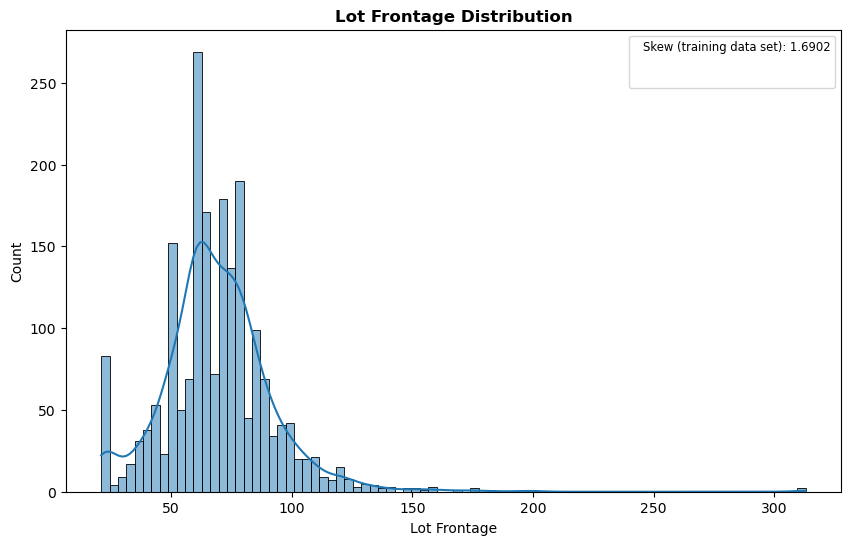

In [134]:
print("Null Count (training dataset):", raw2["Lot Frontage"].isnull().sum())

print(f"\nNull Count (test dataset): {raw2_te['Lot Frontage'].isnull().sum()}")


legend_label = (
    f"Skew (training data set): {round(raw2['Lot Frontage'].skew(), 4)}\n\n"
    )

plt.figure(figsize=(10, 6))

sns.histplot(raw2['Lot Frontage'], kde=True)

plt.title("Lot Frontage Distribution", fontweight="bold")
plt.legend([legend_label], loc="upper right", handlelength=0, handleheight=0, fontsize="small")

plt.show()

The absence of lot fronatge data is unlikely indicative of the observations not having lot frontages. Substituting the median may therefore be more accurate as the feature is right skewed.

In [135]:
raw2.loc[raw2[raw2["Lot Frontage"].isnull()].index, "Lot Frontage"] = pd.concat([raw2["Lot Frontage"], raw2_te["Lot Frontage"]], ignore_index=True).median()

In [136]:
print(f"The training dataset now has {raw2.isnull().sum().sum()} missing values.")

The training dataset now has 0 missing values.


In [137]:
raw2_te.loc[raw2_te[raw2_te["Lot Frontage"].isnull()].index, "Lot Frontage"] = pd.concat([raw2["Lot Frontage"], raw2_te["Lot Frontage"]], ignore_index=True).median()

In [138]:
print(f"The test dataset now has {raw2.isnull().sum().sum()} missing values.")

The test dataset now has 0 missing values.


<br>

### **Numeric Inconsistencies**

Of the observations with a year sold date that's before the year each house was built or remodelled, or a remodelled date that's eariler than the consturction of the residential property, the inconsitent value will be replaced with the respective mode. Modal score provides a meaningful measure of central tendancy. 

In [139]:
print(f"Training Set:\n")

raw2[["Neighborhood", "Year Built", "Year Remod/Add", "Yr Sold"]][(raw2["Yr Sold"] < raw2["Year Built"]) |
(raw2["Year Remod/Add"] > raw2["Yr Sold"]) | (raw2["Year Remod/Add"] < raw2["Year Built"])]

Training Set:



,Neighborhood,Year Built,Year Remod/Add,Yr Sold
71,Edwards,2008,2009,2007
263,NridgHt,2007,2008,2007


In [140]:
mask20 = raw2.loc[~raw2.index.isin([71, 263])]

In [141]:
print(f"Test Set:\n")

raw2_te[["Neighborhood", "Year Built", "Year Remod/Add", "Yr Sold"]][(raw2_te["Yr Sold"] < raw2_te["Year Built"]) |
(raw2_te["Year Remod/Add"] > raw2_te["Yr Sold"]) | (raw2_te["Year Remod/Add"] < raw2_te["Year Built"])]

Test Set:



,Neighborhood,Year Built,Year Remod/Add,Yr Sold
182,CollgCr,2002,2001,2009
194,Edwards,2007,2008,2007


In [142]:
mask21 = raw2_te.loc[~raw2_te.index.isin([182, 194])]

<br>The funtion yrSold_mode computes the mode of observations that were built in a given year. 

In [143]:
def yrSold_mode(df_tr, year):
    
    remodel_yr = df_tr[df_tr["Year Remod/Add"] == year]

    yr_sold = remodel_yr["Yr Sold"].mode().iloc[0]
    
    return yr_sold

In [144]:
print(yrSold_mode(mask20, 2009), f"is the year sold mode for houses remodelled in 2008.\n")

print(yrSold_mode(mask20, 2008), "is the year sold mode for houses remodelled in 2009.")

2009 is the year sold mode for houses remodelled in 2008.

2009 is the year sold mode for houses remodelled in 2009.


In [145]:
raw2.loc[71, "Yr Sold"] = 2009

raw2.loc[263, "Yr Sold"] = 2009

In [146]:
print(yrSold_mode(mask20, 2008), "is the year sold mode for houses remodelled in 2008.")

2009 is the year sold mode for houses remodelled in 2008.


In [147]:
raw2_te.loc[194, "Yr Sold"] = 2009

<br>The funtion yrRemod_mode computes the mode of observations that were remodelled in a given year. 

In [148]:
def yrRemod_mode(df_tr, year):
    
    yr_built = df_tr[df_tr["Year Built"] == year]
    
    yr_remod = yr_built["Year Remod/Add"].mode().iloc[0]

    return yr_remod

In [149]:
print(yrRemod_mode(mask20, 2002), "is the year remodelled mode for houses built in 2002.")

2002 is the year remodelled mode for houses built in 2002.


In [150]:
raw2_te.loc[182, "Yr Sold"] = 2002

Columns with unique values that have been incorrectly spelled are amended.

<br>**Alley**

In [151]:
raw2["MS Zoning"].unique()

array(['RL', 'RM', 'FV', 'I (all)', 'C (all)', 'RH', 'A (agr)'],
      dtype=object)

In [152]:
for i, value in enumerate(raw2["MS Zoning"]):
    if value.strip() in ["I (all)", "C (all)", "A (agr)"]:
        modified = value.replace(" (all)", "").replace(" (agr)", "").replace(" ", "").strip()
        raw2.at[i, "MS Zoning"] = modified

In [153]:
raw2_te["MS Zoning"].unique()

array(['RL', 'C (all)', 'FV', 'RH', 'RM'], dtype=object)

In [154]:
for i, value in enumerate(raw2_te["MS Zoning"]):
    if value.strip() in ["C (all)"]:
        modified = value.replace(" (all)", "")
        raw2_te.at[i, "MS Zoning"] = modified

<br>**Neighborhood**

In [155]:
raw2["Neighborhood"].unique()

array(['Gilbert', 'NAmes', 'MeadowV', 'OldTown', 'SawyerW', 'Somerst',
       'Timber', 'Edwards', 'NWAmes', 'Mitchel', 'CollgCr', 'NridgHt',
       'IDOTRR', 'NoRidge', 'GrnHill', 'Crawfor', 'StoneBr', 'BrDale',
       'BrkSide', 'Landmrk', 'SWISU', 'Sawyer', 'ClearCr', 'Greens',
       'Veenker', 'Blueste', 'NPkVill', 'Blmngtn'], dtype=object)

In [156]:
mask18 = raw2[raw2["Neighborhood"] == "NAmes"]

raw2.loc[mask18.index, "Neighborhood"] = "Names"

In [157]:
raw2_te["Neighborhood"].unique()

array(['Crawfor', 'CollgCr', 'NridgHt', 'NAmes', 'IDOTRR', 'SawyerW',
       'Edwards', 'Timber', 'SWISU', 'Somerst', 'Gilbert', 'NoRidge',
       'NWAmes', 'Sawyer', 'Blmngtn', 'OldTown', 'Mitchel', 'BrkSide',
       'ClearCr', 'MeadowV', 'Blueste', 'NPkVill', 'BrDale', 'StoneBr',
       'Veenker'], dtype=object)

In [158]:
mask19 = raw2_te[raw2_te["Neighborhood"] == "NAmes"]

raw2_te.loc[mask19.index, "Neighborhood"] = "Names"

<br>**Type of Dwelling**

In [159]:
raw2["Bldg Type"].unique()

array(['1Fam', 'Twnhs', '2fmCon', 'TwnhsE', 'Duplex'], dtype=object)

In [160]:
for i, value in enumerate(raw2["Bldg Type"]):
    if value == "2fmCon":
        raw2.at[i, "Bldg Type"] = "2FmCon"
    elif value == "Duplex": 
        raw2.at[i, "Bldg Type"] = "Duplx"

In [161]:
raw2_te["Bldg Type"].unique()

array(['1Fam', 'TwnhsE', 'Duplex', 'Twnhs', '2fmCon'], dtype=object)

In [162]:
for i, value in enumerate(raw2_te["Bldg Type"]):
    if value == "2fmCon":
        raw2_te.at[i, "Bldg Type"] = "2FmCon"
    elif value == "Duplex": 
        raw2_te.at[i, "Bldg Type"] = "Duplx"

<br> **Exterior 2nd**

In [163]:
raw2["Exterior 2nd"].unique()

array(['VinylSd', 'Wd Sdng', 'CmentBd', 'BrkFace', 'MetalSd', 'Plywood',
       'HdBoard', 'Stucco', 'Wd Shng', 'CBlock', 'Stone', 'ImStucc',
       'AsbShng', 'Brk Cmn', 'AsphShn', 'PreCast'], dtype=object)

In [164]:
for i, value in enumerate(raw2["Exterior 2nd"]):
    if value == "Wd Shng": 
        raw2.at[i, "Exterior 2nd"] = "WdShng"
    elif value == "Brk Cmn": 
        raw2.at[i, "Exterior 2nd"] = "BrkComm"

In [165]:
raw2_te["Exterior 2nd"].unique()

array(['MetalSd', 'VinylSd', 'Wd Sdng', 'AsbShng', 'Plywood', 'CmentBd',
       'Wd Shng', 'HdBoard', 'Stucco', 'BrkFace', 'Brk Cmn', 'Stone',
       'ImStucc', 'Other', 'CBlock'], dtype=object)

In [166]:
for i, value in enumerate(raw2_te["Exterior 2nd"]):
    if value == "Wd Shng": 
        raw2_te.at[i, "Exterior 2nd"] = "WdShng"
    elif value == "Brk Cmn": 
        raw2_te.at[i, "Exterior 2nd"] = "BrkComm"

<br> Pandas function option context is run to resolve a furture warning on the deprecation of the replace method. The code ensures the intended downcasting in future versions.

In [167]:
pd.set_option("future.no_silent_downcasting", True)

<br>

### **Feature Encoding: Categorical Variables**

There are 23 ordinal features that are representative of an inherent order. Transforming the categorical variables to numerical data would help enhance the accuracy of the data models, and generalisations onto new data. Ordinal variables have an inherent order and can be logically ranked.

The variables that will be transformed include Exter Qual, Exter Cond, Bsmt Qual, Bsmt Cond, Bsmt Exposure, BsmtFin Type 1, BsmtFine Type 2, HeatingQC, KitchenQual, FireplaceQC, Garage Qual, Garage Cond, Garage Finish, Lot Shape, Land Slope, Utilities, Electrical, Functional, Paved Drive, Fence and Pool QC.

https://medium.com/@brandon93.w/converting-categorical-data-into-numerical-form-a-practical-guide-for-data-science-99fdf42d0e10

**Training Set**

In [168]:
raw2["Overall Qual"] = raw2["Overall Qual"].replace({"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1})

In [169]:
raw2["Overall Cond"] = raw2["Overall Cond"].replace({"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1})

In [170]:
raw2["Exter Qual"] = raw2["Exter Qual"].replace({"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1})

In [171]:
raw2["Exter Cond"] = raw2["Exter Cond"].replace({"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1})

In [172]:
raw2["Bsmt Qual"] = raw2["Bsmt Qual"].replace({"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1, "NA": 0})

In [173]:
raw2["Bsmt Cond"] = raw2["Bsmt Cond"].replace({"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1, "NA": 0})

In [174]:
raw2["Bsmt Exposure"] = raw2["Bsmt Exposure"].replace({"Gd": 4, "Av": 3, "Mn": 2, "No": 1, "NA": 0})

In [175]:
raw2["BsmtFin Type 1"] = raw2["BsmtFin Type 1"].replace({"GLQ": 6, "ALQ": 5, "BLQ": 4, "Rec": 3, "LwQ": 2, "Unf": 1, "NA": 0})

In [176]:
raw2["BsmtFin Type 2"] = raw2["BsmtFin Type 2"].replace({"GLQ": 6, "ALQ": 5, "BLQ": 4, "Rec": 3, "LwQ": 2,	"Unf": 1,	"NA": 0})

In [177]:
raw2["Heating QC"] = raw2["Heating QC"].replace({"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1})

In [178]:
raw2["Kitchen Qual"] = raw2["Kitchen Qual"].replace({"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1})

In [179]:
raw2["Fireplace Qu"] = raw2["Fireplace Qu"].replace({"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1, "NA": 0})

In [180]:
raw2["Garage Qual"] = raw2["Garage Qual"].replace({"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1, "NA": 0})

In [181]:
raw2["Garage Cond"] = raw2["Garage Cond"].replace({"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1, "NA": 0})

In [182]:
raw2["Garage Finish"] = raw2["Garage Finish"].replace({"Fin": 3, "RFn": 2, "Unf": 1, "NA": 0})

In [183]:
raw2["Lot Shape"] = raw2["Lot Shape"].replace({"Reg": 4, "IR1": 3, "IR2": 2, "IR3": 1})

In [184]:
raw2["Land Slope"] = raw2["Land Slope"].replace({"Gtl": 3, "Mod": 2, "Sev": 1})

In [185]:
raw2["Utilities"] = raw2["Utilities"].replace({"AllPub": 4, "NoSewr": 3, "NoSeWa": 2, "ELO": 1})

In [186]:
raw2["Electrical"] = raw2["Electrical"].replace({"SBrkr": 5, "FuseA": 4, "FuseF": 3, "FuseP": 2, "Mix": 1})

In [187]:
raw2["Functional"] = raw2["Functional"].replace({"Typ": 8, "Min1": 7, "Min2": 6, "Mod": 5, "Maj1": 4, "Maj2": 3, "Sev": 2, "Sal": 1})

In [188]:
raw2["Paved Drive"] = raw2["Paved Drive"].replace({"Y": 3, "P": 2, "N": 1})

In [189]:
raw2["Fence"] = raw2["Fence"].replace({"GdPrv": 4,	"MnPrv": 3,	"GdWo": 2, "MnWw": 1, "NA": 0})

In [190]:
raw2["Electrical"] = raw2["Electrical"].replace({"SBrkr": 5, "FuseA": 4, "FuseF": 3, "FuseP": 2, "Mix Mixed": 1})

In [191]:
raw2["Pool QC"] = raw2["Pool QC"].replace({"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1, "NA": 0})

<br>**Test Set**

In [192]:
raw2_te["Overall Qual"] = raw2_te["Overall Qual"].replace({"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1})

In [193]:
raw2_te["Overall Cond"] = raw2_te["Overall Cond"].replace({"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1})

In [194]:
raw2_te["Exter Qual"] = raw2_te["Exter Qual"].replace({"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1})

In [195]:
raw2_te["Exter Cond"] = raw2_te["Exter Cond"].replace({"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1})

In [196]:
raw2_te["Bsmt Qual"] = raw2_te["Bsmt Qual"].replace({"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1, "NA": 0})

In [197]:
raw2_te["Bsmt Cond"] = raw2_te["Bsmt Cond"].replace({"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1, "NA": 0})

In [198]:
raw2_te["Bsmt Exposure"] = raw2_te["Bsmt Exposure"].replace({"Gd": 4, "Av": 3, "Mn": 2, "No": 1, "NA": 0})

In [199]:
raw2_te["BsmtFin Type 1"] = raw2_te["BsmtFin Type 1"].replace({"GLQ": 6, "ALQ": 5, "BLQ": 4, "Rec": 3, "LwQ": 2, "Unf": 1, "NA": 0})

In [200]:
raw2_te["BsmtFin Type 2"] = raw2_te["BsmtFin Type 2"].replace({"GLQ": 6, "ALQ": 5, "BLQ": 4, "Rec": 3, "LwQ": 2,	"Unf": 1,	"NA": 0})

In [201]:
raw2_te["Heating QC"] = raw2_te["Heating QC"].replace({"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1})

In [202]:
raw2_te["Kitchen Qual"] = raw2_te["Kitchen Qual"].replace({"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1})

In [203]:
raw2_te["Fireplace Qu"] = raw2_te["Fireplace Qu"].replace({"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1, "NA": 0})

In [204]:
raw2_te["Garage Qual"] = raw2_te["Garage Qual"].replace({"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1, "NA": 0})

In [205]:
raw2_te["Garage Cond"] = raw2_te["Garage Cond"].replace({"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1, "NA": 0})

In [206]:
raw2_te["Garage Finish"] = raw2_te["Garage Finish"].replace({"Fin": 3, "RFn": 2, "Unf": 1, "NA": 0})

In [207]:
raw2_te["Lot Shape"] = raw2_te["Lot Shape"].replace({"Reg": 4, "IR1": 3, "IR2": 2, "IR3": 1})

In [208]:
raw2_te["Land Slope"] = raw2_te["Land Slope"].replace({"Gtl": 3, "Mod": 2, "Sev": 1})

In [209]:
raw2_te["Utilities"] = raw2_te["Utilities"].replace({"AllPub": 4, "NoSewr": 3, "NoSeWa": 2, "ELO": 1})

In [210]:
raw2_te["Electrical"] = raw2_te["Electrical"].replace({"SBrkr": 5, "FuseA": 4, "FuseF": 3, "FuseP": 2, "Mix": 1})

In [211]:
raw2_te["Functional"] = raw2_te["Functional"].replace({"Typ": 8, "Min1": 7, "Min2": 6, "Mod": 5, "Maj1": 4, "Maj2": 3, "Sev": 2, "Sal": 1})

In [212]:
raw2_te["Paved Drive"] = raw2_te["Paved Drive"].replace({"Y": 3, "P": 2, "N": 1})

In [213]:
raw2_te["Fence"] = raw2_te["Fence"].replace({"GdPrv": 4,	"MnPrv": 3,	"GdWo": 2, "MnWw": 1, "NA": 0})

In [214]:
raw2_te["Electrical"] = raw2_te["Electrical"].replace({"SBrkr": 5, "FuseA": 4, "FuseF": 3, "FuseP": 2, "Mix Mixed": 1})

In [215]:
raw2_te["Pool QC"] = raw2_te["Pool QC"].replace({"Ex": 5, "Gd": 4, "TA": 3, "Fa": 2, "Po": 1, "NA": 0})

<br>The transformed variables are converted to int64 in preperation for data modelling.

In [216]:
ordinal_col = ["Exter Qual", "Exter Cond", "Bsmt Qual", "Bsmt Cond", "Bsmt Exposure", "BsmtFin Type 1", "BsmtFin Type 2", "Heating QC",
               "Kitchen Qual", "Fireplace Qu", "Garage Qual", "Garage Cond", "Garage Finish", "Lot Shape", "Land Slope", "Utilities",
               "Overall Qual", "Overall Cond", "Electrical", "Functional", "Paved Drive", "Fence", "Pool QC"] 

In [217]:
raw2[ordinal_col] = raw2[ordinal_col].astype("int64")

In [218]:
raw2_te[ordinal_col] = raw2_te[ordinal_col].astype("int64")

<br>The lists with column names are updated to appropriately store each feature according to dtype.

In [219]:
nominal_col = ["MS SubClass", "MS Zoning", "Street", "Alley", "Land Contour", "Lot Config", "Neighborhood", "Condition 1",
               "Condition 2", "Bldg Type", "House Style", "Roof Style", "Roof Matl", "Exterior 1st", "Exterior 2nd", "Mas Vnr Type",
              "Foundation", "Heating", "Central Air", "Garage Type", "Misc Feature", "Sale Type", "Sale Condition"]

In [220]:
int_col = [x for x in raw2.columns if raw2[x].dtypes == "int64" and x not in ordinal_col]

int_col

['Year Built',
 'Year Remod/Add',
 'Bsmt Full Bath',
 'Bsmt Half Bath',
 'Full Bath',
 'Half Bath',
 'Bedroom AbvGr',
 'Kitchen AbvGr',
 'TotRms AbvGrd',
 'Fireplaces',
 'Garage Yr Blt',
 'Garage Cars',
 'Screen Porch',
 'Misc Val',
 'Mo Sold',
 'Yr Sold']

In [221]:
float_col = [x for x in raw2.columns if raw2[x].dtypes == "float64"]

float_col

['Lot Frontage',
 'Lot Area',
 'Mas Vnr Area',
 'BsmtFin SF 1',
 'BsmtFin SF 2',
 'Bsmt Unf SF',
 'Total Bsmt SF',
 '1st Flr SF',
 '2nd Flr SF',
 'Low Qual Fin SF',
 'Gr Liv Area',
 'Garage Area',
 'Wood Deck SF',
 'Open Porch SF',
 'Enclosed Porch',
 '3Ssn Porch',
 'Pool Area',
 'SalePrice']

In [222]:
float_col_te = [x for x in raw2_te.columns if raw2_te[x].dtypes == "float64"]

float_col_te

['Lot Frontage',
 'Lot Area',
 'Mas Vnr Area',
 'BsmtFin SF 1',
 'BsmtFin SF 2',
 'Bsmt Unf SF',
 'Total Bsmt SF',
 '1st Flr SF',
 '2nd Flr SF',
 'Low Qual Fin SF',
 'Gr Liv Area',
 'Bsmt Full Bath',
 'Bsmt Half Bath',
 'Garage Area',
 'Wood Deck SF',
 'Open Porch SF',
 'Enclosed Porch',
 '3Ssn Porch',
 'Pool Area']

<br>**Ratio of the most frequent unique value per categorical feature (training dataset)**

Visualsing the ratio of each categorical features mode would capture the frequency of the most occuring unique value. The variables with a low ratio may have an effect on sale price as the specific feature may be dependant on price.

In [223]:
ordinal_val_freq = raw2[ordinal_col].mode()

ordinal_freq = raw2[ordinal_col].eq(ordinal_val_freq.values, axis=1)

ordinal_freq = round(ordinal_freq.mean(), 4).sort_values(ascending=False)

In [224]:
nominal_val_freq = raw2[nominal_col].mode()

nominal_freq = raw2[nominal_col].eq(nominal_val_freq.values, axis=1)

nominal_freq = round(nominal_freq.mean(), 4).sort_values(ascending=False)

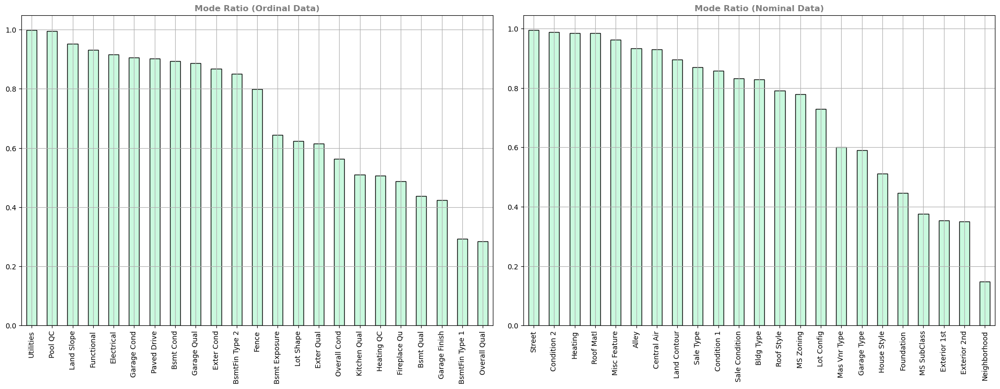

In [225]:
fig, axs = plt.subplots(ncols=2, figsize=(20, 8))

ordinal_freq.plot.bar(ax=axs[0], color="#c9f9de", edgecolor="black")

axs[0].set_title("Mode Ratio (Ordinal Data)", fontsize=12, fontweight ="bold", alpha=0.5)
axs[0].grid(True)


nominal_freq.plot.bar(axs[1], color="#c9f9de", edgecolor="black")


axs[1].set_title("Mode Ratio (Nominal Data)", fontsize=12, fontweight ="bold", alpha=0.5)
axs[1].grid(True)


plt.tight_layout(pad=2)
plt.show()

<br> There are 6 categorical variables with ratios less than 0.4. The features capture the condition of a property's finished basement area, a house's exterior covering, the dwelling type of each property in addition to the overall quality of the residence, and the neighborhood each residential property is situated in. 

<br> **Outliers**

As per the detailed data description documentation, the observations that are more than 4000 square feet are likey sale prices that may not best represent standard market value. Moreover as they are very large houses, although likely priced appriopriately, the observations may affect statistical modeling.

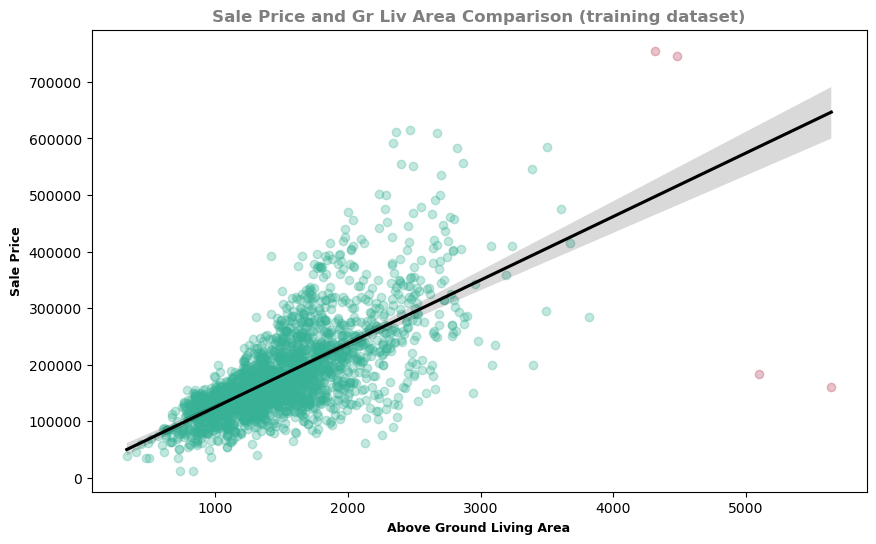

In [226]:
x = raw2["Gr Liv Area"]
y = raw2["SalePrice"]

plt.figure(figsize=(10, 6))

sns.regplot(x=x[x > 4000], y=y[x > 4000], scatter_kws={"color": "#b23854", "alpha": 0.3}, fit_reg=False)

sns.regplot(x=x[x <= 4000], y=y[x < 4000], scatter_kws={"color": "#38b296", "alpha": 0.3}, fit_reg=False)

sns.regplot(x=x, y=y, scatter=False, line_kws={"color": "black"})

plt.xlabel("Above Ground Living Area", fontweight ="bold", fontsize=9)
plt.ylabel("Sale Price", fontweight ="bold", fontsize=9)
plt.title("Sale Price and Gr Liv Area Comparison (training dataset)", fontweight ="bold", alpha=0.5)

plt.show()

In [227]:
raw2.drop(raw2[raw2["Gr Liv Area"] > 4000].index, inplace = True)

<br> Lot areas that are very large could similary affect model predictions.

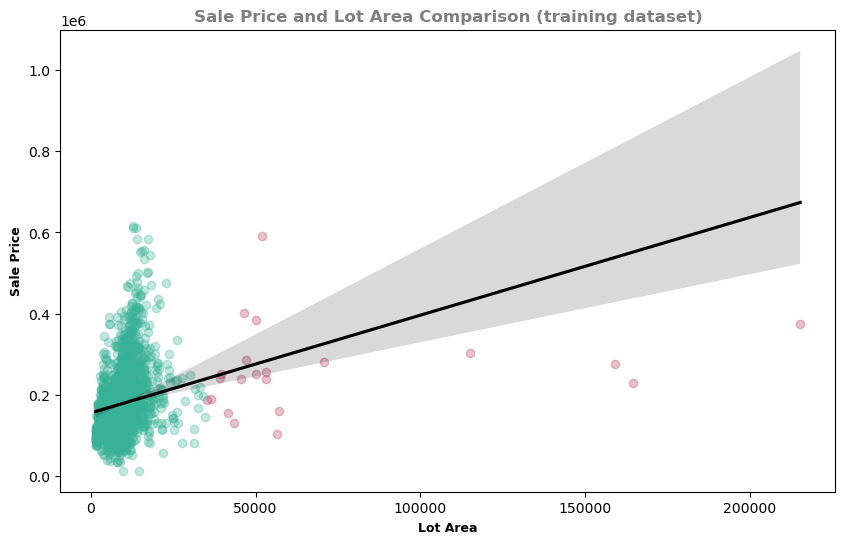

In [228]:
x = raw2["Lot Area"]
y = raw2["SalePrice"]


mean_x = np.mean(x)
std_x = np.std(x)

outliers = np.abs(x - mean_x) > 3 * std_x


plt.figure(figsize=(10, 6))

sns.regplot(x=x[outliers == True], y=y.loc[outliers[outliers == True].index], scatter_kws={"color": "#b23854", "alpha": 0.3}, fit_reg=False)

sns.regplot(x=x[outliers == False], y=y.loc[outliers[outliers == False].index], scatter_kws={"color": "#38b296", "alpha": 0.3}, fit_reg=False)

sns.regplot(x=x, y=y, scatter=False, line_kws={"color": "black"})

plt.xlabel("Lot Area", fontweight ="bold", fontsize=9)
plt.ylabel("Sale Price", fontweight ="bold", fontsize=9)
plt.title("Sale Price and Lot Area Comparison (training dataset)", fontweight ="bold", alpha=0.5)

plt.show()

There are 21 properties with lot areas that are 3 standard deviations away the mean. Omitting lot areas that are greater than 100, 000 square feet could help with optimising model parameters.

In [229]:
raw2.drop(raw2[raw2["Lot Area"] > 100000].index, inplace = True)

raw2_te.drop(raw2_te[raw2_te["Lot Area"] > 100000].index, inplace = True)

print(f"The training data set now has {raw2.shape[0]} rows, and the test data set has {raw2_te.shape[0]}.")

The training data set now has 2422 rows, and the test data set has 500.


<br>

## **Exploratory Data Analysis**

<br> 

### **Sale Price**

<br>The for loop computes histogram intervals to visualise sales price across 15 bins. Information from the bin count shows that majority of houses on sale are priced between \\$93, 083.80 and \\$293, 820.80.

In [230]:
counts, bin_edges = np.histogram(raw2["SalePrice"], bins=15)

for count, edge in zip(counts, bin_edges):
    print(f"Bin: {edge:.2f}, Count: {count}")

Bin: 12789.00, Count: 13
Bin: 52936.40, Count: 144
Bin: 93083.80, Count: 539
Bin: 133231.20, Count: 693
Bin: 173378.60, Count: 436
Bin: 213526.00, Count: 253
Bin: 253673.40, Count: 150
Bin: 293820.80, Count: 78
Bin: 333968.20, Count: 43
Bin: 374115.60, Count: 33
Bin: 414263.00, Count: 16
Bin: 454410.40, Count: 10
Bin: 494557.80, Count: 3
Bin: 534705.20, Count: 5
Bin: 574852.60, Count: 6


<br> The five variables calculate key descriptive statistics on sale price including mean, median, standard deviation in addition to the minimum and maximm values.

In [231]:
salePrice_mean = round(raw2["SalePrice"].mean(), 2)
salePrice_median = round(raw2["SalePrice"].median(), 0)
salePrice_min = round(raw2["SalePrice"].min(), 0)
salePrice_max = round(raw2["SalePrice"].max(), 0)
salePrice_std = round(np.std(raw2["SalePrice"]), 2)

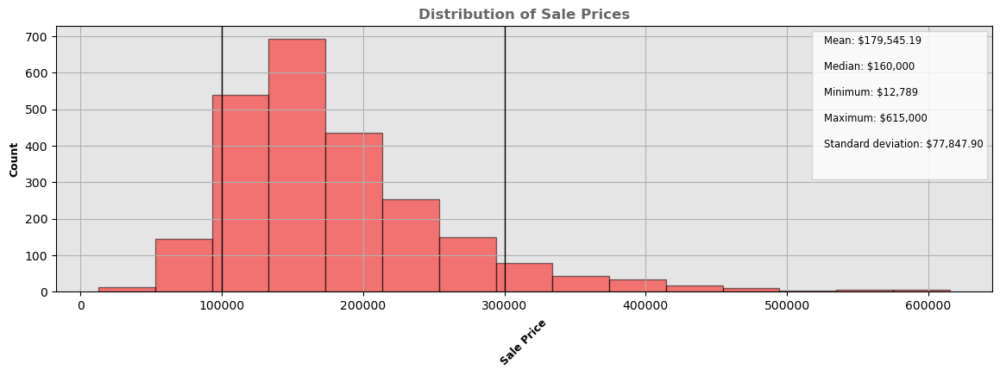

In [232]:
legend_label = (
    f"Mean: ${salePrice_mean:,.2f}\n\n"
f"Median: ${salePrice_median:,.0f}\n\n"
f"Minimum: ${salePrice_min:,.0f}\n\n"
f"Maximum: ${salePrice_max:,.0f}\n\n"
f"Standard deviation: ${salePrice_std:,.2f}\n\n"
)

fig, ax = plt.subplots(figsize=(14, 4))

ax.hist(raw2["SalePrice"], bins=15, color="#ff0000", edgecolor="black", alpha=0.5)

ax.axvline(x=100000, color="black", linestyle="-", linewidth=1)
ax.axvline(x=300000, color="black", linestyle="-", linewidth=1)

ax.set_facecolor("#e5e5e5") 
ax.set_xlabel("Sale Price", rotation=45,  fontweight ="bold", fontsize=9)
ax.set_ylabel("Count",  fontweight ="bold", fontsize=9) 
ax.set_title("Distribution of Sale Prices", fontsize=12, fontweight ="bold", alpha=0.6)

ax.legend([legend_label], loc="upper right", handlelength=0, handleheight=0, fontsize="small")
ax.grid(True)

plt.show()

In [233]:
salePrice_outliers = raw2[["Neighborhood", "SalePrice", "Gr Liv Area", "Lot Area", "Yr Sold", "Mo Sold", "Year Built"]][(
    raw2['SalePrice'] > 300000) | (raw2['SalePrice'] < 100000)]
salePrice_outliers_abv = raw2[["Neighborhood", "SalePrice", "Gr Liv Area", "Lot Area", "Yr Sold", "Mo Sold", "Year Built"]][raw2['SalePrice'] > 300000]
salePrice_outliers_blw = raw2[["Neighborhood", "SalePrice", "Gr Liv Area", "Lot Area", "Yr Sold", "Mo Sold", "Year Built"]][raw2['SalePrice'] < 100000]

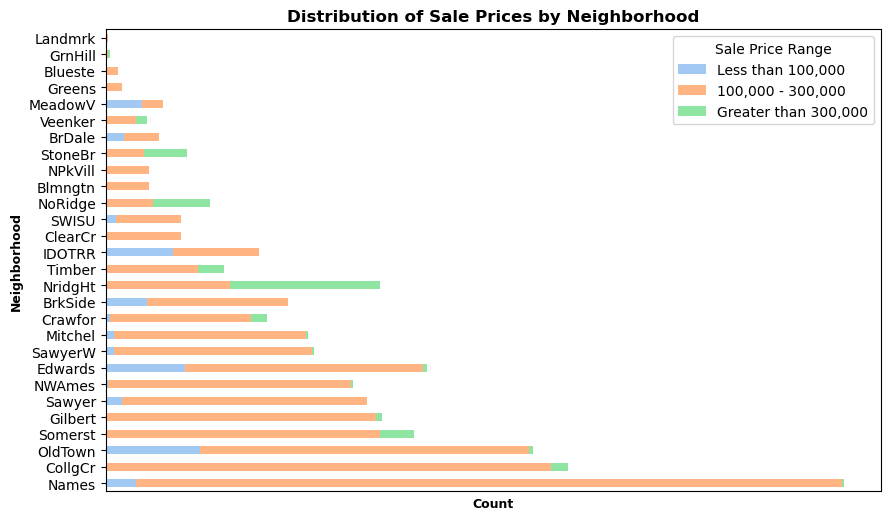

Of the 28 distinct neighborhoods, 16 have residential properties that sold for at least $300,000, 13 have properties that sold for less than $100,000, and all 28 neighborhoods have residential properties that were sold between $100,000 and $300,000.


Moreover, 204 houses cost less than $100,000, 2033 houses cost between $100,000 to $300,000 and 185 houses cost more than $300,000.




In [234]:
palette2 =  sns.color_palette("pastel")

bins = [0, 100000, 300000, float("inf")]

labels2 = ["Less than 100,000", "100,000 - 300,000", "Greater than 300,000"]


raw2["SalePrice Range"] = pd.cut(raw2["SalePrice"], bins=bins, labels=labels2, right=False)

data = raw2.groupby(["Neighborhood", "SalePrice Range"], observed=False).size().unstack(fill_value=0)

data = data.sort_values(by=["100,000 - 300,000", "Greater than 300,000"], ascending=False)


data.plot(kind='barh', stacked=True, figsize=(10, 6), color=palette2)

plt.xlabel("Count", fontsize=9, fontweight ="bold")
plt.xticks([])
plt.ylabel("Neighborhood", fontsize=9, fontweight ="bold")
plt.title("Distribution of Sale Prices by Neighborhood", fontweight="bold")
plt.legend(title="Sale Price Range")
plt.show()

print(f"Of the {raw2['Neighborhood'].nunique()} distinct neighborhoods, {raw2.loc[raw2['SalePrice'] >= 300000, 'Neighborhood'].nunique()}\
 have residential properties that sold for at least $300,000, {raw2.loc[raw2['SalePrice'] < 100000, 'Neighborhood'].nunique()}\
 have properties that sold for less than $100,000, and all \
{raw2.loc[(raw2['SalePrice'] > 100000) & (raw2['SalePrice'] < 300000), 'Neighborhood'].nunique()}\
 neighborhoods have residential properties that were sold between $100,000 and $300,000.\n\n")

print(f"Moreover, {raw2['SalePrice Range'][raw2['SalePrice Range'] == 'Less than 100,000'].count()} houses cost less than $100,000,\
 {raw2['SalePrice Range'][raw2['SalePrice Range'] == '100,000 - 300,000'].count()} houses cost between $100,000 to $300,000\
 and {raw2['SalePrice Range'][raw2['SalePrice Range'] == 'Greater than 300,000'].count()} houses cost more than $300,000.\n\n")

<br>**Neighborhood**

The variables min_res and max_res compute the id of the oldest and newest residential properties, and the variables most_res, most_res2 and most_res3 store the count of observations per neighbourhood in descendig order for all the distinct categorical values. Moreover, most_res2 stores the houses that cost less than 100,000 thounand dollars and most_res3 stores the houses that cost more than 300,000 thousand dollars. 

In [235]:
min_res = raw2.loc[raw2["Year Built"].idxmin()]

max_res = raw2.loc[raw2["Year Built"].idxmax()]

most_res = raw2.groupby("Neighborhood").size().sort_values(ascending=False)

most_res2 = salePrice_outliers_abv["Neighborhood"].value_counts()

most_res3 = salePrice_outliers_blw["Neighborhood"].value_counts()

In [236]:
print(f"The oldest residential property was built in {raw2['Year Built'].min()}, which is located in {min_res['Neighborhood']},\
 and the newest property is located in {max_res['Neighborhood']} which was built in {raw2['Year Built'].max()}.\
 The neighborhood North Ames has the most residential properties with a total of {most_res.iloc[0]} houses whereas College Creek has the second most\
 properties with a sum of {most_res.iloc[1]} houses. There's a difference of {most_res.iloc[0] - most_res.iloc[1]} residences between the two\
 neighboroods. \n\n")

The oldest residential property was built in 1875, which is located in Sawyer, and the newest property is located in StoneBr which was built in 2010. The neighborhood North Ames has the most residential properties with a total of 361 houses whereas College Creek has the second most properties with a sum of 226 houses. There's a difference of 135 residences between the two neighboroods. 




The subplots visualise the count of observations per neighborhood and highlight distinct neighborhoods if there is at least one property that costs less than \\$100,000 or more than \\$300,000. 

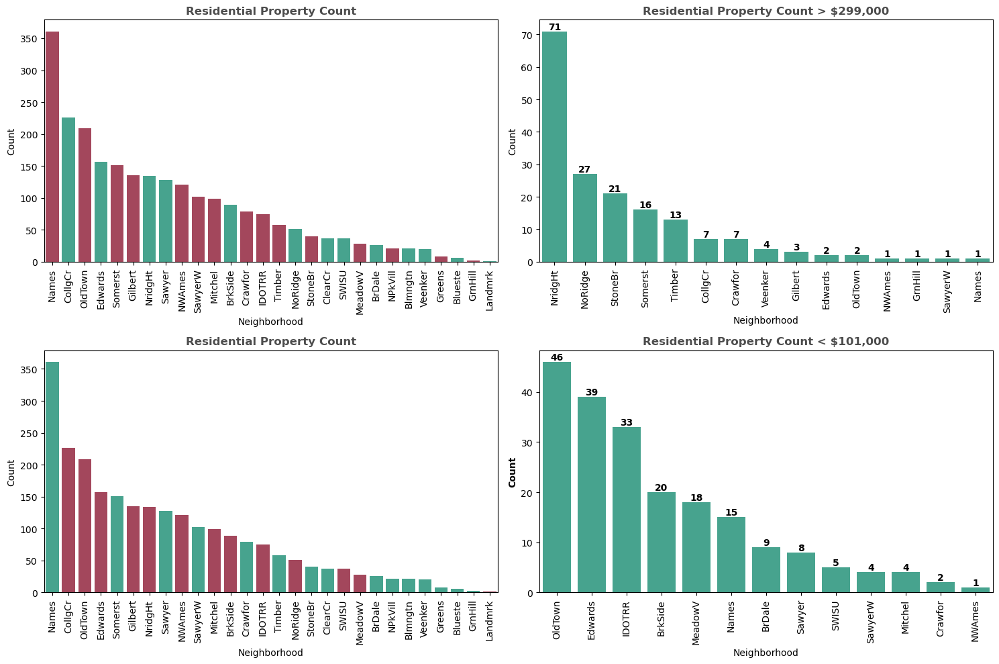

In [237]:
outliers1 = list(salePrice_outliers_abv["Neighborhood"].unique())
outliers2 = list(salePrice_outliers_blw["Neighborhood"].unique())
outliers3 = list(salePrice_outliers["Neighborhood"].unique())

def custom_palette(column, values):
        return ["#b23854" if value in values else "#38b296" for value in column]

fig, axs = plt.subplots(2, 2, figsize=(15, 10))

sns.countplot(x="Neighborhood", 
              data=raw2, 
              order=raw2["Neighborhood"].value_counts().index, ax=axs[0,0],
              hue="Neighborhood",
              legend=False,
              palette=custom_palette(raw2["Neighborhood"].value_counts().index, outliers1))

axs[0,0].set_title("Residential Property Count", fontweight="bold", alpha=0.7)
axs[0,0].set_ylabel("Count")
axs[0,0].set_xticks(range(len(raw2["Neighborhood"].value_counts().index)))
axs[0,0].set_xticklabels(raw2["Neighborhood"].value_counts().index, rotation=90)

sns.countplot(x="Neighborhood", 
              data=salePrice_outliers_abv, 
              order=salePrice_outliers_abv["Neighborhood"].value_counts().index, 
              color="#38b296", 
              ax=axs[0,1])

axs[0,1].set_title("Residential Property Count > $299,000", fontweight="bold", alpha=0.7)
axs[0,1].set_ylabel("Count")
axs[0,1].set_xticks(range(len(salePrice_outliers_abv["Neighborhood"].value_counts().index)))
axs[0,1].set_xticklabels(salePrice_outliers_abv["Neighborhood"].value_counts().index, rotation=90)

labels3 = list(most_res2)

for i, value in enumerate(labels3):
    axs[0, 1].text(i, value, str(value), ha="center", va="bottom", color="black", fontweight="bold")

sns.countplot(x="Neighborhood", 
              data=raw2, order=raw2["Neighborhood"].value_counts().index, ax=axs[1,0],
              hue="Neighborhood",
              legend=False,
              palette=custom_palette(raw2["Neighborhood"].value_counts().index, outliers2))

axs[1,0].set_title("Residential Property Count", fontweight="bold", alpha=0.7)
axs[1,0].set_ylabel("Count")
axs[1,0].set_xticks(range(len(raw2["Neighborhood"].value_counts().index)))
axs[1,0].set_xticklabels(raw2["Neighborhood"].value_counts().index, rotation=90)

sns.countplot(x="Neighborhood", data=salePrice_outliers_blw, order=salePrice_outliers_blw["Neighborhood"].value_counts().index, 
              color="#38b296", ax=axs[1,1])

axs[1,1].set_title("Residential Property Count < $101,000", fontweight="bold", alpha=0.7)
axs[1,1].set_ylabel("Count", fontweight="bold")
axs[1,1].set_xticks(range(len(salePrice_outliers_blw["Neighborhood"].value_counts().index)))
axs[1,1].set_xticklabels(salePrice_outliers_blw["Neighborhood"].value_counts().index, rotation=90)

labels4 = list(most_res3)

for i, value in enumerate(labels4):
    axs[1, 1].text(i, value, str(value), ha="center", va="bottom", color="black", fontweight="bold")


plt.tight_layout()
plt.show()

<br> The five neighborhoods that have the largest percentage of outlier residential properties is computed and stored in the variable neigh in a tabular format, and subsequently visualised as a stacked bar plot.

In [238]:
neigh = pd.concat([most_res, most_res3, most_res2], axis=1)

neigh.columns = ["Total Houses", "House Count Above 300K", "House Count Below 100K" ]

neigh = neigh.iloc[:, 0:4].fillna(0)

neigh = neigh.iloc[:, 0:4].astype("int64")

neigh.reset_index(inplace=True)

neigh["Outlier Sum"] = neigh["House Count Above 300K"] + neigh["House Count Below 100K"]

neigh["Count % per Neighborhood"] = round(neigh["Outlier Sum"] / neigh["Total Houses"] * 100, 2)

neigh.insert(3, "House Count Between 100K and 300K", neigh["Total Houses"] - neigh["Outlier Sum"])

neigh.sort_values(by="Count % per Neighborhood", ascending=False, inplace=True)

neigh = pd.concat([neigh.iloc[:4], neigh.iloc[5:6]])

neigh

,Neighborhood,Total Houses,House Count Above 300K,House Count Between 100K and 300K,House Count Below 100K,Outlier Sum,Count % per Neighborhood
19,MeadowV,28,18,10,0,18,64.29
6,NridgHt,134,0,63,71,71,52.99
15,NoRidge,51,0,24,27,27,52.94
16,StoneBr,40,0,19,21,21,52.50
13,IDOTRR,75,33,42,0,33,44.00


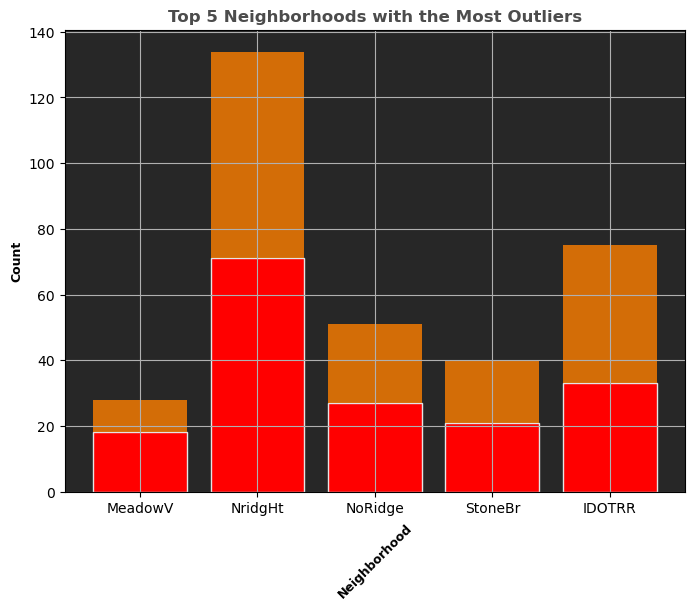

In [239]:
fig, ax = plt.subplots(figsize=(8, 6))

ax.bar(
    neigh["Neighborhood"], 
    neigh["Outlier Sum"], 
    color="#ff0000", 
    edgecolor="#e5e5e5"
)

ax.bar(
    neigh["Neighborhood"], 
    neigh["House Count Between 100K and 300K"], 
    bottom=neigh["Outlier Sum"], 
    color="#ff8000", alpha=0.8
)

ax.set_facecolor("#272727") 
ax.set_xlabel("Neighborhood",  rotation=45, fontweight="bold", fontsize=9)
ax.set_ylabel("Count", fontweight="bold", fontsize=9)
ax.set_title("Top 5 Neighborhoods with the Most Outliers", fontsize=12, fontweight="bold", alpha=0.7)

plt.grid(True)
plt.show()

<br>The top three neighborhoods with the most residential properties that sold for more than 300,000 thousand dollars include Northridge Heights, Northridge, and Stone Brook. Northridge Heights has 73 houses relative to the neighborhoods 134 residential properties which equates to 54.48 percent of the neighborhood's observations. Northridge has 28 houses relative to the neighborhoods 51 residential properties which equates to 54.90 percent of the neighborhood's observations. While Stone Brook has 21 houses relative to the neighborhoods 40 properties which equates to 52.50 percent of the neighborhood's observations. Almost half of residential properties in Iowa Dot and Rail Road, and more than half in Meadow Village sold for less than 100,000 dollars. Meadow Village has 18 houses relative to the neighborhood's 28 residential properties which eqautes to 64.29 percent of the neighborhood's observations. Lastly, Iowa Dot and Rail Road has 34 houses relative to the neighborhod's 75 residential properties which equates to 45.33 percent of the neighborhood's observations. 

<br>**Year Built**

The subplots visualise a histogram on the count of residential properties built per decade, as well as scatter plots of the oldest and newest house in each neighborhood and a comparison between the attributes year built and sale price.

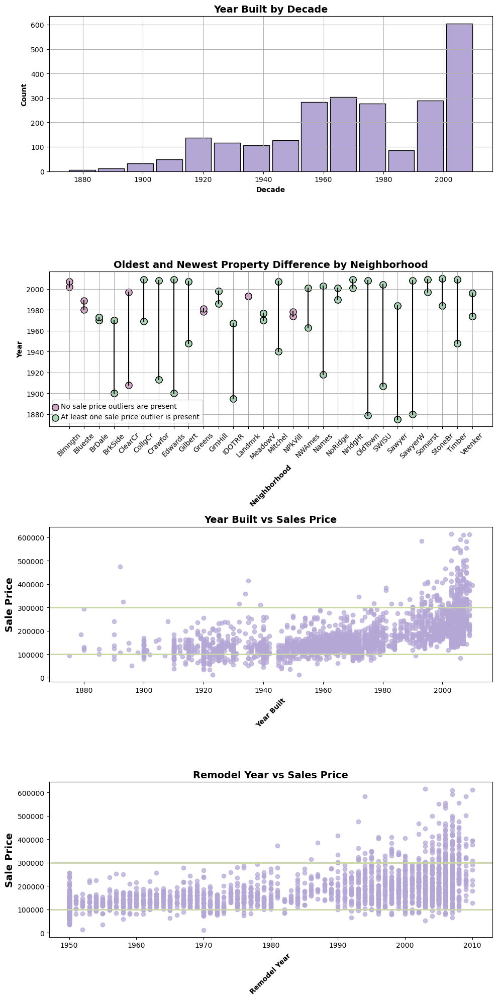

In [240]:
year_built = raw2.groupby("Neighborhood").agg({
    "Year Built": ["min", "max"]
})

year_built.reset_index(inplace=True)

legend_label2 = "No sale price outliers are present"
legend_label3 = "At least one sale price outlier is present"

fig, axs = plt.subplots(4, 1, figsize=(10, 20))

axs[0].hist(
    raw2["Year Built"], 
    bins=14, rwidth=0.9, 
    color="#b4a7d6", 
    edgecolor="black"
)

axs[0].grid(True)
axs[0].set_xlabel("Decade", fontweight="bold", fontsize=10)
axs[0].set_ylabel("Count", fontweight="bold", fontsize=10)
axs[0].set_title("Year Built by Decade", fontweight="bold", fontsize=14)

axs[1].scatter(
    year_built["Neighborhood"], 
    year_built[("Year Built", "min")], 
    color="#d6a7c9", 
    s=90, 
    edgecolor="black",
)

for neighborhood in outliers3:
    axs[1].scatter(
    neighborhood,
    year_built.loc[year_built["Neighborhood"] == neighborhood, ("Year Built", "min")],
    color="#a7d6b4",
    edgecolor="black",
    s=90,
)

axs[1].scatter(
    year_built["Neighborhood"], 
    year_built[("Year Built", "max")], 
    color="#d6a7c9", 
    s=90, 
    edgecolor="black",
)

for neighborhood in outliers3:
    axs[1].scatter(
    neighborhood,
    year_built.loc[year_built["Neighborhood"] == neighborhood, ("Year Built", "max")],
    color="#a7d6b4",
    edgecolor="black",
    s=90,
)
    
for neighborhood, min_year, max_year in zip(year_built["Neighborhood"], year_built[("Year Built", "min")], year_built[("Year Built", "max")]):
    axs[1].plot([neighborhood, neighborhood], [min_year, max_year], color="black", linestyle="-")
    

axs[1].set_title("Oldest and Newest Property Difference by Neighborhood", fontweight="bold", fontsize=14)
axs[1].set_xlabel("Neighborhood", fontweight="bold", fontsize=10,  rotation=45)
axs[1].set_ylabel("Year", fontweight="bold", fontsize=10)
axs[1].set_xticks(year_built["Neighborhood"])
axs[1].tick_params(axis='x', rotation=45)
axs[1].grid(True)
axs[1].legend([legend_label2, legend_label3], loc="lower left", handlelength=0, handleheight=0)

axs[2].scatter(raw2["Year Built"], raw2["SalePrice"], color="#b4a7d6", alpha=0.7)
axs[2].axhline(y=100000, color="#c9d6a7", linestyle="-", linewidth=2)
axs[2].axhline(y=300000, color="#c9d6a7", linestyle="-", linewidth=2)
axs[2].set_title("Year Built vs Sales Price", fontweight="bold", fontsize=14)
axs[2].set_xlabel("Year Built", fontweight="bold", fontsize=10,  rotation=45)
axs[2].set_ylabel("Sale Price", fontweight="bold", fontsize=14)

axs[3].scatter(raw2["Year Remod/Add"], raw2["SalePrice"], color="#b4a7d6", alpha=0.7)
axs[3].axhline(y=100000, color="#c9d6a7", linestyle="-", linewidth=2)
axs[3].axhline(y=300000, color="#c9d6a7", linestyle="-", linewidth=2)
axs[3].set_title("Remodel Year vs Sales Price", fontweight="bold", fontsize=14)
axs[3].set_xlabel("Remodel Year", fontweight="bold", fontsize=10,  rotation=45)
axs[3].set_ylabel("Sale Price", fontweight="bold", fontsize=14)


plt.tight_layout()
plt.show()

There was a steady increase in the amount of houses built over the deacdes. A slight dip occured during the 1930s and 1940s, and a significant jump took place between the 1950s and 1960s, which similarly occured between the 1980s, 1990s and 2000s. Less than 100 houses were built in the 1980s which last occured in the 1910s. 

There's a varied mix of established and relatively new neighborhoods. The three neighborhoods Northridge Heights, Northridge, and Stone Brook have a sizable number of houses that cost more than 300,000 dollars; the very first houses were constructed in the 1980s and 1990s. 

Moreover, year built is unlikely a sole predictor as to the cost of a residential property. Most of the houses fall within the 100,000 dollar and 300,000 dolalr price range. Of the houses that cost more than 300,000 dollars, majority were built after 1980 and remodelled between 1990 and 2010. 

<br>**Year Sold**

Pandas pivot table function is applied to aggregate the columns Mo Sold and Yr Sold. Thereafter seaborn's heatmap is used to visualise the count of houses sold over the five year period.

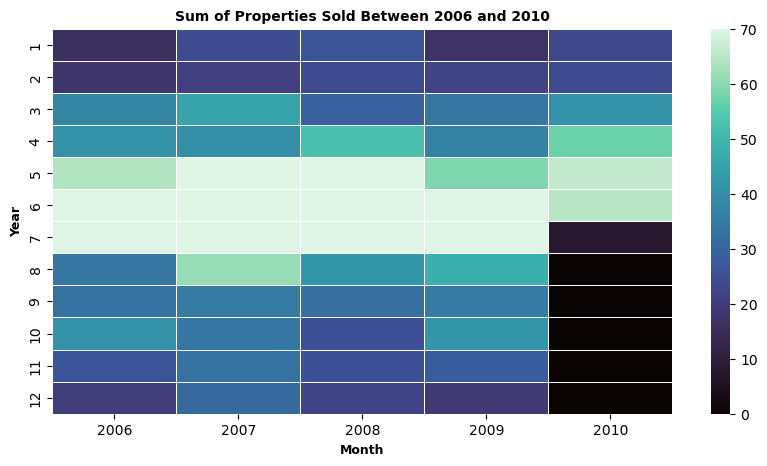

In [241]:
piv1 = raw2.groupby(["Mo Sold", "Yr Sold"]).size().reset_index(name= "Count")

piv1 = piv1.sort_values(by=["Count"])

piv1 = piv1.pivot_table(index="Mo Sold", columns="Yr Sold", values="Count")

piv1.fillna(0, inplace=True)

plt.figure(figsize=(10, 5))
sns.heatmap(piv1, cmap= "mako", linewidth=0.5, vmin=0, vmax=70)
plt.xlabel("Month", fontweight="bold", fontsize=9)
plt.ylabel("Year", fontweight="bold", fontsize=9)
plt.title("Sum of Properties Sold Between 2006 and 2010", fontweight="bold", fontsize=10)
plt.show()

All the residential properties were sold over a 5 year period of which 60-70 of the observations were sold in May, June and July between 2006 and 2009. During 2010, the most houses were sold in May and June, thereafter there's a noticable lull.

<br>**Residential Property Sizes**

Key descriptive statistics are calculated on lot area in acres, as well as residential property sizes including mean, median, and standard deviation in addition to the minimum and maximm values.

In [242]:
lot_mean = round(raw2["Lot Area"].mean()/43650, 2)
lot_median = round(raw2["Lot Area"].median()/43650, 2)
lot_min = round(raw2["Lot Area"].min()/43650, 2)
lot_max = round(raw2["Lot Area"].max()/43650, 2)
lot_std = round(np.std(raw2["Lot Area"]/43650), 2)

In [243]:
house_size_mean = round(raw2["Gr Liv Area"].mean(), 2)
house_size_median = round(raw2["Gr Liv Area"].median(), 2)
house_size_min = round(raw2["Gr Liv Area"].min(), 2)
house_size_max = round(raw2["Gr Liv Area"].max(), 2)
house_size_std = round(np.std(raw2["Gr Liv Area"]), 2)

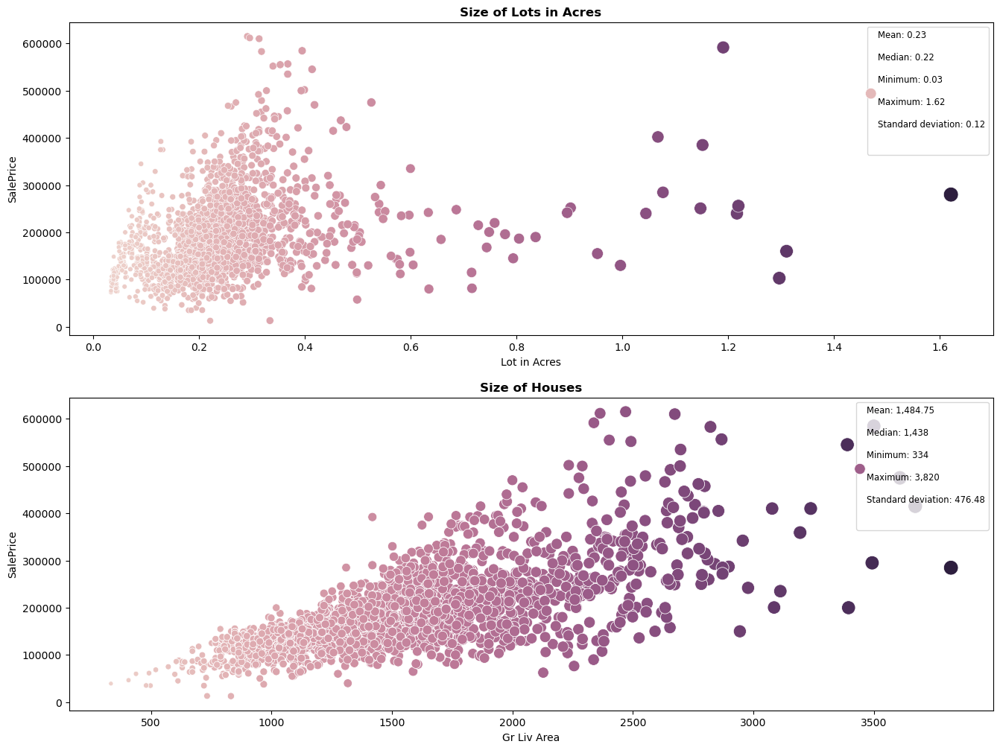

In [244]:
legend_labels4 = (
    f"Mean: {lot_mean:,.2f}\n\n"
f"Median: {lot_median:,.2f}\n\n"
f"Minimum: {lot_min:,.2f}\n\n"
f"Maximum: {lot_max:,.2f}\n\n"
f"Standard deviation: {lot_std:,.2f}\n\n"
)

legend_labels5 = (
    f"Mean: {house_size_mean:,.2f}\n\n"
f"Median: {house_size_median:,.0f}\n\n"
f"Minimum: {house_size_min:,.0f}\n\n"
f"Maximum: {house_size_max:,.0f}\n\n"
f"Standard deviation: {house_size_std:,.2f}\n\n"
)

fig, axs = plt.subplots(2, 1, figsize=(16, 12))

acres = raw2[["SalePrice", "Lot Area"]]

acres.insert(2, "Lot in Acres", raw2["Lot Area"]/43650)

house_size = raw2[["SalePrice", "Gr Liv Area"]]

sns.scatterplot(ax=axs[0], data=acres, x="Lot in Acres", y="SalePrice", hue="Lot in Acres", size="Lot in Acres", sizes=(20, 200))
axs[0].set_title("Size of Lots in Acres", fontweight="bold")
axs[0].legend([legend_labels4], loc="upper right", handlelength=0, handleheight=0, fontsize="small")

sns.scatterplot(ax=axs[1], data=house_size, x="Gr Liv Area", y="SalePrice", hue="Gr Liv Area", size="Gr Liv Area", sizes=(20, 200))
axs[1].set_title("Size of Houses", fontweight="bold")
axs[1].legend([legend_labels5], loc="upper right", handlelength=0, handleheight=0, fontsize="small")

plt.show()

<br> There isn't a noticable correlation between lot area and sale price, whereas a positive correlation is visible between above ground living area and sale price.

<br> 

## **Correlation Analysis**

There are 15 features that have a strong correlation (greater than 0.5) with sale price which are:

- The overall material and finish of the house
- Above ground living area
- The overall quaity of the exterior's material
- Kitchen quality
- Total square feet of the basement 
- Sqquare feet of the first floor
- Garage car capacity
- Total square feet of the garage
- Basement quality
- Year built
- Interior finish of the garage
- Fireplace quality
- Year that the house was remodelled or built

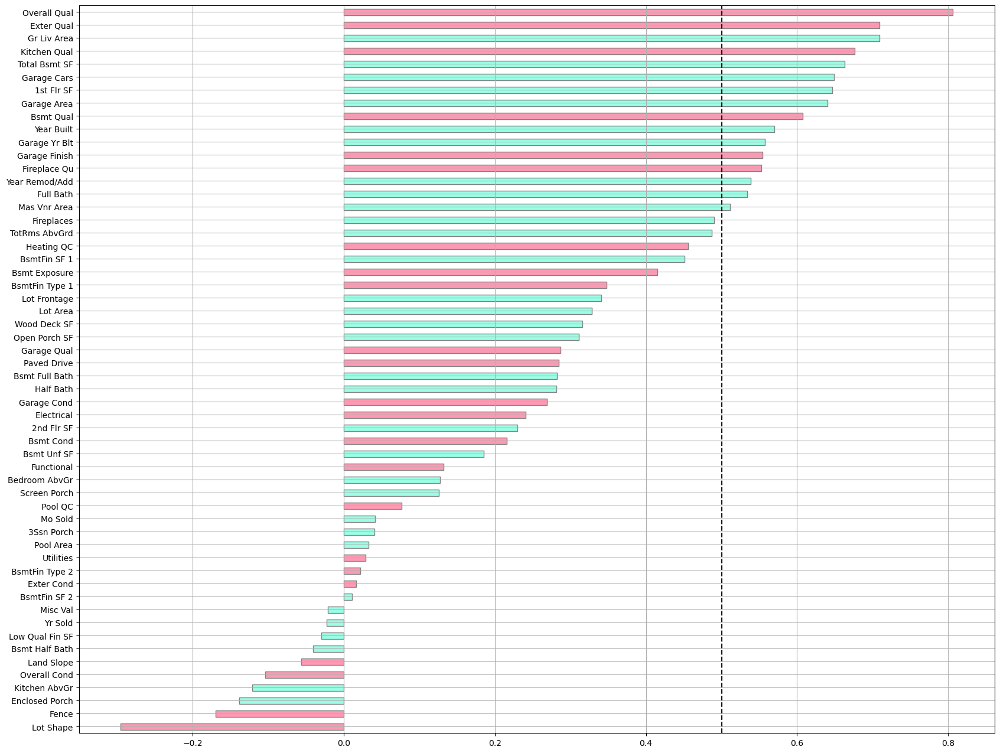

In [245]:
corr = raw2[ordinal_col + int_col + float_col].corr()

corr = corr.loc["SalePrice", :]

corr.drop(index="SalePrice", inplace=True)

corr.sort_values(inplace=True)

fig, ax = plt.subplots(figsize=(20,16))

corr.plot(ax=ax, kind="barh", edgecolor="gray", color=["#ff99b3" if col in ordinal_col else "#99ffe5" for col in corr.index])

ax.axvline(x=0.5, color="#190f11", linestyle="--")

plt.grid()

plt.show()

To visualsie the datasets categorical features, a for loop is instatiated to enumerate through each variables unique categories, and plot subplots across four columns and seven rows. The maximum mean and count value for each subplot have been assigned a unique colour.

To visualsie the datasets categorical features, a for loop is instatiated to enumerate through each variables unique categories, and plot subplots across four columns and seven rows. The categories for every distinct attribute is ordered by the mean in descening order. In addition each unique value with the highest has been assigned a unique colour.

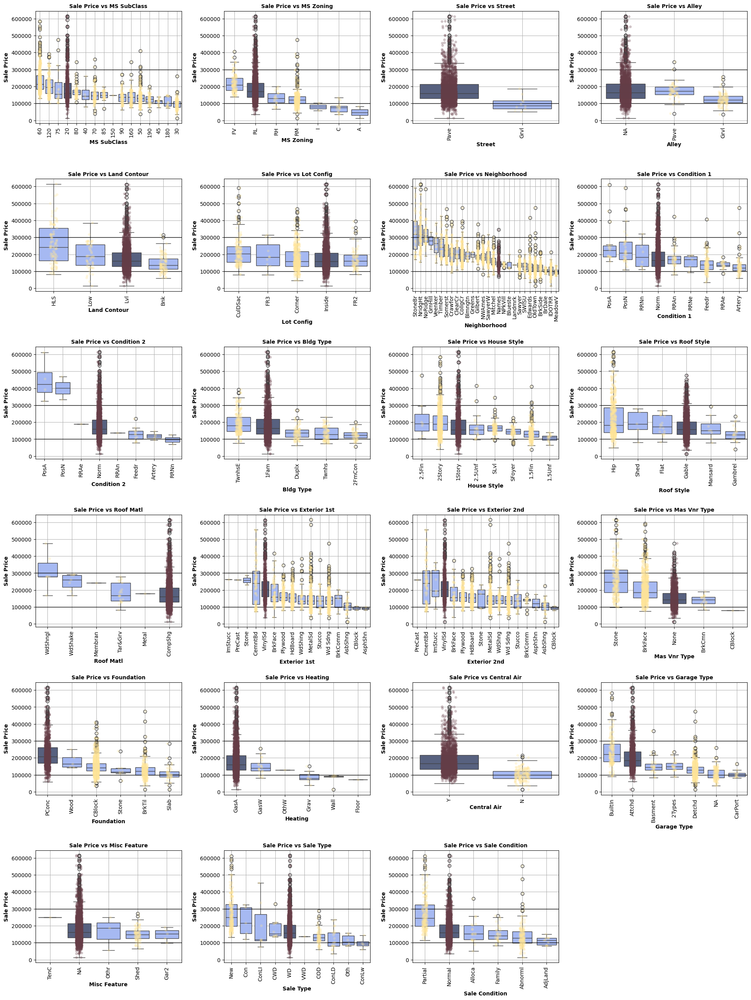

In [246]:
fig, axes = plt.subplots(nrows=7, ncols=4, figsize=(20, 30))
axes = axes.flatten()

for i, col in enumerate(nominal_col):
    
    nom_unique_categories = raw2[col].unique()
    
    nom_max_count = raw2.groupby(col).size().idxmax()

    nom_mean_order = raw2.groupby(col)["SalePrice"].mean().sort_values(ascending=False).index
    

    sns.boxplot(
        ax=axes[i],
        x=col, 
        y="SalePrice", 
        data=raw2,  
        palette= ["#505d86" if cat == nom_max_count else "#99b3ff" for cat in nom_unique_categories], 
        hue=col, 
        legend=False, 
        order=nom_mean_order
    )
    
    sns.stripplot(
        ax=axes[i],
        x=col, 
        y="SalePrice", 
        data=raw2,  
        palette= ["#663d47" if cat == nom_max_count else "#ffe599" for cat in nom_unique_categories],
        hue=col, 
        legend=False,
        alpha=0.3,                   
        order=nom_mean_order
    )
    
    axes[i].set_title(f"Sale Price vs {col}", fontsize=10, fontweight="bold")
    axes[i].set_xlabel(col, fontsize=10, fontweight="bold")
    axes[i].set_ylabel("Sale Price", fontsize=10, fontweight="bold")
    axes[i].set_xticks(range(len(nom_mean_order)))
    axes[i].set_xticklabels(nom_mean_order, rotation=90)
    
    axes[i].axhline(y=100000, color="black", linestyle="-", linewidth=1)
    axes[i].axhline(y=300000, color="black", linestyle="-", linewidth=1)
    
    axes[i].grid(True)

for j in range(len(nominal_col), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout(pad=2)
plt.show()

A large sample is more reflective of how observations are distributed. A more representative average is computed as individual values including outliers are unlikely to disproportionatly affect the mean. A limited sample with unusually high or low values could affect the mean value discrepantly. Therefore, an analysis of variance would be an appropriate statistical test to compare the effect all the multiple catergories have across the distinct categorical variables on the average sale price.

Scipy's statistical method f_oneway is applied to iteratively test the unique values across the datasets categorical features. Each feature, f-statistic, and p-value is appended to the dictionary variable anova. As the p-values are skewed towards smaller values, the threshold 10 to the power of −300 is set to counter values extremley close to 0 which eases interpretation and visualisation. Furthermore, the p-values are log transformed; the levels of significance across every feature is more readily distinguishable.

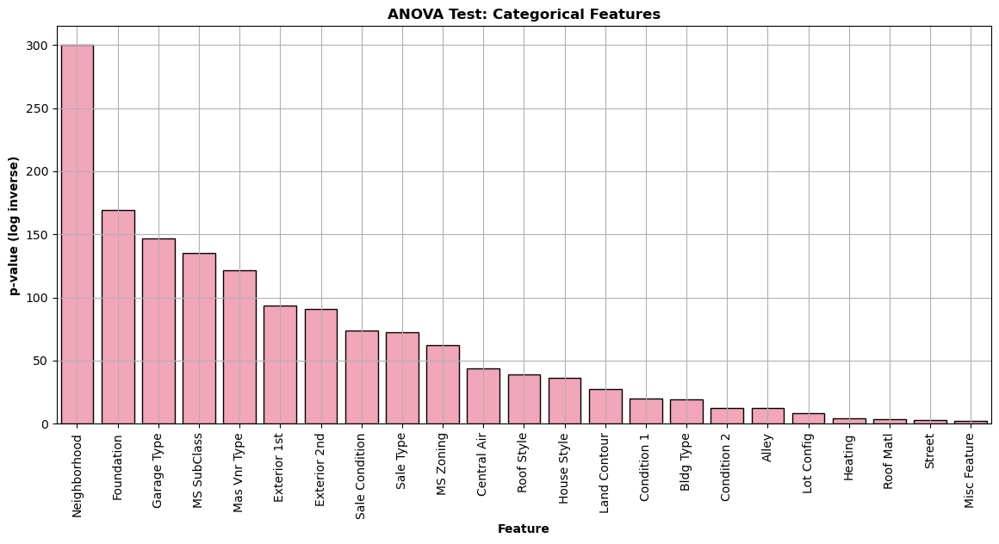

In [247]:
anova = {"Feature": [], "f-statistic": [], "p-value": []}

for col in nominal_col:
    grouped_sale_price = raw2.groupby(col)["SalePrice"]
    f_statistic, p_value = stats.f_oneway(*[grouped_sale_price.get_group(category) for category in raw2[col].unique()])
    
    anova["Feature"].append(col)
    anova["f-statistic"].append(f_statistic)
    anova["p-value"].append(p_value)

mean_var = pd.DataFrame(anova)

mean_var = mean_var[["Feature", "f-statistic", "p-value"]]
mean_var.sort_values("p-value", inplace=True)

mean_var["p-value"] = mean_var["p-value"].apply(lambda x: max(x, 1e-300))

mean_var["-log10(p-value)"] = -np.log10(mean_var["p-value"])

plt.figure(figsize=(14, 6))
sns.barplot(x="Feature", y="-log10(p-value)", data=mean_var, color="#ff99b3", edgecolor="black")
plt.xticks(rotation=90)
plt.xlabel("Feature", fontweight="bold")
plt.ylabel("p-value (log inverse)", fontweight="bold")
plt.title("ANOVA Test: Categorical Features", fontweight="bold")
plt.grid(True)
plt.show()

The effect neighborhood has on sale price is almost 300 times greater than the foundation type of a house. To visualise the correlation between sale price and all the datasets features, the variable nominal_col2 is instantiated as an instance of the function rank_order. The fucntion computes the mean of each category unique to a nominal feature, and ranks the means accordingly. The dense method is selected so as to sign integer rank values without gaps. Key, value pairs of the feature name and corresponding rank of each unique category are assigned to a dictionary, and stored to the dataframe as a new column. A list comprehension is computed to store the encoded column names so as to visualise a barplot on the strength and direction of the relationship each variable has with sale price. 

In [248]:
def rank_order(frame, col, target):
    grouped_sale_price = frame.groupby(col)[target].mean().sort_values().reset_index()
    grouped_sale_price["Rank"] = grouped_sale_price[target].rank(method="dense").astype(int)
    order_dict = grouped_sale_price.set_index(col)['Rank'].to_dict()
    frame[col + " Encoded"] = frame[col].map(order_dict)
    return frame

In [249]:
for col in nominal_col:
    nominal_col2 = rank_order(raw2, col, "SalePrice")

nominal_rank = [col for col in nominal_col2.columns if col.endswith("Encoded")]

nominal_col2[nominal_rank].sample(5)

,MS SubClass Encoded,MS Zoning Encoded,Street Encoded,Alley Encoded,Land Contour Encoded,Lot Config Encoded,Neighborhood Encoded,Condition 1 Encoded,Condition 2 Encoded,Bldg Type Encoded,...,Exterior 1st Encoded,Exterior 2nd Encoded,Mas Vnr Type Encoded,Foundation Encoded,Heating Encoded,Central Air Encoded,Garage Type Encoded,Misc Feature Encoded,Sale Type Encoded,Sale Condition Encoded
101,13,6,2,3,2,5,21,6,5,4,...,5,9,3,6,6,2,6,4,6,4
198,12,6,2,3,2,2,8,6,5,4,...,5,6,4,4,6,2,6,4,4,5
245,13,6,2,3,2,2,14,2,5,4,...,12,13,3,6,6,2,2,4,10,6
1228,7,6,2,3,1,2,14,6,5,3,...,9,10,3,1,6,2,6,4,6,4
1195,12,6,2,3,2,1,24,3,5,4,...,10,11,4,4,6,2,6,4,6,5


<br> There are 17 variables that have a correlation coefficient that is greater than 0.5. Neighborhood and Foundation are the encoded nominal variables that also have a strong relationship with sale price, and the overall quality of a residential property has the most significant effect on sale price.  

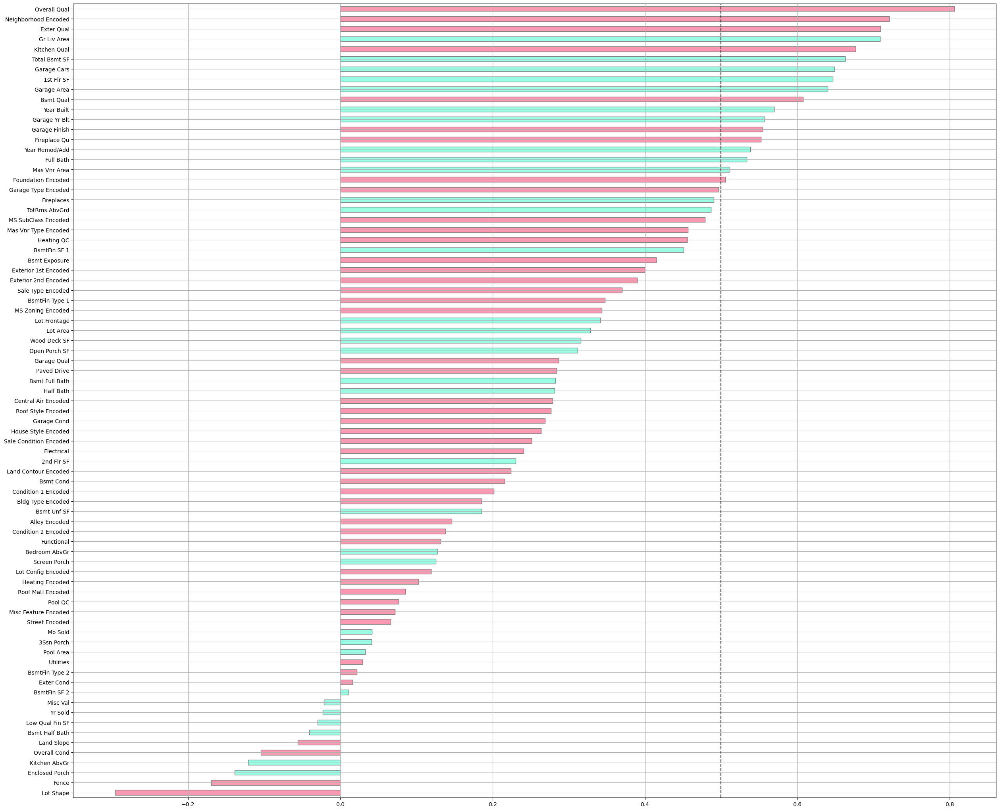

In [250]:
corr2 = raw2[ordinal_col + int_col + float_col + nominal_rank].corr()

corr2 = corr2.loc["SalePrice", :]

corr2.drop(index="SalePrice", inplace=True)

corr2.sort_values(inplace=True)

fig, ax = plt.subplots(figsize=(30,26))

corr2.plot(ax=ax, kind="barh", figsize=(30,26), color=["#ff99b3" if col in nominal_rank or col in ordinal_col else "#99ffe5" for col in corr2.index], edgecolor="gray")

ax.axvline(x=0.5, color="#190f11", linestyle="--")

plt.grid()

plt.show()

# **Feature Engineering**


<br>**Total Square Footage and Bathroom Aggregation**

In [251]:
raw3 = raw2.copy()

raw3_te = raw2_te.copy()

In [252]:
raw3 = raw3.drop(columns=nominal_rank)

In [253]:
raw3 = raw3.drop(columns="SalePrice Range")

In [254]:
raw3.shape

(2422, 82)

In [255]:
raw3["Total SF"] = raw3["Total Bsmt SF"] + raw3["Gr Liv Area"]

In [256]:
raw3_te["Total SF"] = raw3_te["Total Bsmt SF"] + raw3_te["Gr Liv Area"]

In [257]:
raw3["Total Flr SF"] = raw3["1st Flr SF"] + raw3["2nd Flr SF"]

In [258]:
raw3_te["Total Flr SF"] = raw3_te["1st Flr SF"] + raw3_te["2nd Flr SF"]

In [259]:
raw3["Total Porch SF"] = raw3["Open Porch SF"] + raw3["Enclosed Porch"] + raw3["3Ssn Porch"] + raw3["Screen Porch"]

In [260]:
raw3_te["Total Porch SF"] = raw3_te["Open Porch SF"] + raw3_te["Enclosed Porch"] + raw3_te["3Ssn Porch"] + raw3_te["Screen Porch"]

In [261]:
raw3.drop(columns=["Total Bsmt SF", "Gr Liv Area", "1st Flr SF", "2nd Flr SF", 
       "Open Porch SF", "Enclosed Porch", "3Ssn Porch", "Screen Porch"], inplace=True)

In [262]:
raw3_te.drop(columns=["Total Bsmt SF", "Gr Liv Area", "1st Flr SF", "2nd Flr SF", 
       "Open Porch SF", "Enclosed Porch", "3Ssn Porch", "Screen Porch"], inplace=True)

In [263]:
raw3["Total Bath"] = raw3["Full Bath"] + (raw3["Half Bath"] * 0.5) + raw3["Bsmt Full Bath"] + (raw3["Bsmt Half Bath"] * 0.5)

In [264]:
raw3_te["Total Bath"] = raw3_te["Full Bath"] + (raw3_te["Half Bath"] * 0.5) + raw3_te["Bsmt Full Bath"] + (raw3_te["Bsmt Half Bath"] * 0.5)

In [265]:
raw3.drop(columns=["Full Bath", "Half Bath", "Bsmt Full Bath", "Bsmt Half Bath"], inplace=True)

In [266]:
raw3_te.drop(columns=["Full Bath", "Half Bath", "Bsmt Full Bath", "Bsmt Half Bath"], inplace=True)

<br> **Indicator Variables**

In [267]:
raw3["Year Built >= 2000"] = raw3["Year Built"].apply(lambda x: 1 if x >= 2000 else 0)

In [268]:
raw3_te["Year Built >= 2000"] = raw3_te["Year Built"].apply(lambda x: 1 if x >= 2000 else 0)

In [269]:
raw3["Bsmt Present"] = raw3["Bsmt Cond"].apply(lambda x: 1 if x > 1 else 0)

In [270]:
raw3_te["Bsmt Present"] = raw3_te["Bsmt Cond"].apply(lambda x: 1 if x > 1 else 0)

In [271]:
raw3["Porch Present"] = raw3["Total Porch SF"].apply(lambda x: 1 if x > 0 else 0)

In [272]:
raw3_te["Porch Present"] = raw3_te["Total Porch SF"].apply(lambda x: 1 if x > 0 else 0)

In [273]:
raw3["Pool Present"] = raw3["Pool QC"].apply(lambda x: 1 if x > 0 else 0)

In [274]:
raw3_te["Pool Present"] = raw3_te["Pool QC"].apply(lambda x: 1 if x > 0 else 0)

In [275]:
raw3["Garage Present"] = raw3["Garage Area"].apply(lambda x: 1 if x > 0 else 0)

In [276]:
raw3_te["Garage Present"] = raw3_te["Garage Area"].apply(lambda x: 1 if x > 0 else 0)

In [277]:
raw3["Remodelled"] = (raw3["Year Remod/Add"] != raw3["Year Built"]).astype(np.int64)

In [278]:
raw3_te["Remodelled"] = (raw3_te["Year Remod/Add"] != raw3_te["Year Built"]).astype(np.int64)

In [279]:
raw3["Fence Present"] = raw3["Fence"].apply(lambda x: 1 if x > 0 else 0)

In [280]:
raw3_te["Fence Present"] = raw3_te["Fence"].apply(lambda x: 1 if x > 0 else 0)

In [281]:
raw3["Fireplace Present"] = raw3["Fireplaces"].apply(lambda x: 1 if x > 0 else 0)

In [282]:
raw3_te["Fireplace Present"] = raw3_te["Fireplaces"].apply(lambda x: 1 if x > 0 else 0)

<br> New variables are created to update the list of column names according to each features dtype as per the dataset's detailed documentation.

In [283]:
raw3[["Lot Shape", "Utilities", "Land Slope", "Exter Qual", 
 "Exter Cond","Bsmt Qual", "Bsmt Cond", "Bsmt Exposure", 
 "BsmtFin Type 1", "BsmtFin Type 2", "Heating QC", "Electrical",
 "Kitchen Qual", "Functional", "Fireplace Qu", "Garage Finish",
 "Garage Qual", "Garage Cond", "Paved Drive", "Pool QC", "Fence"]] = raw3[["Lot Shape", "Utilities", "Land Slope", "Exter Qual", 
                                                                            "Exter Cond","Bsmt Qual", "Bsmt Cond", "Bsmt Exposure", 
                                                                            "BsmtFin Type 1", "BsmtFin Type 2", "Heating QC", "Electrical",
                                                                            "Kitchen Qual", "Functional", "Fireplace Qu", "Garage Finish",
                                                                            "Garage Qual", "Garage Cond", "Paved Drive", "Pool QC", "Fence"]].astype("int64")

In [284]:
raw3_te[["Lot Shape", "Utilities", "Land Slope", "Exter Qual", 
 "Exter Cond","Bsmt Qual", "Bsmt Cond", "Bsmt Exposure", 
 "BsmtFin Type 1", "BsmtFin Type 2", "Heating QC", "Electrical",
 "Kitchen Qual", "Functional", "Fireplace Qu", "Garage Finish",
 "Garage Qual", "Garage Cond", "Paved Drive", "Pool QC", "Fence"]] = raw3_te[["Lot Shape", "Utilities", "Land Slope", "Exter Qual", 
                                                                            "Exter Cond","Bsmt Qual", "Bsmt Cond", "Bsmt Exposure", 
                                                                            "BsmtFin Type 1", "BsmtFin Type 2", "Heating QC", "Electrical",
                                                                            "Kitchen Qual", "Functional", "Fireplace Qu", "Garage Finish",
                                                                            "Garage Qual", "Garage Cond", "Paved Drive", "Pool QC", "Fence"]].astype("int64")

In [285]:
bool_col = ["Bsmt Present", "Porch Present", "Pool Present", "Garage Present", "Remodelled", 
              "Year Built >= 2000", "Completed House", "Fence Present", "Fireplace Present"]


In [286]:
int_col2 = [col for col in raw3.columns if raw3[col].dtypes == "int64" and col not in bool_col + ordinal_col]

print("Training set feature count with dtype integer:", raw3[int_col2].shape[1])

print(f"\nTest set feature count with dtype integer:", raw3_te[int_col2].shape[1])

Training set feature count with dtype integer: 11

Test set feature count with dtype integer: 11


In [287]:
ordinal_col2 = [col for col in raw3.columns if raw3[col].dtypes == "int64" and col not in int_col2 + bool_col]

print("Training set feature count with ordinal values:", raw3[ordinal_col2].shape[1])

print(f"\nTest set feature count with ordinal values:", raw3_te[ordinal_col2].shape[1])

Training set feature count with ordinal values: 23

Test set feature count with ordinal values: 23


In [288]:
float_col2 = [col for col in raw3.columns if raw3[col].dtypes == "float64"]

print("Training set feature count with dtype float", raw3[float_col2].shape[1])

float_col2_te = [col for col in raw3_te.columns if raw3_te[col].dtypes == "float64"]

print(f"\nTest set feature count with dtype float:", raw3_te[float_col2_te].shape[1])

Training set feature count with dtype float 15

Test set feature count with dtype float: 14


In [289]:
nominal_col2 = [col for col in raw3.columns if raw3[col].dtypes == "object"]

print("Training set feature count with nominal values:", raw3[nominal_col2].shape[1])

print(f"\nTest set feature count with nominal values:", raw3_te[nominal_col2].shape[1])

Training set feature count with nominal values: 25

Test set feature count with nominal values: 25


In [290]:
print(f"The cleaned training set now has {raw3.shape[0]} rows and {raw3.shape[1]} columns\
 and the test set has {raw3_te.shape[0]} rows and {raw3_te.shape[1]}.")

The cleaned training set now has 2422 rows and 82 columns and the test set has 500 rows and 81.


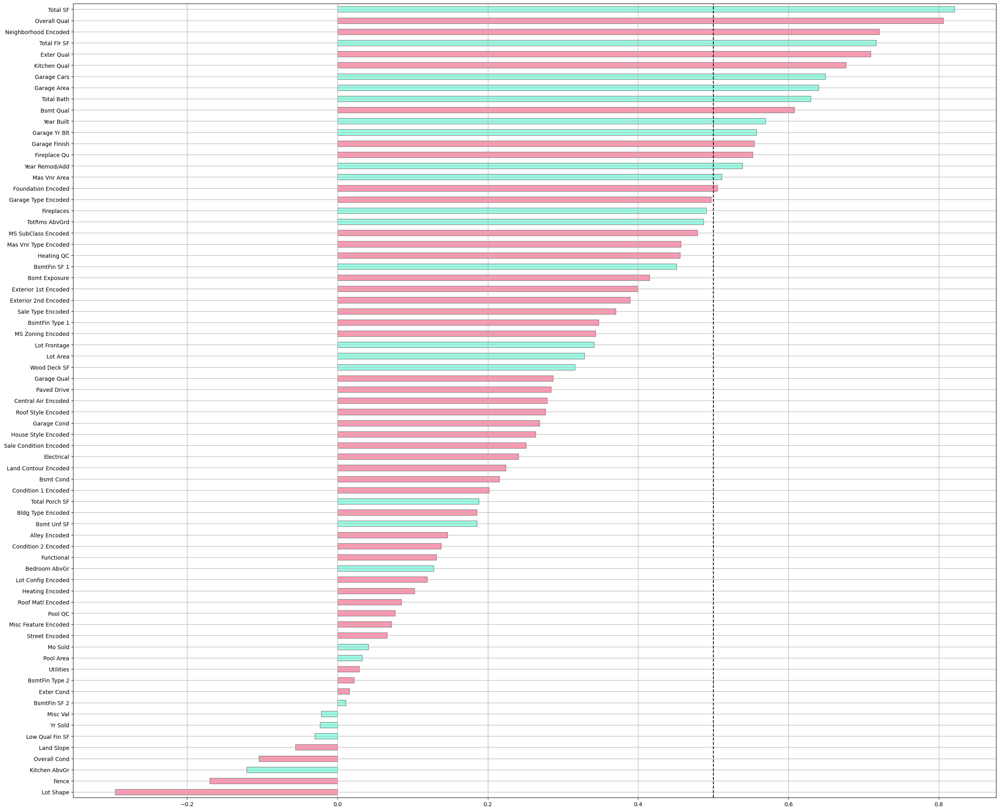

In [291]:
mask22 = pd.concat([raw3, raw2[nominal_rank]], axis=1)

corr3 = mask22[int_col2 + float_col2 + ordinal_col2 + nominal_rank].corr()

corr3 = corr3.loc["SalePrice", :]

corr3.drop(index="SalePrice", inplace=True)

corr3.sort_values(inplace=True)

fig, ax = plt.subplots(figsize=(30,26))

corr3.plot(ax=ax, kind="barh", figsize=(30,26), color=["#ff99b3" if col in nominal_rank or col in ordinal_col else "#99ffe5" for col in corr3.index], edgecolor="gray")

ax.axvline(x=0.5, color="#190f11", linestyle="--")

plt.grid()

plt.show()

<br> 


### **Log Transformations**

Float features with a skew greater than 0.5 are filtered, and of the positively skewed attributes, the z-score distributions and log transformed z-score distributions are visualised. Observations with a z-score +3 or -3 from the mean are detectable.

In [292]:
df = raw3.copy()

In [293]:
df_te = raw3_te.copy()

<br>**Training Set**

In [294]:
log = pd.DataFrame()

log["Skew"] = df[float_col2].skew()

log = log.dropna()

log.sort_values(by="Skew", inplace=True)

log_col = [idx for idx in log.index if (log.loc[idx] > 0.5).all()]

print(f"{len(log_col)} features in the training set have a skew greater than 0.5.")

13 features in the training set have a skew greater than 0.5.


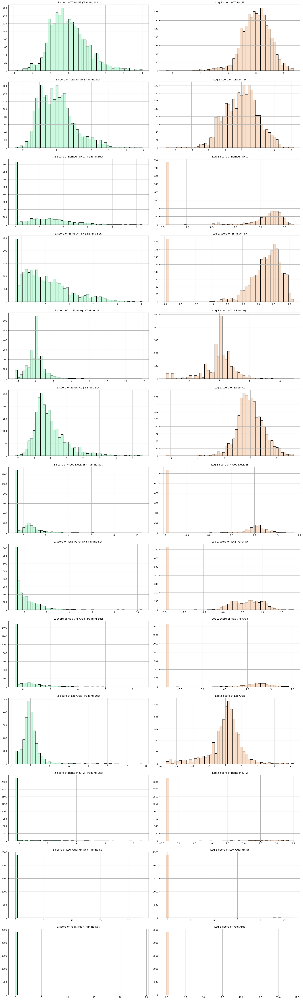

In [295]:
from scipy.stats import zscore

fig, ax = plt.subplots(nrows=len(log_col), ncols=2, figsize=(20, 5 * len(log_col)))
ax = ax.flatten()

for i, col in enumerate(log_col):
    ax[i*2].hist(zscore(df[col]), bins=50, color="#c9f9de", edgecolor="black")
    ax[i*2].set_title(f"Z-score of {col} (Training Set)")
    ax[i*2].grid(True)

    ax[i*2+1].hist(zscore(np.log1p(df[col])), bins=50, color="#f9dec9", edgecolor="black")
    ax[i*2+1].set_title(f"Log Z-score of {col}")
    ax[i*2+1].grid(True)

for j in range(2 * len(log_col), len(ax)):
    fig.delaxes(ax[j])

plt.tight_layout(pad=2)
plt.show()

<br> A handful of the log transformed z-scores are +3 or -3 away from the mean. As the outliers represent realistic data variability, all right-skewed features are log transformed to help stabalise variance, enhance model robustness and improve machine learning performance.

In [296]:
for col in log_col:
     df.loc[:, col + " LT"] = np.log1p(df[col])

In [297]:
log_transformed = [col for col in df.columns if col.endswith("LT")]

print(f"{len(log_transformed)} training set features have been log transformed.")

13 training set features have been log transformed.


<br> The identified features with a skew greater than 0.5 are log transformed across the test set.

In [298]:
log_col_te = log_col.copy()

log_col_te = [col for col in log_col if col != "SalePrice"]

for col in log_col_te:
    df_te.loc[:, col + " LT"] = np.log1p(df_te[col])

In [299]:
log_transformed_te = [col for col in df_te.columns if col.endswith("LT")]

print(f"{len(log_transformed_te)} test set features have been log transformed.")

12 test set features have been log transformed.


<br> In the training dataset log-transformed features with samples that are at least 3 standard deviations from the mean are assigned to the variable zfilter_df.

In [300]:
zfilter_df = np.abs(df[log_transformed] - df[log_transformed].mean(axis=0)) > (3 * df[log_transformed].std(axis=0))

print(f"\nTotal number of outliers detected:", zfilter_df.sum(axis=0).sum())


Total number of outliers detected: 315


<br> The variable zfilter_index stores the observations with ouliters.

In [301]:
zfilter_index = zfilter_df.sum(axis=1)

zfilter_index = zfilter_index[zfilter_index == 1].index

print(f"\nTotal number of observations with outliers:", zfilter_index.shape[0])


Total number of observations with outliers: 179


<br> The observations with outliers make up 7.4% of the dataset. Moreover, the residential properties that are situated in Landmrk and GrnHill have a total of 3 observations. To enhance model performance the observations are deleted. 

In [302]:
mask23 = mask23 = df[df["Neighborhood"].isin(["Landmrk", "GrnHill"])].index

df.drop(mask23, inplace = True)

print(f"The training set now has {df.shape[0]} rows.")

The training set now has 2419 rows.


<br> The original features that were log transformed are deleted to negate redundancy, the list of feature names are updated and one hot encoding is executed to prepare the categorical columns for data modelling.

In [303]:
df.drop(columns=log_col, inplace=True)

df_te.drop(columns=log_col_te, inplace=True)

In [304]:
int_col3 = [col for col in df.columns if df[col].dtypes == "int64" and col not in bool_col + ordinal_col or col.endswith("LT")]

int_col3_te = [col for col in df_te.columns if df_te[col].dtypes == "int64" and col not in bool_col + ordinal_col or col.endswith("LT")]

ordinal_col3 = [col for col in df.columns if df[col].dtypes == "int64" and col not in int_col2 + bool_col or col.endswith("LT")]

ordinal_col3_te = [col for col in df_te.columns if df_te[col].dtypes == "int64" and col not in int_col2 + bool_col or col.endswith("LT")]

float_col3 = [col for col in df.columns if df[col].dtypes == "float64" or col.endswith("LT")]

float_col3_te = [col for col in df_te.columns if df_te[col].dtypes == "float64" or col.endswith("LT")]

<br> As linear regression models are sensitive to multicolleniarity, drop_first=True is applied to accomodate the absence of regularisation. 

In [305]:
df = pd.get_dummies(df, columns=[col for col in df.columns if df[col].dtypes == "object" and col not in ["PID", "Order"]])

df_lr = pd.get_dummies(df, columns=[col for col in df.columns if df[col].dtypes == "object" and col not in ["PID", "Order"]], drop_first=True)

In [306]:
df_te = pd.get_dummies(df_te, columns=[col for col in df_te.columns if df_te[col].dtypes == "object" and col not in ["PID", "Order"]])

In [307]:
ohe_col_tr = [col for col in df.columns if "_" in col]

ohe_col_te = [col for col in df_te.columns if "_" in col]

In [308]:
print(f"Training set dataframe:\n")

with pd.option_context('display.max_columns', None,):
 display(df.sample(5))

Training set dataframe:



,Order,PID,Lot Shape,Utilities,Land Slope,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Exter Qual,Exter Cond,Bsmt Qual,Bsmt Cond,Bsmt Exposure,BsmtFin Type 1,BsmtFin Type 2,Heating QC,Electrical,Bedroom AbvGr,Kitchen AbvGr,Kitchen Qual,TotRms AbvGrd,Functional,Fireplaces,Fireplace Qu,Garage Yr Blt,Garage Finish,Garage Cars,Garage Area,Garage Qual,Garage Cond,Paved Drive,Pool QC,Fence,Misc Val,Mo Sold,Yr Sold,Total Bath,Year Built >= 2000,Bsmt Present,Porch Present,Pool Present,Garage Present,Remodelled,Fence Present,Fireplace Present,Total SF LT,Total Flr SF LT,BsmtFin SF 1 LT,Bsmt Unf SF LT,Lot Frontage LT,SalePrice LT,Wood Deck SF LT,Total Porch SF LT,Mas Vnr Area LT,Lot Area LT,BsmtFin SF 2 LT,Low Qual Fin SF LT,Pool Area LT,MS SubClass_120,MS SubClass_150,MS SubClass_160,MS SubClass_180,MS SubClass_190,MS SubClass_20,MS SubClass_30,MS SubClass_40,MS SubClass_45,MS SubClass_50,MS SubClass_60,MS SubClass_70,MS SubClass_75,MS SubClass_80,MS SubClass_85,MS SubClass_90,MS Zoning_A,MS Zoning_C,MS Zoning_FV,MS Zoning_I,MS Zoning_RH,MS Zoning_RL,MS Zoning_RM,Street_Grvl,Street_Pave,Alley_Grvl,Alley_NA,Alley_Pave,Land Contour_Bnk,Land Contour_HLS,Land Contour_Low,Land Contour_Lvl,Lot Config_Corner,Lot Config_CulDSac,Lot Config_FR2,Lot Config_FR3,Lot Config_Inside,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_Greens,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_Names,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition 1_Artery,Condition 1_Feedr,Condition 1_Norm,Condition 1_PosA,Condition 1_PosN,Condition 1_RRAe,Condition 1_RRAn,Condition 1_RRNe,Condition 1_RRNn,Condition 2_Artery,Condition 2_Feedr,Condition 2_Norm,Condition 2_PosA,Condition 2_PosN,Condition 2_RRAe,Condition 2_RRAn,Condition 2_RRNn,Bldg Type_1Fam,Bldg Type_2FmCon,Bldg Type_Duplx,Bldg Type_Twnhs,Bldg Type_TwnhsE,House Style_1.5Fin,House Style_1.5Unf,House Style_1Story,House Style_2.5Fin,House Style_2.5Unf,House Style_2Story,House Style_SFoyer,House Style_SLvl,Roof Style_Flat,Roof Style_Gable,Roof Style_Gambrel,Roof Style_Hip,Roof Style_Mansard,Roof Style_Shed,Roof Matl_CompShg,Roof Matl_Membran,Roof Matl_Metal,Roof Matl_Tar&Grv,Roof Matl_WdShake,Roof Matl_WdShngl,Exterior 1st_AsbShng,Exterior 1st_AsphShn,Exterior 1st_BrkComm,Exterior 1st_BrkFace,Exterior 1st_CBlock,Exterior 1st_CemntBd,Exterior 1st_HdBoard,Exterior 1st_ImStucc,Exterior 1st_MetalSd,Exterior 1st_Plywood,Exterior 1st_PreCast,Exterior 1st_Stone,Exterior 1st_Stucco,Exterior 1st_VinylSd,Exterior 1st_Wd Sdng,Exterior 1st_WdShing,Exterior 2nd_AsbShng,Exterior 2nd_AsphShn,Exterior 2nd_BrkComm,Exterior 2nd_BrkFace,Exterior 2nd_CBlock,Exterior 2nd_CmentBd,Exterior 2nd_HdBoard,Exterior 2nd_ImStucc,Exterior 2nd_MetalSd,Exterior 2nd_Plywood,Exterior 2nd_PreCast,Exterior 2nd_Stone,Exterior 2nd_Stucco,Exterior 2nd_VinylSd,Exterior 2nd_Wd Sdng,Exterior 2nd_WdShng,Mas Vnr Type_BrkCmn,Mas Vnr Type_BrkFace,Mas Vnr Type_CBlock,Mas Vnr Type_None,Mas Vnr Type_Stone,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,Heating_Floor,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,Central Air_N,Central Air_Y,Garage Type_2Types,Garage Type_Attchd,Garage Type_Basment,Garage Type_BuiltIn,Garage Type_CarPort,Garage Type_Detchd,Garage Type_NA,Misc Feature_Gar2,Misc Feature_NA,Misc Feature_Othr,Misc Feature_Shed,Misc Feature_TenC,Sale Type_COD,Sale Type_CWD,Sale Type_Con,Sale Type_ConLD,Sale Type_ConLI,Sale Type_ConLw,Sale Type_New,Sale Type_Oth,Sale Type_VWD,Sale Type_WD,Sale Condition_Abnorml,Sale Condition_AdjLand,Sale Condition_Alloca,Sale Condition_Family,Sale Condition_Norm

In [309]:
print(f"Test set dataframe:\n")

with pd.option_context('display.max_columns', None,):
 display(df_te.sample(5))

Test set dataframe:



,Order,PID,Lot Shape,Utilities,Land Slope,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Exter Qual,Exter Cond,Bsmt Qual,Bsmt Cond,Bsmt Exposure,BsmtFin Type 1,BsmtFin Type 2,Heating QC,Electrical,Bedroom AbvGr,Kitchen AbvGr,Kitchen Qual,TotRms AbvGrd,Functional,Fireplaces,Fireplace Qu,Garage Yr Blt,Garage Finish,Garage Cars,Garage Area,Garage Qual,Garage Cond,Paved Drive,Pool QC,Fence,Misc Val,Mo Sold,Yr Sold,Total Bath,Year Built >= 2000,Bsmt Present,Porch Present,Pool Present,Garage Present,Remodelled,Fence Present,Fireplace Present,Total SF LT,Total Flr SF LT,BsmtFin SF 1 LT,Bsmt Unf SF LT,Lot Frontage LT,Wood Deck SF LT,Total Porch SF LT,Mas Vnr Area LT,Lot Area LT,BsmtFin SF 2 LT,Low Qual Fin SF LT,Pool Area LT,MS SubClass_120,MS SubClass_160,MS SubClass_180,MS SubClass_190,MS SubClass_20,MS SubClass_30,MS SubClass_40,MS SubClass_45,MS SubClass_50,MS SubClass_60,MS SubClass_70,MS SubClass_75,MS SubClass_80,MS SubClass_85,MS SubClass_90,MS Zoning_C,MS Zoning_FV,MS Zoning_RH,MS Zoning_RL,MS Zoning_RM,Street_Grvl,Street_Pave,Alley_Grvl,Alley_NA,Alley_Pave,Land Contour_Bnk,Land Contour_HLS,Land Contour_Low,Land Contour_Lvl,Lot Config_Corner,Lot Config_CulDSac,Lot Config_FR2,Lot Config_FR3,Lot Config_Inside,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_Names,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition 1_Artery,Condition 1_Feedr,Condition 1_Norm,Condition 1_PosA,Condition 1_PosN,Condition 1_RRAe,Condition 1_RRAn,Condition 1_RRNe,Condition 1_RRNn,Condition 2_Feedr,Condition 2_Norm,Condition 2_PosN,Bldg Type_1Fam,Bldg Type_2FmCon,Bldg Type_Duplx,Bldg Type_Twnhs,Bldg Type_TwnhsE,House Style_1.5Fin,House Style_1.5Unf,House Style_1Story,House Style_2.5Fin,House Style_2.5Unf,House Style_2Story,House Style_SFoyer,House Style_SLvl,Roof Style_Flat,Roof Style_Gable,Roof Style_Gambrel,Roof Style_Hip,Roof Style_Mansard,Roof Matl_CompShg,Roof Matl_Roll,Roof Matl_Tar&Grv,Roof Matl_WdShake,Exterior 1st_AsbShng,Exterior 1st_BrkFace,Exterior 1st_CemntBd,Exterior 1st_HdBoard,Exterior 1st_MetalSd,Exterior 1st_Plywood,Exterior 1st_Stucco,Exterior 1st_VinylSd,Exterior 1st_Wd Sdng,Exterior 1st_WdShing,Exterior 2nd_AsbShng,Exterior 2nd_BrkComm,Exterior 2nd_BrkFace,Exterior 2nd_CBlock,Exterior 2nd_CmentBd,Exterior 2nd_HdBoard,Exterior 2nd_ImStucc,Exterior 2nd_MetalSd,Exterior 2nd_Other,Exterior 2nd_Plywood,Exterior 2nd_Stone,Exterior 2nd_Stucco,Exterior 2nd_VinylSd,Exterior 2nd_Wd Sdng,Exterior 2nd_WdShng,Mas Vnr Type_BrkCmn,Mas Vnr Type_BrkFace,Mas Vnr Type_None,Mas Vnr Type_Stone,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,Central Air_N,Central Air_Y,Garage Type_2Types,Garage Type_Attchd,Garage Type_Basment,Garage Type_BuiltIn,Garage Type_CarPort,Garage Type_Detchd,Garage Type_NA,Misc Feature_NA,Misc Feature_Othr,Misc Feature_Shed,Sale Type_COD,Sale Type_CWD,Sale Type_ConLD,Sale Type_ConLI,Sale Type_ConLw,Sale Type_New,Sale Type_Oth,Sale Type_WD,Sale Condition_Abnorml,Sale Condition_AdjLand,Sale Condition_Alloca,Sale Condition_Family,Sale Condition_Normal,Sale Condition_Partial
194,2182,908154205,3,4,3,10,5,2007,2008,5,3,5,3,4,6,1,5,5,3,1,5,11,8,1,4,2007,3,3,884.0,3,3,3,0,0,0,10,2009,4.5,1,1,1,0,1,1,0,1,8.963800,8.450412,7.723562,6.778785,4.875197,5.342334,6.008813,6.637258,10.599007,0.000000,0.0,0.0,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,True,False,False,True,False,True,False,True,False,False,False,False,False,False,False,True,False,False,False,Fals

<br>

## **Data Modelling**

In [310]:
from sklearn.model_selection import train_test_split
from sklearn import feature_selection
from sklearn.metrics import accuracy_score
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.feature_selection import f_classif
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import StandardScaler
from sklearn.dummy import DummyRegressor
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import HuberRegressor
from sklearn.metrics import mean_absolute_error as MAE
from sklearn.metrics import mean_squared_error as MSE
from sklearn.linear_model import Ridge
from sklearn.metrics import r2_score
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import Lasso
from sklearn.base import BaseEstimator, ClassifierMixin

In [311]:
X = df.drop(["SalePrice LT", "Order", "PID"], axis=1)

X_lr = df_lr.drop(["SalePrice LT", "Order", "PID"], axis=1)

y = df["SalePrice LT"]

y_lr = df_lr["SalePrice LT"]

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.3, random_state=43)

X_train_lr, X_val_lr, y_train_lr, y_val_lr = train_test_split(X_lr, y_lr, test_size=0.3, random_state=43)

print(f"Training set (cost function & regularisation): {X_train.shape}, {y_train.shape}")

print(f"\nTraining set (linear regression): {X_train_lr.shape}, {y_train_lr.shape}")

print(f"\nValidation set (cost function & regularisation): {X_val.shape}, {y_val.shape}")

print(f"\nValidation set (linear regression): {X_val_lr.shape}, {y_val_lr.shape}")

Training set (cost function & regularisation): (1693, 240), (1693,)

Training set (linear regression): (1693, 240), (1693,)

Validation set (cost function & regularisation): (726, 240), (726,)

Validation set (linear regression): (726, 240), (726,)


<br> The training and validation sets for the linear regression models and regularisation models have the same indicies. 

In [312]:
print(f"Indicies in the linear regression training set and regularisation training set are the same: {X_train.index.equals(X_train_lr.index)}")

print(f"\nIndicies in the linear regression validation set and regularisation training set are the same: {X_val.index.equals(X_val_lr.index)}")

Indicies in the linear regression training set and regularisation training set are the same: True

Indicies in the linear regression validation set and regularisation training set are the same: True


<br> **Simple, Intermediate and Complex Model Feature Selection**

SelectKBest is applied to choose the most fitting variables to compute the three models. The executed code is from the Medium article **Clever Cuts: Uncovering the Power of SelectKBest for Feature Selection in Machine Learning**.

Website url: https://bit.ly/4bNst40

In [313]:
k_simp = 2
selector_simp = SelectKBest(score_func=f_regression, k=k_simp)
X_selected_simp = selector_simp.fit_transform(X, y)

simp_indices = np.argsort(selector_simp.scores_)[::-1][:k_simp]
simp_features = X.columns[simp_indices].tolist()


print(f"Selected Features (train set):\n")
print(simp_features)

Selected Features (train set):

['Overall Qual', 'Total SF LT']


In [314]:
simp_tr = X_train[simp_features]

simp_tr_lr = X_train_lr[simp_features]

simp_te = X_val[simp_features]

simp_te_lr = X_val_lr[simp_features]

In [315]:
k_inter = 20
selector_inter = SelectKBest(score_func=f_regression, k=k_inter)
X_selected_inter = selector_inter.fit_transform(X, y)

inter_indices = np.argsort(selector_inter.scores_)[::-1][:k_inter]
inter_features = X.columns[inter_indices].tolist()


print(f"Selected Features (train set):\n")
print(inter_features)

Selected Features (train set):

['Overall Qual', 'Total SF LT', 'Total Flr SF LT', 'Exter Qual', 'Garage Cars', 'Kitchen Qual', 'Total Bath', 'Garage Area', 'Bsmt Qual', 'Year Built', 'Garage Yr Blt', 'Garage Finish', 'Year Remod/Add', 'Fireplace Qu', 'Foundation_PConc', 'Year Built >= 2000', 'Fireplace Present', 'Fireplaces', 'Heating QC', 'TotRms AbvGrd']


<br> The intermediate model selects a single foundation category. Using the full categorical variable is preferential as is including neighborhood; neighborhood has the strongest categorical feature correlation with sale price. The intermediate statistical model has 21 features. 

In [316]:
foundation = ["Foundation_BrkTil", "Foundation_CBlock", "Foundation_Slab", "Foundation_Stone", "Foundation_Wood"]

neighborhood = [col for col in X_train.columns if col.startswith("Neighborhood")]

inter_features = inter_features +  foundation + neighborhood

In [317]:
inter_tr = X_train[inter_features]

inter_tr_lr = X_train[inter_features]

inter_te = X_val_lr[inter_features]

inter_te_lr = X_val_lr[inter_features]

<br>To reverse the sale price log transformation, **np.expm1()** is applied so as to view the computed mean average errors in dollars.

<br>**Baseline**

In [318]:
scaler = StandardScaler()
X_tr_rescaled = scaler.fit_transform(X_train)
X_val_rescaled = scaler.transform(X_val)

In [319]:
dummy = DummyRegressor(strategy="median")

dummy.fit(X_tr_rescaled, y_train)

DummyRegressor(strategy='median')

In [320]:
print(f"MSE train baseline: {round(MSE(y_train, dummy.predict(X_tr_rescaled)), 4)}\n")

print(f"MAE train baseline: ${round(MAE(np.expm1(y_train), np.expm1(dummy.predict(X_tr_rescaled))), 2):,.2f}\n")

MSE train baseline: 0.1836

MAE train baseline: $58,230.08



In [321]:
y_pred_baseline = dummy.predict(X_val_rescaled)

mae_baseline = round(MAE(np.expm1(y_val), np.expm1(y_pred_baseline)), 2)


print(f"MSE validation baseline: {round(MSE(y_val, y_pred_baseline), 4)}\n")

print(f"MAE validation baseline: ${mae_baseline:,.2f}\n")

MSE validation baseline: 0.1234

MAE validation baseline: $47,778.16



In [322]:
r2_baseline = r2_score(y_val, y_pred_baseline)

print(f"R2 validation baseline: {r2_baseline:,.4f}")

R2 validation baseline: -0.0070


In [323]:
adjusted_r2_baseline = 1 - (1 - r2_baseline) * (len(y_val) - 1) / (len(y_val) - X_val_rescaled.shape[1] - 1)

print(f"Adjusted R2 validation baseline: {adjusted_r2_baseline:,.4f}\n")

Adjusted R2 validation baseline: -0.5053



The negative adjusted r2 score suggests that the model is not suitable for the dataset.

<br>**Linear Regression - Simple Model**

In [324]:
simp_tr_rescaled_lr = scaler.fit_transform(simp_tr_lr)

simp_val_rescaled_lr = scaler.transform(simp_te_lr)

In [325]:
lr = LinearRegression()

lr.fit(simp_tr_rescaled_lr, y_train_lr)

LinearRegression()

In [326]:
print(f"MSE train set (simple model): {round(MSE(y_train_lr, lr.predict(simp_tr_rescaled_lr)), 4)}\n")

print(f"MAE train set (simple model): ${round(MAE(np.expm1(y_train_lr), np.expm1(lr.predict(simp_tr_rescaled_lr))), 2):,.2f}\n")

MSE train set (simple model): 0.0339

MAE train set (simple model): $22,728.93



In [327]:
y_pred_lr_simp = lr.predict(simp_val_rescaled_lr)

mae_lr_simp = round(MAE(np.expm1(y_val_lr), np.expm1(y_pred_lr_simp)), 2)


print(f"MSE validation set (simple model): {round(MSE(y_val_lr, y_pred_lr_simp), 4)}\n")

print(f"MAE validation set (simple model): ${mae_lr_simp:,.2f}\n")

MSE validation set (simple model): 0.028

MAE validation set (simple model): $21,464.72



In [328]:
r2_lr_simp = r2_score(y_val_lr, y_pred_lr_simp)

print(f"R2 validation set (simple model): {r2_lr_simp:,.4f}")

R2 validation set (simple model): 0.7717


In [329]:
adjusted_r2_lr_simp = 1 - (1 - r2_lr_simp) * (len(y_val_lr) - 1) / (len(y_val_lr) - simp_val_rescaled_lr.shape[1] - 1)

print(f"Adjusted R2 validation set (simple model): {adjusted_r2_lr_simp:,.4f}\n")

Adjusted R2 validation set (simple model): 0.7710



<br>**Linear Regression - Intermediate Model**

In [330]:
inter_tr_rescaled_lr = scaler.fit_transform(inter_tr_lr)

inter_val_rescaled_lr = scaler.transform(inter_te_lr)

In [331]:
lr2 = LinearRegression()

lr2.fit(inter_tr_rescaled_lr, y_train_lr)

LinearRegression()

In [332]:
print(f"MSE train set (intermediate model): {round(MSE(y_train_lr, lr2.predict(inter_tr_rescaled_lr)), 4)}\n")

print(f"MAE train set (intermediate model): ${round(MAE(np.expm1(y_train_lr), np.expm1(lr2.predict(inter_tr_rescaled_lr))), 2):,.2f}\n")

MSE train set (intermediate model): 0.0195

MAE train set (intermediate model): $16,560.40



In [333]:
y_pred_lr_inter = lr2.predict(inter_val_rescaled_lr)

mae_lr_inter = round(MAE(np.expm1(y_val_lr), np.expm1(y_pred_lr_inter)), 2)


print(f"MSE validation set (intermediate model): {round(MSE(y_val_lr, lr2.predict(inter_val_rescaled_lr)), 4)}\n")

print(f"MAE validation set (intermediate model): ${mae_lr_inter:,.2f}\n")

MSE validation set (intermediate model): 0.0166

MAE validation set (intermediate model): $16,527.07



In [334]:
r2_lr_inter = r2_score(y_val_lr, y_pred_lr_inter)

print(f"R2 validation set (intermediate model): {r2_lr_inter:,.4f}")

R2 validation set (intermediate model): 0.8645


In [335]:
adjusted_r2_lr_inter = 1 - (1 - r2_lr_inter) * (len(y_val_lr) - 1) / (len(y_val_lr) - inter_val_rescaled_lr.shape[1] - 1)

print(f"Adjusted R2 validation set (intermediate model): {adjusted_r2_lr_inter:,.4f}\n")

Adjusted R2 validation set (intermediate model): 0.8543



<br>**Linear Regression - Complex Model**

In [336]:
complex_tr_rescaled_lr = scaler.fit_transform(X_train_lr)

complex_val_rescaled_lr = scaler.transform(X_val_lr)

In [337]:
lr3 = LinearRegression()

lr3.fit(complex_tr_rescaled_lr, y_train_lr)

LinearRegression()

In [338]:
print(f"MSE train set (complex model): {round(MSE(y_train_lr, lr3.predict(complex_tr_rescaled_lr)), 4)}\n")

print(f"MAE train set (complex model): ${round(MAE(np.expm1(y_train_lr), np.expm1(lr3.predict(complex_tr_rescaled_lr))), 2):,.2f}\n")

MSE train set (complex model): 0.0103

MAE train set (complex model): $11,967.69



In [339]:
y_pred_lr_complex = lr3.predict(complex_val_rescaled_lr)

print(f"MSE validation set (complex model): {MSE(y_val_lr, lr3.predict(complex_val_rescaled_lr)):.2e}\n")

MSE validation set (complex model): 1.56e+22



In [340]:
r2_lr_complex = r2_score(y_val, y_pred_lr_complex)

print(f"R2 validation set (complex model): {r2_lr_complex:,.4f}")

R2 validation set (complex model): -127,074,112,806,133,583,314,944.0000


In [341]:
adjusted_r2_lr_complex = 1 - (1 - r2_lr_complex) * (len(y_val) - 1) / (len(y_val) - X_tr_rescaled.shape[1] - 1)

print(f"Adjusted R2 validation set (complex model): {adjusted_r2_lr_complex:,.4f}\n")

Adjusted R2 validation set (complex model): -189,956,148,009,168,743,170,048.0000



The negaitve adjusted r2 score suggests that the complex linear model fits the validation data worse than the response variable's mean.

<br>**Huber Regression - Simple Model**

In [342]:
simp_tr_rescaled_huber = scaler.fit_transform(simp_tr)

simp_val_rescaled_huber = scaler.fit_transform(simp_te)

In [343]:
huber = HuberRegressor(epsilon=1.35, max_iter=500000)

huber.fit(simp_tr_rescaled_huber, y_train)

HuberRegressor(max_iter=500000)

In [344]:
print(f"MSE train set (simple model): {round(MSE(y_train, huber.predict(simp_tr_rescaled_huber)), 4)}\n")

print(f"MAE train set (simple model): ${round(MAE(np.expm1(y_train), np.expm1(huber.predict(simp_tr_rescaled_huber))), 2):,.2f}\n")

MSE train set (simple model): 0.0342

MAE train set (simple model): $22,624.72



In [345]:
y_pred_huber_simp = huber.predict(simp_val_rescaled_huber)

mae_huber_simp = round(MAE(np.expm1(y_val), np.expm1(y_pred_huber_simp)), 2)


print(f"MSE validation set (simple model): {round(MSE(y_val, y_pred_huber_simp), 4)}\n")

print(f"MAE validation set (simple model): ${mae_huber_simp:,.2f}\n")

MSE validation set (simple model): 0.0316

MAE validation set (simple model): $22,919.03



In [346]:
r2_huber_simp = r2_score(y_val, y_pred_huber_simp)

print(f"R2 validation set (simple model): {r2_huber_simp:,.4f}")

R2 validation set (simple model): 0.7422


In [347]:
adjusted_r2_huber_simp = 1 - (1 - r2_huber_simp) * (len(y_val) - 1) / (len(y_val) - simp_tr_rescaled_huber.shape[1] - 1)

print(f"Adjusted R2 validation set (simple model): {adjusted_r2_huber_simp:,.4f}\n")

Adjusted R2 validation set (simple model): 0.7415



<br>**Huber Regression - Intermediate Model**

In [348]:
inter_tr_rescaled_huber = scaler.fit_transform(inter_tr)

inter_val_rescaled_huber = scaler.fit_transform(inter_te)

In [349]:
huber2 = HuberRegressor(epsilon=1.35, max_iter=500000)

huber2.fit(inter_tr_rescaled_huber, y_train)

HuberRegressor(max_iter=500000)

In [350]:
print(f"MSE train set (intermediate model): {round(MSE(y_train, huber2.predict(inter_tr_rescaled_huber)), 4)}\n")

print(f"MAE train set (intermediate model): ${round(MAE(np.expm1(y_train), np.expm1(huber2.predict(inter_tr_rescaled_huber))), 2)}\n")

MSE train set (intermediate model): 0.0202

MAE train set (intermediate model): $16129.04



In [351]:
y_pred_huber_inter = huber2.predict(inter_val_rescaled_huber)

mae_huber_inter = round(MAE(np.expm1(y_val), np.expm1(y_pred_huber_inter)), 2)


print(f"MSE validation set (intermediate model): {round(MSE(y_val, y_pred_huber_inter), 4)}\n")

print(f"MAE validation set (intermediate model): ${mae_huber_inter:,.2f}\n")

MSE validation set (intermediate model): 0.018

MAE validation set (intermediate model): $17,761.66



In [352]:
r2_huber_inter = r2_score(y_val, y_pred_huber_inter)

print(f"R2 validation set (intermediate model): {r2_huber_simp:,.4f}")

R2 validation set (intermediate model): 0.7422


In [353]:
adjusted_r2_huber_inter = 1 - (1 - r2_huber_inter) * (len(y_val) - 1) / (len(y_val) - inter_val_rescaled_huber.shape[1] - 1)

print(f"Adjusted R2 validation set (intermediate model): {adjusted_r2_huber_inter:,.4f}\n")

Adjusted R2 validation set (intermediate model): 0.8419



<br>**Huber Regression - Complex Model**

In [354]:
complex_tr_rescaled_huber = scaler.fit_transform(X_train)

complex_val_rescaled_huber = scaler.transform(X_val)

In [355]:
huber3 = HuberRegressor(epsilon=1.35, max_iter=500000)

huber3.fit(complex_tr_rescaled_huber, y_train)

HuberRegressor(max_iter=500000)

In [356]:
print(f"MSE train set (complex model): {round(MSE(y_train, huber3.predict(complex_tr_rescaled_huber)), 4)}\n")

print(f"MAE train set (complex model): ${round(MAE(np.expm1(y_train), np.expm1(huber3.predict(complex_tr_rescaled_huber))), 2):,.2f}\n")

MSE train set (complex model): 0.0114

MAE train set (complex model): $11,353.28



In [357]:
y_pred_huber_complex = huber3.predict(complex_val_rescaled_huber)

mae_huber_complex = round(MAE(np.expm1(y_val), np.expm1(y_pred_huber_complex)), 2)


print(f"MSE validation set (complex model): {round(MSE(y_val, y_pred_huber_complex), 4)}\n")

print(f"MAE validation set (complex model): ${mae_huber_complex:,.2f}\n")

MSE validation set (complex model): 0.0111

MAE validation set (complex model): $12,756.42



In [358]:
r2_huber_complex = r2_score(y_val, y_pred_huber_complex)

print(f"R2 validation set (complex model): {r2_huber_complex:,.4f}")

R2 validation set (complex model): 0.9094


In [359]:
adjusted_r2_huber_complex = 1 - (1 - r2_huber_complex) * (len(y_val) - 1) / (len(y_val) - complex_val_rescaled_huber.shape[1] - 1)

print(f"Adjusted R2 validation set (complex model): {adjusted_r2_huber_complex:,.4f}\n")

Adjusted R2 validation set (complex model): 0.8646



Regularisation counters model overfitting as overly compelx models do not generalise well on unseen data. By imposing constraits on the absolute or squared parameter values, fitting noise is minimised and simpler models can be learned. L2 regularisation usefully redresses mullticolinearity whereas L1 regularisation is useful for feature selection. Ridge and lasso regression models are computed to obtain the hyperparameter alpha and control the regularisation strength of the regression model. To identify the best regularisation strength grid search is used.

<br> **Ridge Regression - Complex Model**

In [360]:
ridge_tr_rescaled = scaler.fit_transform(X_train)

ridge_val_rescaled = scaler.fit_transform(X_val)

In [361]:
gs_results = []

for alpha in np.logspace(-1, 4, num=20):
    ridge = Ridge(alpha=alpha)
    ridge.fit(ridge_tr_rescaled, y_train)
    
    gs_results.append(
        {
            "model": ridge,
            "alpha": alpha,
            "train mse": MSE(y_train, ridge.predict(ridge_tr_rescaled)),
            "train mae": MAE(np.expm1(y_train), np.expm1(ridge.predict(ridge_tr_rescaled))),
            "validation mse": MSE(y_val, ridge.predict(ridge_val_rescaled)),
            "validation mae": MAE(np.expm1(y_val), np.expm1(ridge.predict(ridge_val_rescaled))),
        }
    )

gs_results = pd.DataFrame(gs_results)

gs_results.head()

,model,alpha,train mse,train mae,validation mse,validation mae
0,Ridge(alpha=0.1),0.100000,0.010292,11942.531160,0.013771,14649.574652
1,Ridge(alpha=0.18329807108324356),0.183298,0.010292,11942.634557,0.013770,14650.384060
2,Ridge(alpha=0.33598182862837817),0.335982,0.010292,11942.792368,0.013769,14651.665204
3,Ridge(alpha=0.6158482110660264),0.615848,0.010292,11942.940440,0.013767,14653.447687
4,Ridge(alpha=1.1288378916846888),1.128838,0.010293,11942.914179,0.013762,14655.344330


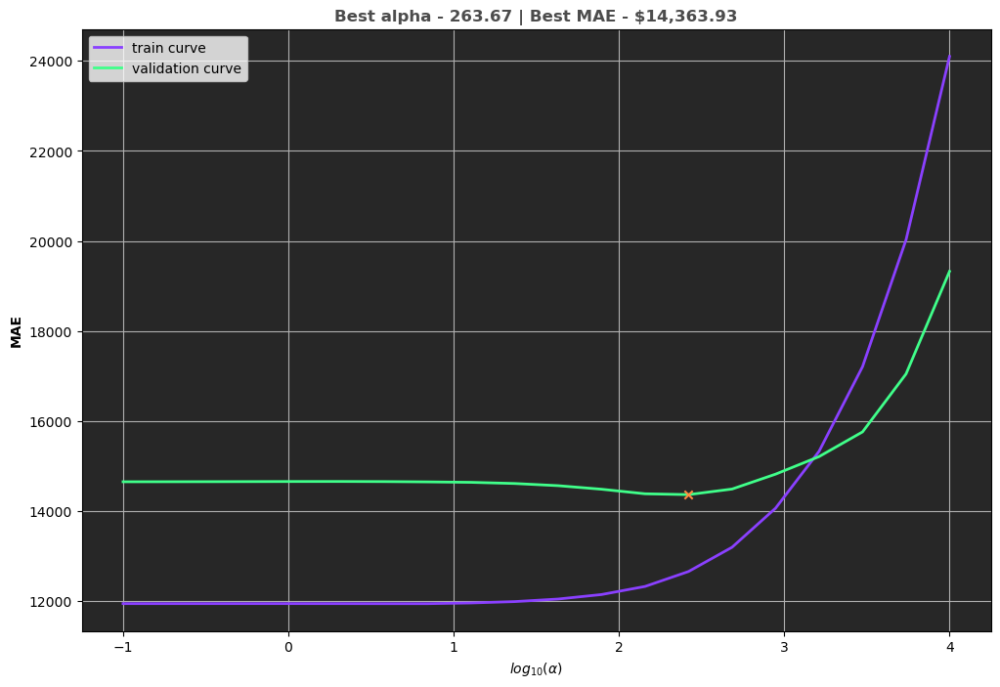

In [362]:
fig, ax = plt.subplots(figsize=(12, 8))

ax.plot(np.log10(gs_results["alpha"]), gs_results["train mae"], color="#8a40ff", label="train curve", linewidth=2)
ax.plot(np.log10(gs_results["alpha"]), gs_results["validation mae"], color="#40ff8a", label="validation curve", linewidth=2)

best_result = gs_results.loc[gs_results["validation mae"].idxmin()]
ax.scatter(
    np.log10(best_result["alpha"]), best_result["validation mae"], marker="x", c="#ff8a40", zorder=10, 
)

ax.set_title(
    f"Best alpha - {round(best_result['alpha'], 2)} | "
    f"Best MAE - ${round(best_result['validation mae'], 2):,.2f}", fontweight="bold", alpha=0.7
)

ax.set_xlabel("$log_{10}(\\alpha)$", fontweight="bold")
ax.set_ylabel("MAE", fontweight="bold")
ax.set_facecolor("#272727")
plt.legend()
plt.grid(True)
plt.show()

The optimal range of alpha values are between $\log_{10} 3.1$ and $\log_{10} 3.2$. An overfitting model occurs when alpha is below $\log_{10} 3.1$ and the MAE difference is approximately 2,200 dollars. The model begins to underfit when the alpha parameter is greater than $\log_{10} 3.2$. Whereas the gap between the training and validation error reduces, the model variance is higher relative to other alpha values.

In [363]:
print("Best alpha: ", round(best_result["alpha"], 6))
print(f"\nBest Validation MSE: ", round(best_result["validation mse"], 6))
print(f"\nBest Validation MAE: ${round(best_result["validation mae"], 2)}")

Best alpha:  263.66509

Best Validation MSE:  0.012965

Best Validation MAE: $14363.93


In [364]:
ridge_tr_rescaled2 = scaler.fit_transform(X_train)

ridge_val_rescaled2 = scaler.transform(X_val)

In [365]:
hyperparam_ridge = best_result["alpha"]

ridge2 = Ridge(alpha=hyperparam_ridge)

ridge2.fit(ridge_tr_rescaled2, y_train)

Ridge(alpha=263.6650898730358)

The ridge regression model selected 235 features and excluded 5 features. The barplots are of the 15 largest and smallest coefficents.



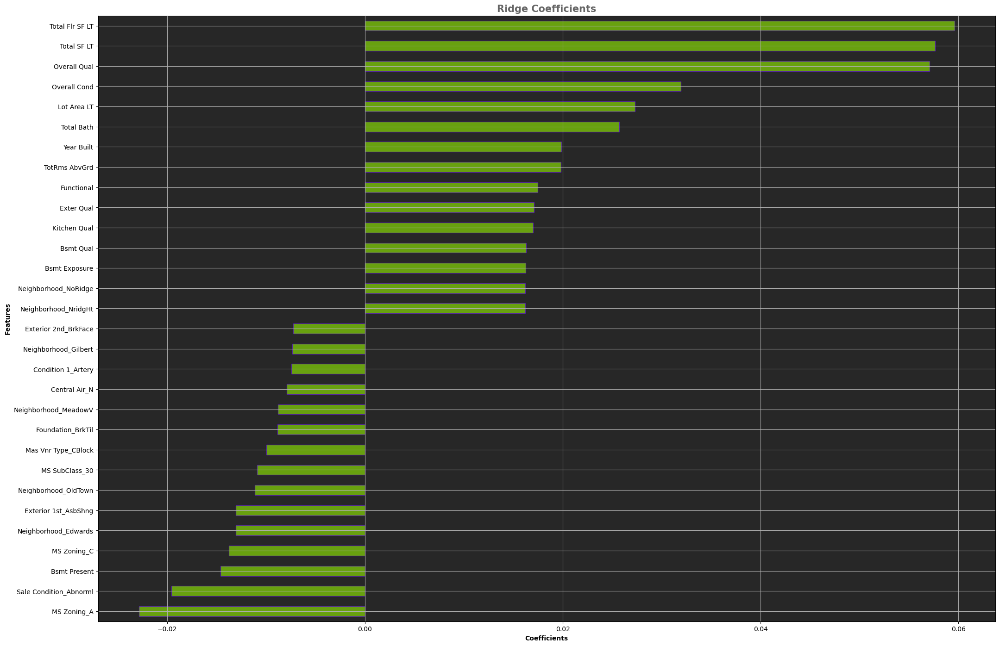

In [366]:
coefs_ridge = pd.Series(ridge2.coef_, index = X_train.columns)

print(f"The ridge regression model selected {str(sum(coefs_ridge != 0))} features and excluded {str(sum(coefs_ridge == 0))} features.\
 The barplots are of the 15 largest and smallest coefficents.\n")

coefs2_ridge = pd.concat([coefs_ridge.sort_values().head(15),
                     coefs_ridge.sort_values().tail(15)])

fig, ax = plt.subplots(figsize=(25, 17))

coefs2_ridge.plot(ax=ax, kind="barh", color="#95f300", edgecolor="#5e00f3", alpha=0.6)

ax.set_facecolor("#272727")
ax.set_title("Ridge Coefficients", fontweight="bold", fontsize=15, alpha=0.6)
ax.set_xlabel("Coefficients", fontweight="bold")
ax.set_ylabel("Features", fontweight="bold")
plt.grid(True)
plt.show()

In [367]:
print(f"MSE train set (complex_model): {round(MSE(y_train, ridge2.predict(ridge_tr_rescaled2)), 4)}\n")

print(f"MAE train set (complex model): ${round(MAE(np.expm1(y_train), np.expm1(ridge2.predict(ridge_tr_rescaled2))), 2):,.2f}\n")

MSE train set (complex_model): 0.0114

MAE train set (complex model): $12,656.10



In [368]:
y_pred_ridge = ridge2.predict(ridge_val_rescaled2)

mae_ridge = round(MAE(np.expm1(y_val), np.expm1(y_pred_ridge)), 2)

print(f"MSE validation set (complex model): {round(MSE(y_val, y_pred_ridge), 4)}\n")

print(f"MAE validation set (complex model): ${mae_ridge:,.2f}\n")

MSE validation set (complex model): 0.0118

MAE validation set (complex model): $13,476.00



In [369]:
r2_ridge = r2_score(y_val, y_pred_ridge)

print(f"R2 validation set (complex model): {r2_ridge:,.4f}")

R2 validation set (complex model): 0.9034


In [370]:
adjusted_r2_ridge = 1 - (1 - r2_ridge) * (len(y_val) - 1) / (len(y_val) - ridge_val_rescaled2.shape[1] - 1)

print(f"Adjusted R2 validation set (simple model): {adjusted_r2_ridge:,.4f}\n")

Adjusted R2 validation set (simple model): 0.8556



<br>**Lasso Regression - Complex Model**

In [371]:
lasso_tr_rescaled = scaler.fit_transform(X_train)

lasso_val_rescaled = scaler.fit_transform(X_val)

In [372]:
gs_results2 = []

for alpha in np.logspace(-1, 4, num=20):
    lasso = Lasso(alpha=alpha)
    lasso.fit(lasso_tr_rescaled, y_train)
    
    gs_results2.append(
        {
            "model": lasso,
            "alpha": alpha,
            "train mse": MSE(y_train, lasso.predict(lasso_tr_rescaled)),
            "train mae": MAE(np.expm1(y_train), np.expm1(lasso.predict(lasso_tr_rescaled))),
            "validation mse": MSE(y_val, lasso.predict(lasso_val_rescaled)),
            "validation mae": MAE(np.expm1(y_val), np.expm1(lasso.predict(lasso_val_rescaled))),
        }
    )

gs_results2 = pd.DataFrame(gs_results2)

gs_results2 = gs_results2.sort_values(by="validation mae").reset_index(drop=True)

gs_results2.head()

,model,alpha,train mse,train mae,validation mse,validation mae
0,Lasso(alpha=0.1),0.100000,0.042233,27047.673784,0.025789,20588.920196
1,Lasso(alpha=0.18329807108324356),0.183298,0.073831,37184.020815,0.044029,28026.784388
2,Lasso(alpha=0.33598182862837817),0.335982,0.165867,55669.686479,0.109975,45410.765376
3,Lasso(alpha=2976.351441631319),2976.351442,0.182512,58372.895122,0.122576,47939.828944
4,Lasso(alpha=1623.776739188721),1623.776739,0.182512,58372.895122,0.122576,47939.828944


In [373]:
best_result2 = gs_results2.loc[gs_results2["validation mae"].idxmin()]

print("Best alpha: ", round(best_result2["alpha"], 6))
print(f"\nBest Validation MSE: ", round(best_result2["validation mse"], 6))
print(f"\nBest Validation MAE: ${round(best_result2["validation mae"], 2):,.2f}")

Best alpha:  0.1

Best Validation MSE:  0.025789

Best Validation MAE: $20,588.92


In [374]:
lasso_tr_rescaled2 = scaler.fit_transform(X_train)

lasso_val_rescaled2 = scaler.fit_transform(X_val)

In [375]:
hyperparam_lasso = best_result2["alpha"]

lasso2 = Lasso(alpha=hyperparam_lasso)

lasso2.fit(lasso_tr_rescaled2, y_train)

Lasso(alpha=0.1)

The lasso regression model selected 6 features and excluded 234 features. The barplots are of the selected coefficents.



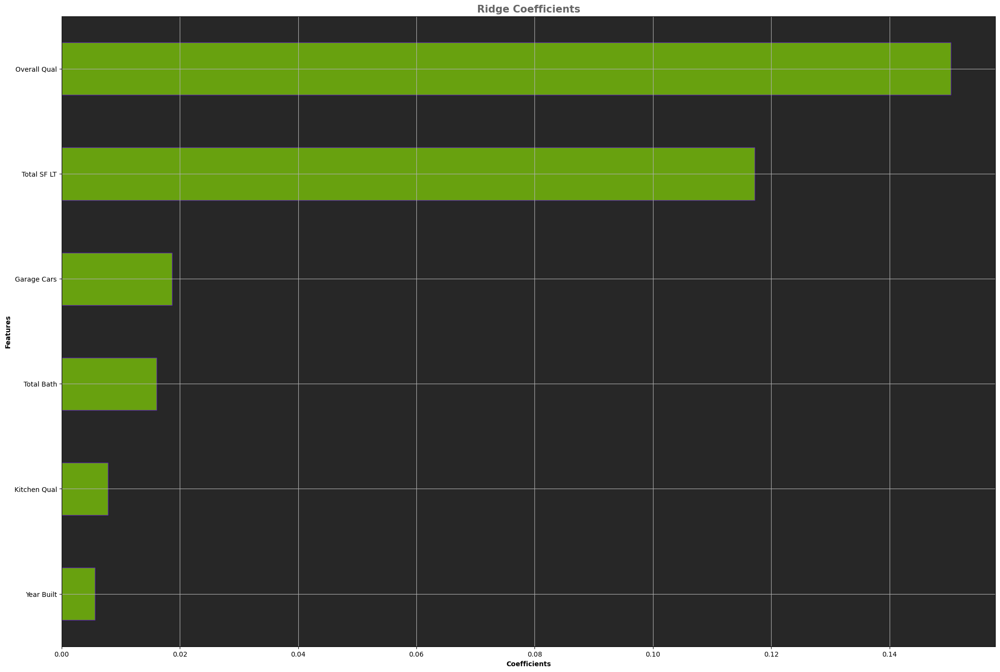

In [376]:
coefs_lasso = pd.Series(lasso2.coef_, index = X_train.columns)

print(f"The lasso regression model selected {str(sum(coefs_lasso != 0))} features and excluded {str(sum(coefs_lasso == 0))} features. The barplots are of the selected coefficents.\n")

coefs2_lasso = pd.concat([coefs_lasso.sort_values().tail(6)])

fig, ax = plt.subplots(figsize=(25, 17))

coefs2_lasso.plot(ax=ax, kind="barh", color="#95f300", edgecolor="#5e00f3", alpha=0.6)

ax.set_facecolor("#272727")
ax.set_title("Ridge Coefficients", fontweight="bold", fontsize=15, alpha=0.6)
ax.set_xlabel("Coefficients", fontweight="bold")
ax.set_ylabel("Features", fontweight="bold")
plt.grid(True)
plt.show()

In [377]:
print(f"MSE train set (complex_model): {round(MSE(y_train, lasso2.predict(lasso_tr_rescaled2)), 4)}\n")

print(f"MAE train set (complex model): ${round(MAE(np.expm1(y_train), np.expm1(lasso2.predict(lasso_tr_rescaled2))), 2):,.2f}\n")

MSE train set (complex_model): 0.0422

MAE train set (complex model): $27,047.67



In [378]:
y_pred_lasso = lasso2.predict(lasso_val_rescaled2)

mae_lasso = round(MAE(np.expm1(y_val), np.expm1(y_pred_lasso)), 2)

print(f"MSE validation set (complex model): {round(MSE(y_val, y_pred_lasso), 4)}\n")

print(f"MAE validation set (complex model): ${mae_lasso:,.2f}\n")

MSE validation set (complex model): 0.0258

MAE validation set (complex model): $20,588.92



In [379]:
r2_lasso = r2_score(y_val, y_pred_lasso)

print(f"R2 validation set (simple model): {r2_lasso:,.4f}")

R2 validation set (simple model): 0.7896


In [380]:
adjusted_r2_lasso = 1 - (1 - r2_lasso) * (len(y_val) - 1) / (len(y_val) - lasso_val_rescaled2.shape[1] - 1)

print(f"Adjusted R2 validation set (simple model): {adjusted_r2_lasso:,.4f}\n")

Adjusted R2 validation set (simple model): 0.6854



<br>**MAE and  Adjusted R2 Comparison**

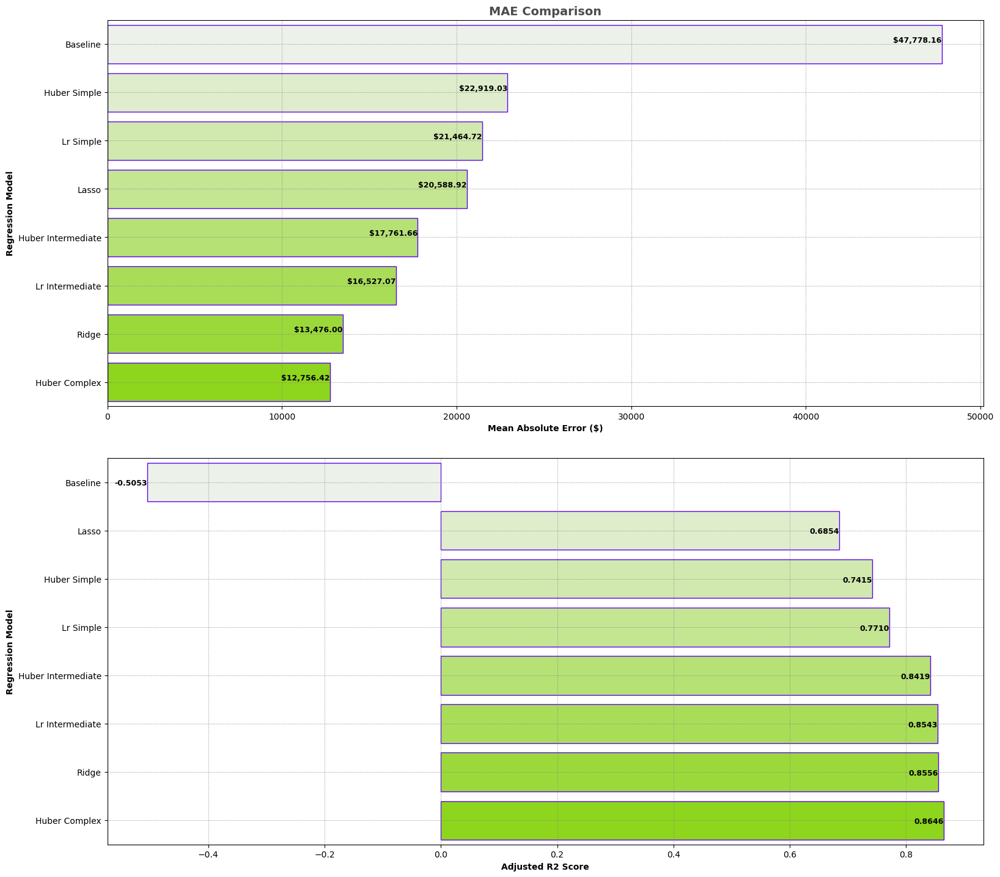

In [381]:
regression_model = [
    "Baseline", "Lr Simple", "Lr Intermediate", 
    "Huber Simple", "Huber Intermediate", 
    "Huber Complex", "Ridge", "Lasso"
]

mae_values = [mae_baseline, mae_lr_simp, mae_lr_inter,
             mae_huber_simp, mae_huber_inter, 
              mae_huber_complex, mae_ridge, mae_lasso]

adjusted_r2_values = [adjusted_r2_baseline, adjusted_r2_lr_simp, 
                     adjusted_r2_lr_inter, adjusted_r2_huber_simp, 
                      adjusted_r2_huber_inter, adjusted_r2_huber_complex, 
                      adjusted_r2_ridge, adjusted_r2_lasso]

df_mae = pd.DataFrame({
    "Regression Model": regression_model,
    "MAE": mae_values
})

df_mae = df_mae.sort_values(by="MAE", ascending=False).reset_index(drop=True)


df_r2 =  pd.DataFrame({
    "Regression Model": regression_model,
    "R2": adjusted_r2_values
})

df_r2 = df_r2.sort_values(by="R2").reset_index(drop=True)


fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(17, 15))

sns.barplot(ax=ax[0], x="MAE", y="Regression Model", data=df_mae, hue="Regression Model", palette="light:#95f300", edgecolor="#5e00f3", legend=False)
sns.color_palette("Spectral", as_cmap=True)

for i, value in enumerate(df_mae["MAE"]):
    ax[0].text(value, i, f"${value:,.2f}", ha="right", va="bottom", color="black", fontsize=9, fontweight="bold")

ax[0].grid(True, which="both", linestyle="--", linewidth=0.5, color="gray", alpha=0.7)

ax[0].set_title("MAE Comparison", fontsize=14, fontweight="bold", alpha=0.7)
ax[0].set_xlabel("Mean Absolute Error ($)", fontweight="bold")
ax[0].set_ylabel("Regression Model", fontweight="bold")


sns.barplot(ax=ax[1], x="R2", y="Regression Model", data=df_r2, hue="Regression Model", palette="light:#95f300", edgecolor="#5e00f3", legend=False)

for i, value in enumerate(df_r2["R2"]):
    ax[1].text(value, i, f"{value:,.4f}", ha="right", va="center_baseline", color="black", fontsize=9, fontweight="bold")

ax[1].grid(True, which="both", linestyle="--", linewidth=0.5, color="gray", alpha=0.7)

ax[1].set_xlabel("Adjusted R2 Score", fontweight="bold")
ax[1].set_ylabel("Regression Model", fontweight="bold")


plt.tight_layout(pad=3)
plt.show()

<br> 
The complex huber regression model has a lower mean absolute error than the ridge regression model. Interestingly the lasso regression model does not perfrom better than the simple regression models despite the most important features having been identified. The lasso regression model's adjusted R2 score suggests that the regularisation parameter has eliminated important features. Post-modelling analysis shall focus on the simple, intermediate and complex huber regression models, and the ridge regression model to assess the distribution of sale price predictions and errors. By analysing changes in model complexity, specific features and observations can be identified that may hamper predictive power and affect model generalsiation on unseen data. 

<br> 

# **Post-Modelling Analysis**

The variable df_pred stores a dataframe of the validation set's true sale prices together with the predicted sale prices of the four statistical models.

In [382]:
df_pred = pd.DataFrame({
    "y_true": y_val,
    "y_pred_huber_simp": y_pred_huber_simp,
    "y_pred_huber_inter": y_pred_huber_inter,
    "y_pred_ridge": y_pred_ridge,
    "y_pred_huber_complex": y_pred_huber_complex,
})
    
df_pred = df_pred.map(np.expm1)

df_pred.sample(10)

,y_true,y_pred_huber_simp,y_pred_huber_inter,y_pred_ridge,y_pred_huber_complex
1245,279700.0,272529.269874,275142.301008,233211.045087,240979.578338
1598,160000.0,157304.675689,137170.969713,137839.200091,141981.604382
2287,133500.0,115972.817090,120955.193124,125294.446060,124450.831324
1573,133500.0,110428.818887,121899.820964,132287.085859,128291.732972
1645,132000.0,117409.743193,112653.159968,124213.412025,129098.705351
1884,170000.0,186100.732443,192468.121125,191809.854711,187426.334954
1148,229000.0,214285.835441,218274.112917,215573.713642,206032.198892
1444,165000.0,175719.788487,188682.491540,175181.414764,167633.415266
2094,186800.0,219431.246970,197927.631102,202781.321499,197589.310799
1316,159500.0,186257.865939,182755.738247,178219.157909,188236.024895


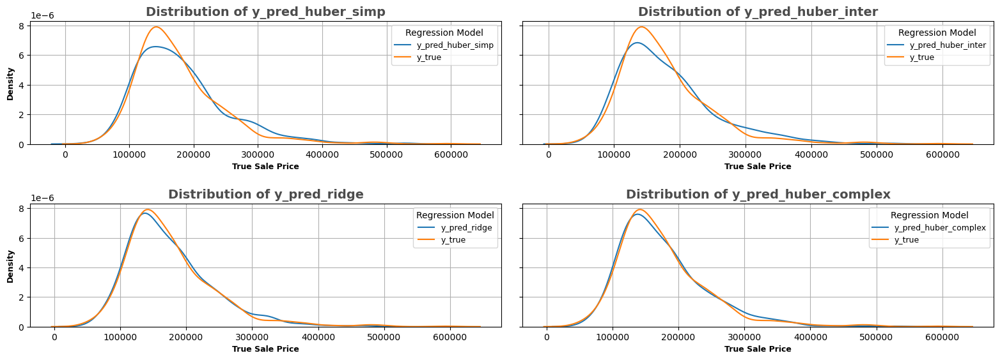

In [383]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(16, 6), sharey=True)

axes = axes.flatten()

for i, col in enumerate(df_pred.columns[df_pred.columns != "y_true"]):
    ax = axes[i]
    sns.kdeplot(df_pred[col], label=col, ax=ax) 
    sns.kdeplot(df_pred["y_true"], label="y_true", ax=ax) 

    ax.set_title(f"Distribution of {col}", fontsize=14, fontweight="bold", alpha=0.7)
    ax.set_xlabel("True Sale Price", fontsize=9, fontweight="bold")
    ax.set_ylabel("Density", fontsize=9, fontweight="bold")
    ax.legend(loc="best", title="Regression Model", prop={"size": 9})
    ax.grid(True)

plt.tight_layout(pad=2)
plt.show()

The KDE plot confirms that the ridge regression and complex huber model predictions are most aligned to the true sale price values. Moreover, the range of sale price predictions that are underestimated and overestimated for the aforementioned statistical models are roughly the same.

<br>

## **Prediction Errors**

Visualising each observation's true sale price against its residual would illustrate whether there are understimation or overestimation patterns. Regression models for the training sets are assigned to distinct variables, and residuals are computed for the test and validation sets. Thereafter, a for loop is instantiated to iteratively plot the calculated values for the selected models. 

In [384]:
#huber complex
y_pred_huber_complex_tr = huber3.predict(complex_tr_rescaled_huber)

residuals_huber_complex_tr = np.expm1(y_pred_huber_complex_tr) - np.expm1(y_train)

residuals_huber_complex = np.expm1(y_pred_huber_complex) - np.expm1(y_val)


#ridge
y_pred_ridge_tr = ridge2.predict(ridge_tr_rescaled2)

residuals_ridge_tr = np.expm1(y_pred_ridge_tr) - np.expm1(y_train)

residuals_ridge = np.expm1(y_pred_ridge) - np.expm1(y_val)


#huber intermediate
y_pred_huber_inter_tr = huber2.predict(inter_tr_rescaled_huber)

residuals_huber_inter_tr = np.expm1(y_pred_huber_inter_tr) - np.expm1(y_train)

residuals_huber_inter = np.expm1(y_pred_huber_inter) - np.expm1(y_val)


#huber simple
y_pred_huber_simp_tr = huber.predict(simp_tr_rescaled_huber)

residuals_huber_simp_tr = np.expm1(y_pred_huber_simp_tr) - np.expm1(y_train)

residuals_huber_simp = np.expm1(y_pred_huber_simp) - np.expm1(y_val)

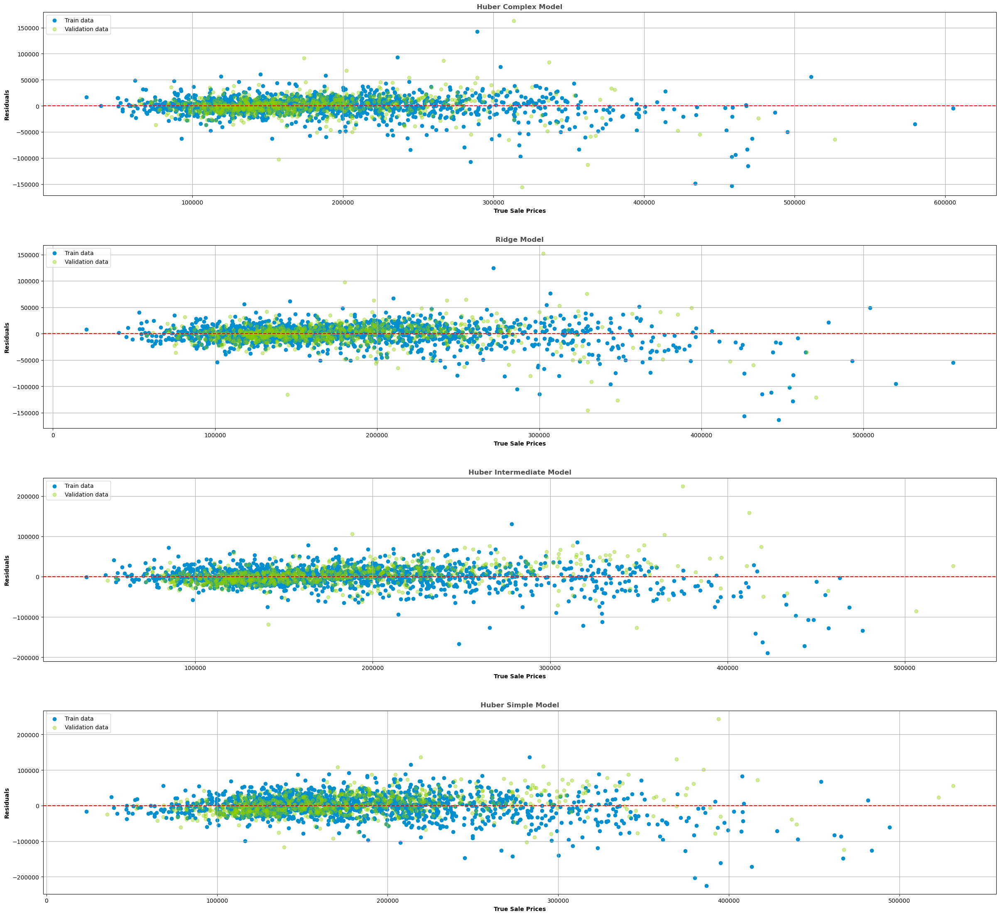

In [385]:
residual_plots = [
    ("Huber Complex Model", y_pred_huber_complex_tr, residuals_huber_complex_tr, y_pred_huber_complex, residuals_huber_complex),
    ("Ridge Model", y_pred_ridge_tr, residuals_ridge_tr, y_pred_ridge, residuals_ridge),
    ("Huber Intermediate Model", y_pred_huber_inter_tr, residuals_huber_inter_tr, y_pred_huber_inter, residuals_huber_inter),
    ("Huber Simple Model", y_pred_huber_simp_tr, residuals_huber_simp_tr, y_pred_huber_simp, residuals_huber_simp)
]

fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(25, 23))

for i, (title, y_pred_tr, residuals_tr, y_pred_val, residuals_val) in enumerate(residual_plots):
    ax[i].scatter(np.expm1(y_pred_tr), residuals_tr, c="#008fce", label="Train data")
    ax[i].scatter(np.expm1(y_pred_val), residuals_val, c="#8fce00", alpha=0.4, label="Validation data")
    ax[i].axhline(0, color="red", linestyle='--')
    ax[i].set_title(title, fontweight="bold", alpha=0.7)
    ax[i].set_xlabel("True Sale Prices", fontweight="bold")
    ax[i].set_ylabel("Residuals", fontweight="bold")
    ax[i].grid(True)
    ax[i].legend(loc="upper left")

plt.tight_layout(pad=4)
plt.show()

There is evidence of homoskedasticity across the four regression models; the variance of the residuals are constant. 

<br>As the validation set has a sizeable number of observations, visualising descriptive statistics on roughly 1/3 of the predicted sale prices shall helpfully summarise key error characteristics. The computed indicators include each sample's average residual, average predicated mean and average standard deviation across the four models.

In [386]:
models = df_pred.loc[:, ["y_pred_huber_simp", "y_pred_huber_inter", "y_pred_ridge", "y_pred_huber_complex"]].copy()

errors = models.subtract(df_pred.y_true, axis=0)

avg_errors = errors.mean(axis=1)
avg_errors.name = "avg error"

std_errors = errors.std(axis=1)
std_errors.name = "std error"

In [387]:
df_pred2 = df_pred.sort_values("y_true").reset_index(drop=False)

#best average
best_avg = np.abs(avg_errors).sort_values().to_frame().head(250)

best_avg_samples = df_pred2.loc[df_pred2["index"].isin(best_avg.index)]


#largest underestimation average
avg_under = avg_errors.sort_values().to_frame().head(250)

avg_under_samples = df_pred2.loc[df_pred2["index"].isin(avg_under.index)]


#largest overestimation average
avg_over = avg_errors.sort_values(ascending=False).to_frame().head(250)

avg_over_samples = df_pred2.loc[df_pred2["index"].isin(avg_over.index)]


#predicated values closest to its true sale price 
min_std = std_errors.sort_values().to_frame().head(250)

min_std_samples = df_pred2.loc[df_pred2["index"].isin(min_std.index)]


#predicated values furthest from its true sale price 
max_std = std_errors.sort_values(ascending=False).to_frame().head(250)

max_std_samples = df_pred2.loc[df_pred2["index"].isin(max_std.index)]

<br> The function descriptive_stats plots the true and predicted sale prices for the selected models.

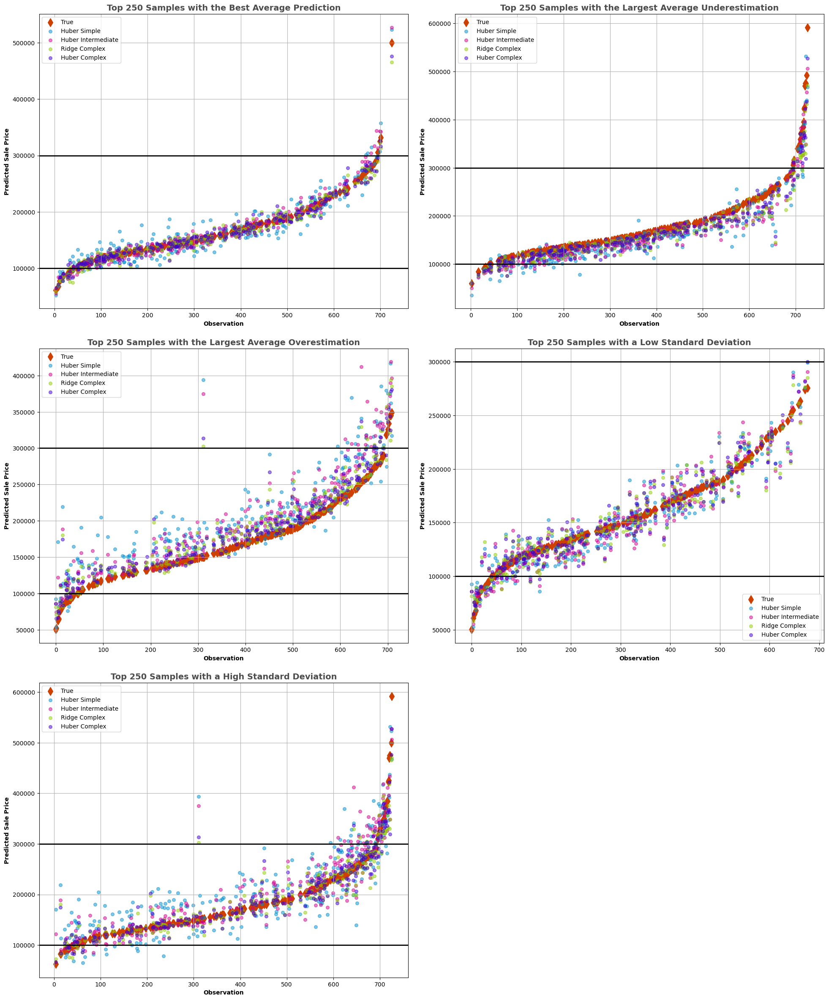

In [388]:
def descriptive_stats(ax, indices, y_true, y_pred_simp, y_pred_inter, y_pred_complex, y_pred_complex2, title):
    s = 30
    ax.scatter(indices, y_true, color="#ce3f00", marker="d", s=100, label="True")
    ax.scatter(indices, y_pred_simp, color="#008fce",  alpha=0.5, s=s, label="Huber Simple")
    ax.scatter(indices, y_pred_inter, color="#ce008f",  alpha=0.5, s=s, label="Huber Intermediate")
    ax.scatter(indices, y_pred_complex, color="#8fce00",  alpha=0.5, s=s, label="Ridge Complex")
    ax.scatter(indices, y_pred_complex2, color="#3f00ce",  alpha=0.5, s=s, label="Huber Complex")
    ax.axhline(y=100000, color="black", linestyle="-", linewidth=2)
    ax.axhline(y=300000, color="black", linestyle="-", linewidth=2)
    ax.set_title(title, fontsize=14, fontweight="bold", alpha=0.7)
    ax.set_xlabel("Observation", fontweight="bold")
    ax.set_ylabel("Predicted Sale Price", fontweight="bold")
    ax.grid(True)
    ax.legend(loc="best")

fig, ax = plt.subplots(nrows=3, ncols=2, figsize=(20, 4 * len(df_pred2.columns)))

descriptive_stats(ax[0, 0], best_avg_samples.index, 
            best_avg_samples.y_true, 
            best_avg_samples.y_pred_huber_simp, 
            best_avg_samples.y_pred_huber_inter, 
            best_avg_samples.y_pred_ridge,
            best_avg_samples.y_pred_huber_complex, 
            "Top 250 Samples with the Best Average Prediction")

descriptive_stats(ax[0, 1], avg_under_samples.index, 
            avg_under_samples.y_true, 
            avg_under_samples.y_pred_huber_simp, 
            avg_under_samples.y_pred_huber_inter,
            avg_under_samples.y_pred_ridge,
            avg_under_samples.y_pred_huber_complex, 
            "Top 250 Samples with the Largest Average Underestimation")

descriptive_stats(ax[1, 0], avg_over_samples.index, 
            avg_over_samples.y_true, 
            avg_over_samples.y_pred_huber_simp, 
            avg_over_samples.y_pred_huber_inter,
            avg_over_samples.y_pred_ridge,
            avg_over_samples.y_pred_huber_complex, 
            "Top 250 Samples with the Largest Average Overestimation")

descriptive_stats(ax[1, 1], min_std_samples.index, 
            min_std_samples.y_true, 
            min_std_samples.y_pred_huber_simp, 
            min_std_samples.y_pred_huber_inter,
            min_std_samples.y_pred_ridge,
            min_std_samples.y_pred_huber_complex, 
            "Top 250 Samples with a Low Standard Deviation")

descriptive_stats(ax[2, 0], max_std_samples.index, 
            max_std_samples.y_true, 
            max_std_samples.y_pred_huber_simp, 
            max_std_samples.y_pred_huber_inter,
            max_std_samples.y_pred_ridge,
            max_std_samples.y_pred_huber_complex, 
            "Top 250 Samples with a High Standard Deviation")

fig.delaxes(ax[2, 1])

plt.tight_layout(pad=2)
plt.show()

<br> The selected predictions are range between the previously defined sale price thresholds which are less than \\$100,000, between \\$100,000 - \\$300,000 and above \\$300,000. Identifying observations that overlap specifically, observations that have an overestimated or understimated prediction and large error, and samples with a small or large error and good averagecould help with improving the generalisation power of the regression models.

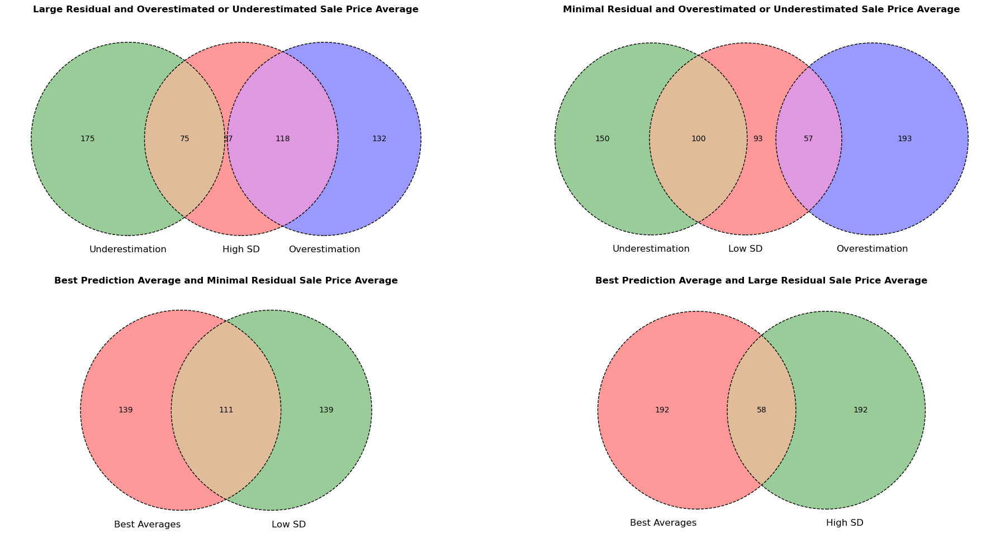

In [389]:
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(20, 10))

venn3([set(max_std.index), set(avg_under.index), set(avg_over.index)],
      set_labels=("High SD", "Underestimation", "Overestimation"),
      ax=ax[0,0])

venn3_circles([set(max_std.index), set(avg_under.index), set(avg_over.index)], 
              linestyle="dashed", linewidth=1, ax=ax[0,0])

ax[0,0].set_title("Large Residual and Overestimated or Underestimated Sale Price Average", fontweight="bold")


venn3([set(min_std.index), set(avg_under.index), set(avg_over.index)],
      set_labels=("Low SD", "Underestimation", "Overestimation"), ax=ax[0,1])

venn3_circles([set(min_std.index), set(avg_under.index), set(avg_over.index)], 
              linestyle="dashed", linewidth=1, ax=ax[0,1])

ax[0,1].set_title("Minimal Residual and Overestimated or Underestimated Sale Price Average", fontweight="bold")

venn2([set(best_avg.index), set(min_std.index)],
      set_labels=("Best Averages", "Low SD"),
      ax=ax[1,0])

venn2_circles([set(best_avg.index), set(min_std.index)], 
              linestyle="dashed", linewidth=1, ax=ax[1,0])

ax[1,0].set_title("Best Prediction Average and Minimal Residual Sale Price Average", fontweight="bold")


venn2([set(best_avg.index), set(max_std.index)],
      set_labels=("Best Averages", "High SD"),
      ax=ax[1,1])

venn2_circles([set(best_avg.index), set(max_std.index)], 
              linestyle="dashed", linewidth=1, ax=ax[1,1])


ax[1,1].set_title("Best Prediction Average and Large Residual Sale Price Average", fontweight="bold")

plt.tight_layout(pad=2)
plt.show()

<br>

* 75 samples have an underestimated prediction average and residual far away from the true sale price mean
  
* 118 samples have an overestimated prediction average and residual far away from the true sale price mean

* 100 samples have an underestimated prediction average and residual close to the true sale price mean

* 57 samples have an overestimated prediction average and residual close to the true sale price mean
  
* 111 samples have predictions that are alike to the true sale price and residual close to the true sale price mean

* 58 samples have predictions that are alike to the true sale price and far away from the true sale price mean

<br> The observations that make up the intersections of the four venn diagrams are assigned to variables and KDE curves are plotted to view the distribution of errors across the 6 identified sample groups.

In [390]:
#large residual and underestimated sale price average
intersec1 = max_std.index.intersection(avg_under.index)

df_intersec1 = df_pred.loc[intersec1, :]


#large residual and overestimated sale price average
intersec2 = max_std.index.intersection(avg_over.index)

df_intersec2 = df_pred.loc[intersec2, :]


#minimal residual and underestimated sale price average
intersec3 = min_std.index.intersection(avg_under.index)

df_intersec3 = df_pred.loc[intersec3, :]


#minimal residual and overestimated sale price average
intersec4 = min_std.index.intersection(avg_over.index)

df_intersec4 = df_pred.loc[intersec4, :]


#minimal residual and good sale price average
intersec5 = min_std.index.intersection(best_avg.index)

df_intersec5 = df_pred.loc[intersec5, :]


#large residual and good sale price average
intersec6 = max_std.index.intersection(best_avg.index)

df_intersec6 = df_pred.loc[intersec6, :]

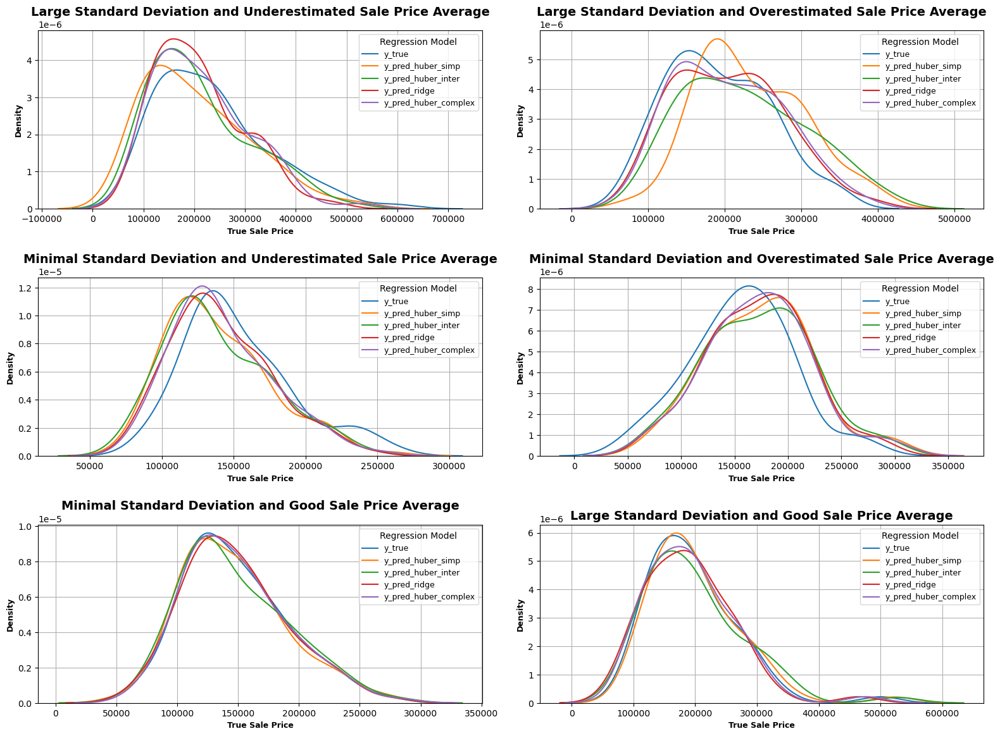

In [391]:
fig, ax = plt.subplots(nrows=3, ncols=2, figsize=(16, 12))

for c in df_intersec1.columns[df_intersec1.columns.str.startswith("y_")]:
    sns.kdeplot(df_intersec1[c].dropna(), label=c, ax=ax[0,0])

ax[0,0].set_title("Large Standard Deviation and Underestimated Sale Price Average", fontsize=14, fontweight="bold")
ax[0,0].set_xlabel("True Sale Price", fontsize=9, fontweight="bold")
ax[0,0].set_ylabel("Density", fontsize=9, fontweight="bold")
ax[0,0].legend(loc="best", title="Regression Model", prop={"size": 9})
ax[0,0].grid(True)


for c in df_intersec2.columns[df_intersec2.columns.str.startswith("y_")]:
    sns.kdeplot(df_intersec2[c].dropna(), label=c, ax=ax[0,1])

ax[0,1].set_title("Large Standard Deviation and Overestimated Sale Price Average", fontsize=14, fontweight="bold")
ax[0,1].set_xlabel("True Sale Price", fontsize=9, fontweight="bold")
ax[0,1].set_ylabel("Density", fontsize=9, fontweight="bold")
ax[0,1].legend(loc="best", title="Regression Model", prop={"size": 9})
ax[0,1].grid(True)


for c in df_intersec3.columns[df_intersec3.columns.str.startswith("y_")]:
    sns.kdeplot(df_intersec3[c].dropna(), label=c, ax=ax[1,0])

ax[1,0].set_title("Minimal Standard Deviation and Underestimated Sale Price Average", fontsize=14, fontweight="bold")
ax[1,0].set_xlabel("True Sale Price", fontsize=9, fontweight="bold")
ax[1,0].set_ylabel("Density", fontsize=9, fontweight="bold")
ax[1,0].legend(loc="best", title="Regression Model", prop={"size": 9})
ax[1,0].grid(True)


for c in df_intersec4.columns[df_intersec4.columns.str.startswith("y_")]:
    sns.kdeplot(df_intersec4[c].dropna(), label=c, ax=ax[1,1])

ax[1,1].set_title("Minimal Standard Deviation and Overestimated Sale Price Average", fontsize=14, fontweight="bold")
ax[1,1].set_xlabel("True Sale Price", fontsize=9, fontweight="bold")
ax[1,1].set_ylabel("Density", fontsize=9, fontweight="bold")
ax[1,1].legend(loc="best", title="Regression Model", prop={"size": 9})
ax[1,1].grid(True)


for c in df_intersec5.columns[df_intersec5.columns.str.startswith("y_")]:
    sns.kdeplot(df_intersec5[c].dropna(), label=c, ax=ax[2,0])

ax[2,0].set_title("Minimal Standard Deviation and Good Sale Price Average", fontsize=14, fontweight="bold")
ax[2,0].set_xlabel("True Sale Price", fontsize=9, fontweight="bold")
ax[2,0].set_ylabel("Density", fontsize=9, fontweight="bold")
ax[2,0].legend(loc="best", title="Regression Model", prop={"size": 9})
ax[2,0].grid(True)


for c in df_intersec6.columns[df_intersec6.columns.str.startswith("y_")]:
    sns.kdeplot(df_intersec6[c].dropna(), label=c, ax=ax[2,1])

ax[2,1].set_title("Large Standard Deviation and Good Sale Price Average", fontsize=14, fontweight="bold")
ax[2,1].set_xlabel("True Sale Price", fontsize=9, fontweight="bold")
ax[2,1].set_ylabel("Density", fontsize=9, fontweight="bold")
ax[2,1].legend(loc="best", title="Regression Model", prop={"size": 9})
ax[2,1].grid(True)

plt.tight_layout(pad=2)
plt.show()

The plot on samples with a minimal standard deviation and good sale price average have approxiamtely accurate predictions upto $340, 000. The shapes and peaks of the additional KDF curves illustate that the models have some bias that result in an overestimation or underestimation of sale price.

<br> 

#### **Large Residuals and Underestimated Predictions**


**Correlation Analysis**

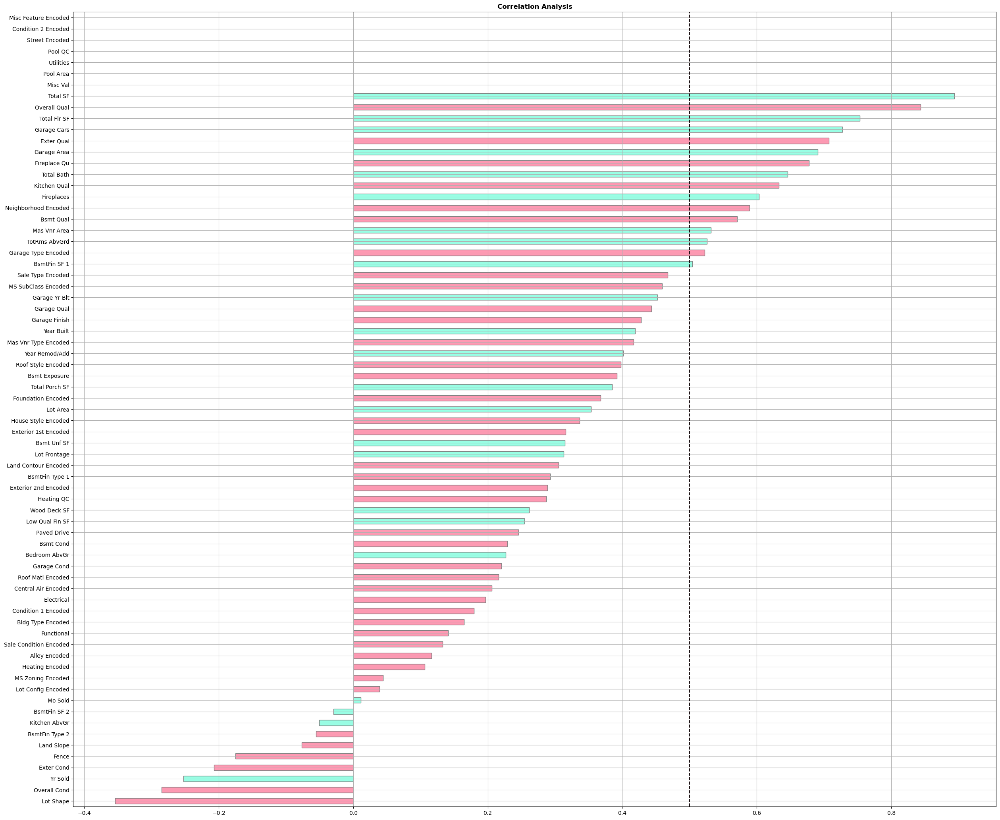

In [392]:
mask23 = pd.concat([raw3, raw2[nominal_rank]], axis=1)

mask23 = mask23.loc[intersec1, :]      

corr4 = mask23[int_col2 + float_col2 + ordinal_col2 + nominal_rank].corr()

corr4 = corr4.loc["SalePrice", :]

corr4.drop(index="SalePrice", inplace=True)

corr4.sort_values(inplace=True)

fig, ax = plt.subplots(figsize=(30,26))

corr4.plot(ax=ax, kind="barh", figsize=(30,26), color=["#ff99b3" if col in nominal_rank or col in ordinal_col else "#99ffe5" for col in corr4.index], edgecolor="gray")

ax.axvline(x=0.5, color="#190f11", linestyle="--")

plt.grid()

plt.title("Correlation Analysis", fontsize=12, fontweight="bold")

plt.show()

The features Heating Encoded, Street Encoded and Utilities may have constant values - all values in each column are likely the same. As the standard deviation is 0 the correlation calculation results in NaN. Columns with a constant value can affect prediction values. Information about sale price variability is not provided. The features may not contribute to the regression model's understanding of interactions between explanatory variables and the target variable which could affect coefficient regularisation. Removing features with constant values may improve model interpretability.

In [393]:
nan = corr4[corr4.isna() == True].index

print(f"Count of unique values:\n")

mask23[nan].nunique()

Count of unique values:



Misc Val                1
Pool Area               1
Utilities               1
Pool QC                 1
Street Encoded          1
Condition 2 Encoded     1
Misc Feature Encoded    1
dtype: int64

<br> 

#### **Large Residual and Overestimated Sale Price Average**

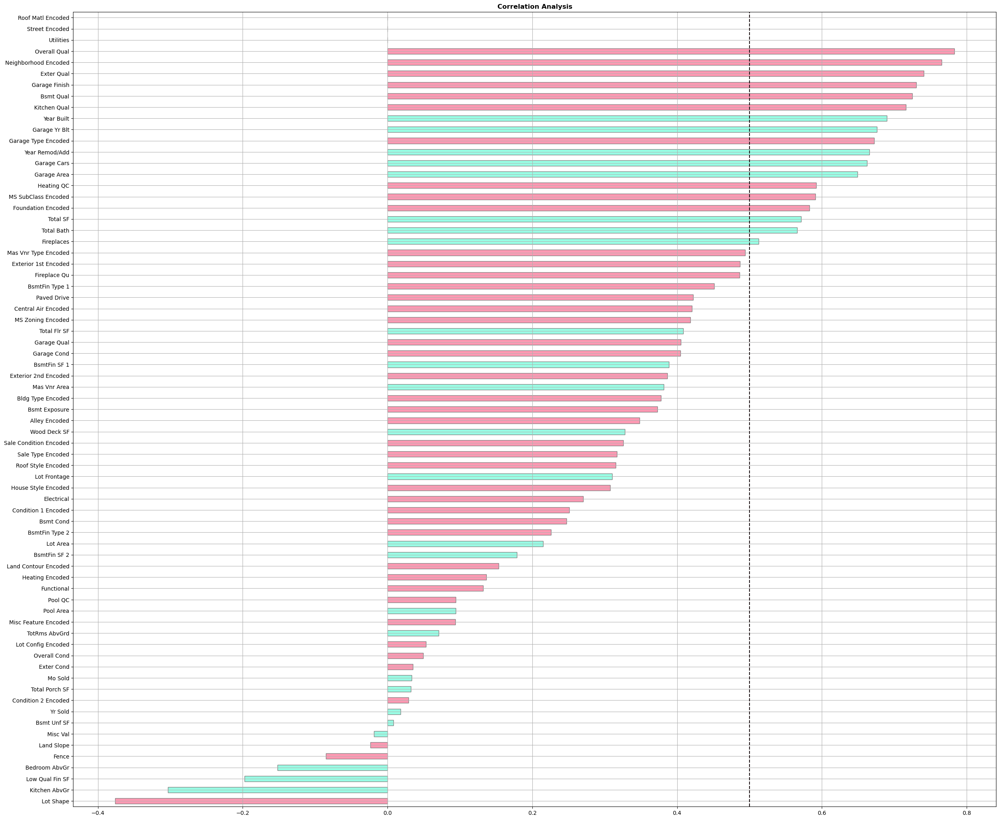

In [394]:
mask24 = pd.concat([raw3, raw2[nominal_rank]], axis=1)

mask24 = mask24.loc[intersec2, :]      

corr5 = mask24[int_col2 + float_col2 + ordinal_col2 + nominal_rank].corr()

corr5 = corr5.loc["SalePrice", :]

corr5.drop(index="SalePrice", inplace=True)

corr5.sort_values(inplace=True)

fig, ax = plt.subplots(figsize=(30,26))

corr5.plot(ax=ax, kind="barh", figsize=(30,26), color=["#ff99b3" if col in nominal_rank or col in ordinal_col else "#99ffe5" for col in corr5.index], edgecolor="gray")

ax.axvline(x=0.5, color="#190f11", linestyle="--")

plt.grid()

plt.title("Correlation Analysis", fontsize=12, fontweight="bold")

plt.show()

In [395]:
nan2 = corr5[corr5.isna() == True].index

print(f"Count of unique values:\n")

mask24[nan2].nunique()

Count of unique values:



Utilities            1
Street Encoded       1
Roof Matl Encoded    1
dtype: int64

<br>

#### **Minimal Residuals and Overestimated Sale Price Average**

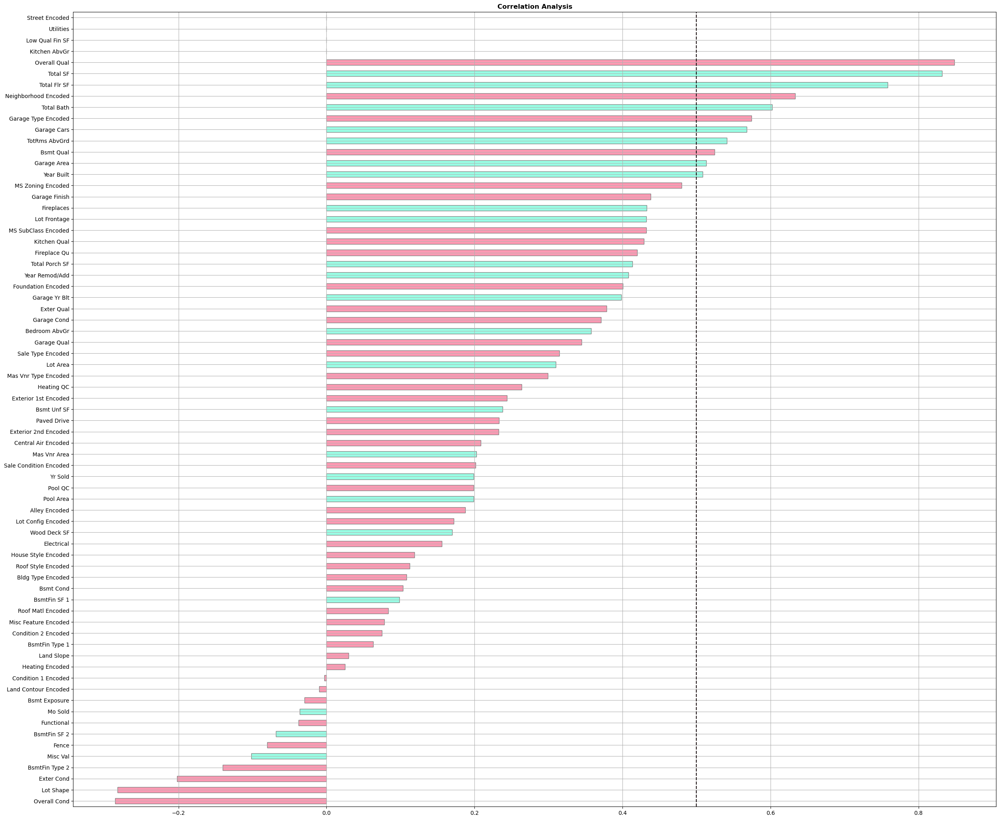

In [396]:
mask25 = pd.concat([raw3, raw2[nominal_rank]], axis=1)

mask25 = mask25.loc[intersec3, :]      

corr6 = mask25[int_col2 + float_col2 + ordinal_col2 + nominal_rank].corr()

corr6 = corr6.loc["SalePrice", :]

corr6.drop(index="SalePrice", inplace=True)

corr6.sort_values(inplace=True)

fig, ax = plt.subplots(figsize=(30,26))

corr6.plot(ax=ax, kind="barh", figsize=(30,26), color=["#ff99b3" if col in nominal_rank or col in ordinal_col else "#99ffe5" for col in corr6.index], edgecolor="gray")

ax.axvline(x=0.5, color="#190f11", linestyle="--")

plt.grid()

plt.title("Correlation Analysis", fontsize=12, fontweight="bold")

plt.show()

In [397]:
nan3 = corr6[corr6.isna() == True].index

print(f"Count of unique values:\n")

mask25[nan3].nunique()

Count of unique values:



Kitchen AbvGr      1
Low Qual Fin SF    1
Utilities          1
Street Encoded     1
dtype: int64

<br>

#### **Minimal Residuals and Overestimated Sale Price Average**

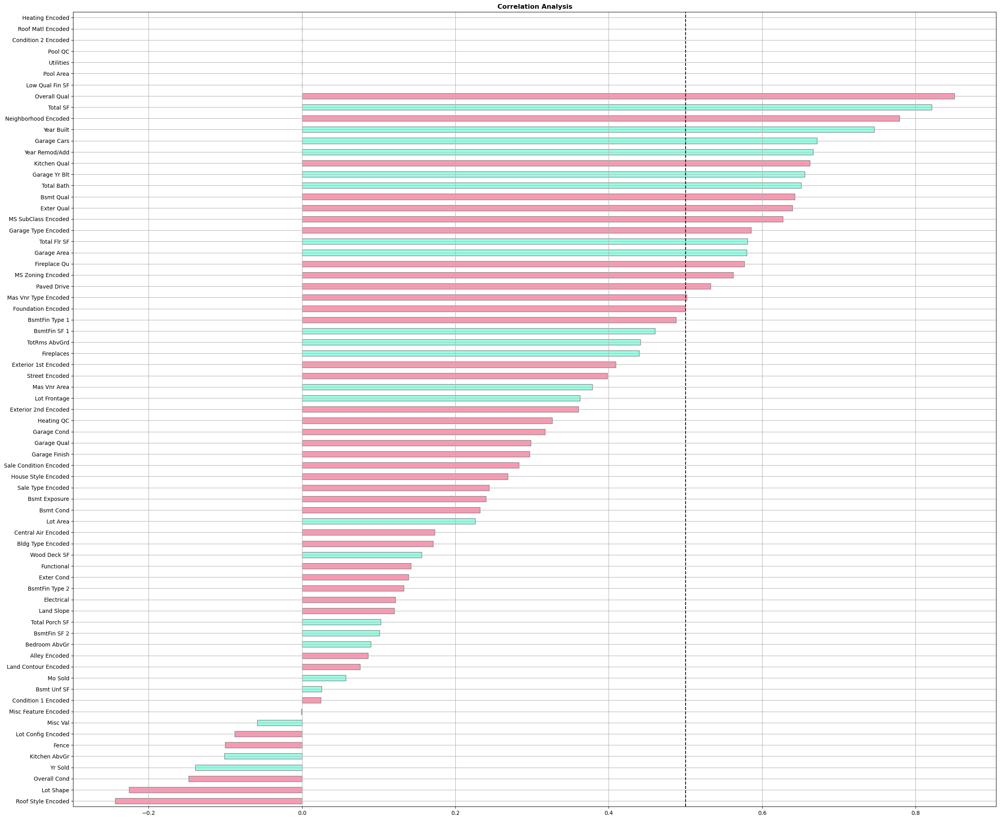

In [398]:
mask26 = pd.concat([raw3, raw2[nominal_rank]], axis=1)

mask26 = mask26.loc[intersec4, :]      

corr7 = mask26[int_col2 + float_col2 + ordinal_col2 + nominal_rank].corr()

corr7 = corr7.loc["SalePrice", :]

corr7.drop(index="SalePrice", inplace=True)

corr7.sort_values(inplace=True)

fig, ax = plt.subplots(figsize=(30,26))

corr7.plot(ax=ax, kind="barh", figsize=(30,26), color=["#ff99b3" if col in nominal_rank or col in ordinal_col else "#99ffe5" for col in corr7.index], edgecolor="gray")

ax.axvline(x=0.5, color="#190f11", linestyle="--")

plt.grid()

plt.title("Correlation Analysis", fontsize=12, fontweight="bold")

plt.show()

In [399]:
nan4 = corr7[corr7.isna() == True].index

print(f"Count of unique values:\n")

mask26[nan4].nunique()

Count of unique values:



Low Qual Fin SF        1
Pool Area              1
Utilities              1
Pool QC                1
Condition 2 Encoded    1
Roof Matl Encoded      1
Heating Encoded        1
dtype: int64

<br>

#### **Minimal Residuals and Good Sale Price Average**

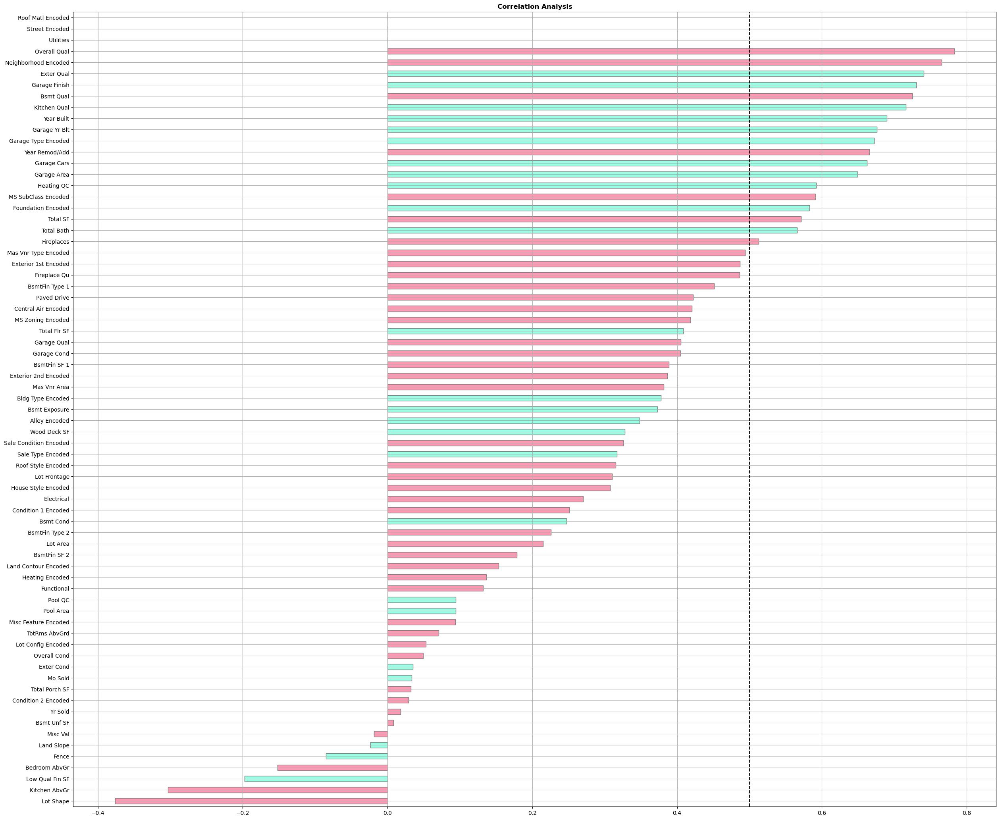

In [400]:
mask27 = pd.concat([raw3, raw2[nominal_rank]], axis=1)

mask27 = mask27.loc[intersec5, :]      

corr8 = mask27[int_col2 + float_col2 + ordinal_col2 + nominal_rank].corr()

corr8 = corr8.loc["SalePrice", :]

corr8.drop(index="SalePrice", inplace=True)

corr8.sort_values(inplace=True)

fig, ax = plt.subplots(figsize=(30,26))

corr5.plot(ax=ax, kind="barh", figsize=(30,26), color=["#ff99b3" if col in nominal_rank or col in ordinal_col else "#99ffe5" for col in corr8.index], edgecolor="gray")

ax.axvline(x=0.5, color="#190f11", linestyle="--")

plt.grid()

plt.title("Correlation Analysis", fontsize=12, fontweight="bold")

plt.show()

In [401]:
nan5 = corr8[corr8.isna() == True].index

print(f"Count of unique values:\n")

mask27[nan5].nunique()

Count of unique values:



Kitchen AbvGr          1
Pool Area              1
Utilities              1
Pool QC                1
Street Encoded         1
Condition 2 Encoded    1
Roof Matl Encoded      1
dtype: int64

<br>

#### **Large Residuals and Good Sale Price Average**

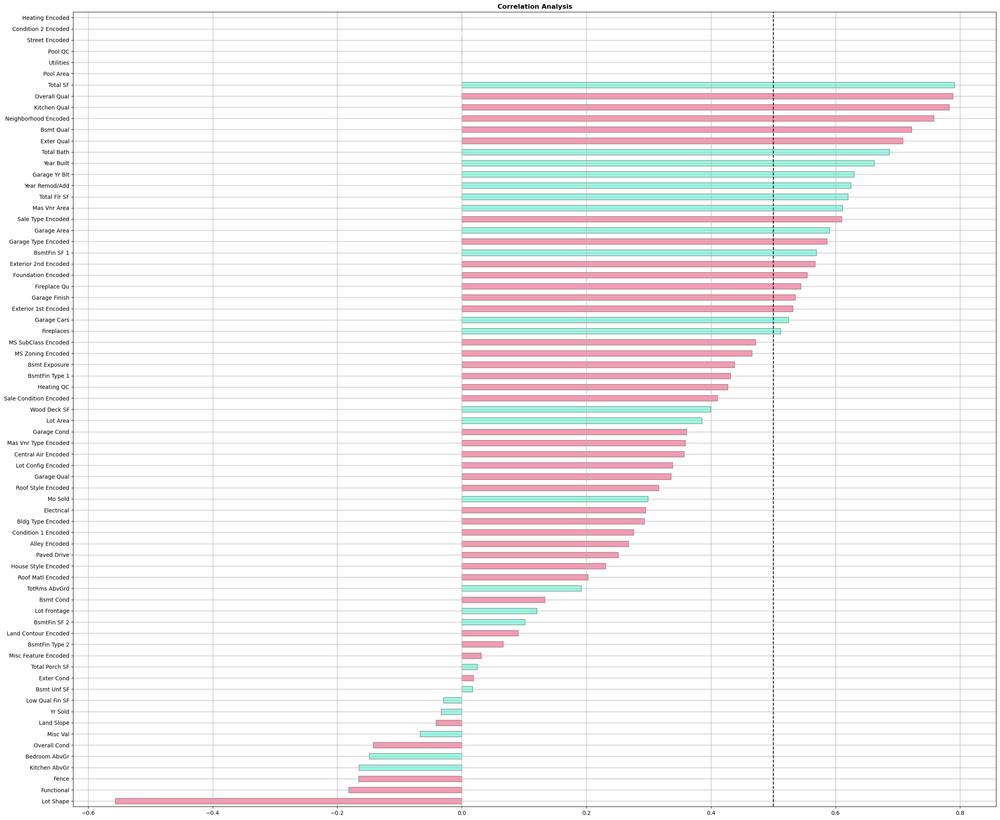

In [402]:
mask28 = pd.concat([raw3, raw2[nominal_rank]], axis=1)

mask28 = mask28.loc[intersec6, :]      

corr9 = mask28[int_col2 + float_col2 + ordinal_col2 + nominal_rank].corr()

corr9 = corr9.loc["SalePrice", :]

corr9.drop(index="SalePrice", inplace=True)

corr9.sort_values(inplace=True)

fig, ax = plt.subplots(figsize=(30,26))

corr9.plot(ax=ax, kind="barh", figsize=(30,26), color=["#ff99b3" if col in nominal_rank or col in ordinal_col else "#99ffe5" for col in corr9.index], edgecolor="gray")

ax.axvline(x=0.5, color="#190f11", linestyle="--")

plt.grid()

plt.title("Correlation Analysis", fontsize=12, fontweight="bold")

plt.show()

In [403]:
nan6 = corr9[corr9.isna() == True].index

print(f"Count of unique values:\n")

mask28[nan6].nunique()

Count of unique values:



Pool Area              1
Utilities              1
Pool QC                1
Street Encoded         1
Condition 2 Encoded    1
Heating Encoded        1
dtype: int64

<br> The variables that store feature names with a correlation of 0 will be converted to lists and assigned to the variable nan_col. The function remove_duplicates is defined to retain the first occurance of a feature name.

In [404]:
nan = list(nan)
nan2 = list(nan2)
nan3 = list(nan3)
nan4 = list(nan4)
nan5 = list(nan5)
nan6 = list(nan6)

nan_col = nan + nan2 + nan3 + nan4 + nan5 + nan6

def remove_duplicates(listofElements):
    uniqueList = []
    for elem in listofElements:
        if elem not in uniqueList:
            uniqueList.append(elem)

    return uniqueList


print(f"The below columns will be deleted from the training and validation sets:\n")

remove_duplicates(nan_col)

The below columns will be deleted from the training and validation sets:



['Misc Val',
 'Pool Area',
 'Utilities',
 'Pool QC',
 'Street Encoded',
 'Condition 2 Encoded',
 'Misc Feature Encoded',
 'Roof Matl Encoded',
 'Kitchen AbvGr',
 'Low Qual Fin SF',
 'Heating Encoded']

In [405]:
remove = [col for col in X_train.columns if col.startswith("Utilities")]

remove2 = [col for col in X_train.columns if col.startswith("Street")]

remove3 = [col for col in X_train.columns if col.startswith("Heating")]

remove4 = [col for col in X_train.columns if col.startswith("Kitchen AbvGr")]

remove5 = [col for col in X_train.columns if col.startswith("Pool Area")]

remove6 = [col for col in X_train.columns if col.startswith("Pool QC")]

remove7 = [col for col in X_train.columns if col.startswith("Condition 2")]

remove8 = [col for col in X_train.columns if col.startswith("Roof Matl")]

remove9 = [col for col in X_train.columns if col.startswith("Misc")]

In [406]:
nan_col2 = remove + remove2 + remove3 + remove4 + remove5 + remove6 + remove7 + remove8 + remove9

<br> The variable nan_col3 is a list of column names that do not include the above features.

In [407]:
nan_col3 = [col for col in X_train.columns if col not in nan_col2]

print(f"{X.shape[1] - len(nan_col3)} features are selected.")

33 features are selected.


<br> The training and validation sets are rescaled without the feature names stored in nan_col3.

In [408]:
ridge_tr_rescaled3 = scaler.fit_transform(X_train[nan_col3])

ridge_val_rescaled3 = scaler.transform(X_val[nan_col3])

<br>As the ridge regression and complex huber regression models performed best, additional data modelling will focus on the two models.

<br> **Ridge Regression 2**

In [409]:
gs_results4 = []

for alpha in np.logspace(-1, 4, num=20):
    ridge3 = Ridge(alpha=alpha)
    ridge3.fit(ridge_tr_rescaled3, y_train)
    
    gs_results4.append(
        {
            "model": ridge,
            "alpha": alpha,
            "train mse": MSE(y_train, ridge3.predict(ridge_tr_rescaled3)),
            "train mae": MAE(np.expm1(y_train), np.expm1(ridge3.predict(ridge_tr_rescaled3))),
            "validation mse": MSE(y_val, ridge3.predict(ridge_val_rescaled3)),
            "validation mae": MAE(np.expm1(y_val), np.expm1(ridge3.predict(ridge_val_rescaled3))),
        }
    )

gs_results4 = pd.DataFrame(gs_results4)

gs_results4 = gs_results4.sort_values(by="validation mae").reset_index(drop=True)

gs_results4.head()

,model,alpha,train mse,train mae,validation mse,validation mae
0,Ridge(alpha=10000.0),42.813324,0.010674,12214.633071,0.011614,13206.420669
1,Ridge(alpha=10000.0),78.475997,0.010823,12285.808556,0.011593,13210.192418
2,Ridge(alpha=10000.0),23.357215,0.010595,12178.104993,0.011661,13231.319916
3,Ridge(alpha=10000.0),12.742750,0.010555,12160.878672,0.011710,13258.932651
4,Ridge(alpha=10000.0),143.844989,0.011103,12435.074042,0.011641,13276.390244


In [410]:
print(f"Best alpha (ridge regression with {X_train.shape[1]} features and {X_train.shape[0]} observations):", hyperparam_ridge)

print(f"\nBest alpha (ridge regression with {X_train[nan_col3].shape[1]} features and {X_train[nan_col3].shape[0]} observations):", gs_results4.loc[0, "alpha"])

Best alpha (ridge regression with 240 features and 1693 observations): 263.6650898730358

Best alpha (ridge regression with 207 features and 1693 observations): 42.81332398719391


In [411]:
hyperparam_ridge2 = gs_results4.loc[0, "alpha"]

In [412]:
ridge_tr_rescaled4 = scaler.fit_transform(X_train[nan_col3])

ridge_val_rescaled4 = scaler.transform(X_val[nan_col3])

In [413]:
ridge4 = Ridge(alpha=hyperparam_ridge2)

ridge4.fit(ridge_tr_rescaled4, y_train)

Ridge(alpha=42.81332398719391)

In [414]:
print(f"MSE train set (complex_model): {round(MSE(y_train, ridge4.predict(ridge_tr_rescaled4)), 4)}\n")

print(f"MAE train set (complex model): ${round(MAE(np.expm1(y_train), np.expm1(ridge4.predict(ridge_tr_rescaled4))), 2):,.2f}\n")

MSE train set (complex_model): 0.0107

MAE train set (complex model): $12,214.63



In [415]:
y_pred_ridge2 = ridge4.predict(ridge_val_rescaled4)

mae_ridge2 = round(MAE(np.expm1(y_val), np.expm1(y_pred_ridge2)), 2)

print(f"MSE validation set (complex model): {round(MSE(y_val, y_pred_ridge2), 4)}\n")

print(f"MAE validation set (complex model): ${mae_ridge2:,.2f}\n")

MSE validation set (complex model): 0.0116

MAE validation set (complex model): $13,206.42



In [416]:
r2_ridge2 = r2_score(y_val, y_pred_ridge2)

print(f"R2 validation set: {r2_ridge2:,.4f}")

R2 validation set: 0.9052


In [417]:
adjusted_r2_ridge2 = 1 - (1 - r2_ridge2) * (len(y_val) - 1) / (len(y_val) - ridge_val_rescaled4.shape[1] - 1)

print(f"\nAdjusted R2 validation set (ridge regression with {X_train.shape[1]} features and {X_train.shape[0]} observations): {adjusted_r2_ridge:,.6f}")

print(f"\nAdjusted R2 validation set (ridge regression with {X_train[nan_col3].shape[1]} features and {X_train[nan_col3].shape[0]} observations): {adjusted_r2_ridge2:,.6f}")

print(f"\nMAE difference: ${mae_ridge - mae_ridge2:,.2f}")


Adjusted R2 validation set (ridge regression with 240 features and 1693 observations): 0.855562

Adjusted R2 validation set (ridge regression with 207 features and 1693 observations): 0.867368

MAE difference: $269.58


<br>The second ridge regression model explains the validation set's variability better than the first ridge regression model.

The ridge regression model without the 33 features selected 204 colums and excluded 3 features.



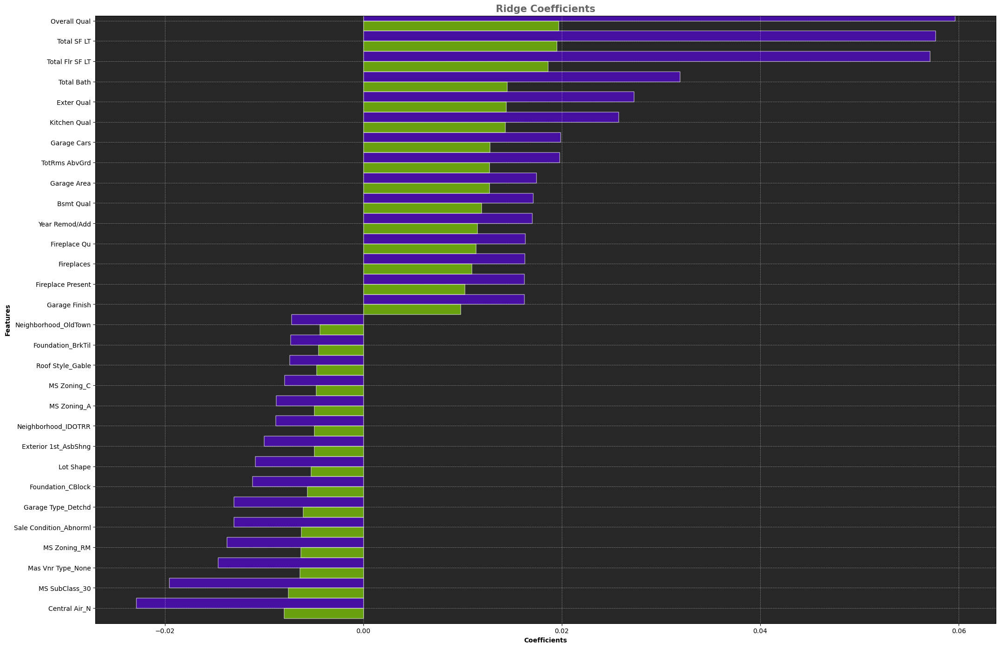

In [418]:
coefs3_ridge = pd.Series(ridge3.coef_, index = X_train[nan_col3].columns)

print(f"The ridge regression model without the {X_train.shape[1] - len(nan_col3)} features selected {str(sum(coefs3_ridge != 0))} colums and excluded {str(sum(coefs3_ridge == 0))} features.\n")

coefs4_ridge = pd.concat([coefs3_ridge.sort_values().head(15),
                     coefs3_ridge.sort_values().tail(15)])

fig, ax = plt.subplots(figsize=(25, 17))

coefs2_ridge.plot(ax=ax, kind="barh", color="#5e00f3", edgecolor="white", alpha=0.6, position=0)

coefs4_ridge.plot(ax=ax, kind="barh", color="#95f300", edgecolor="white", alpha=0.6, position=1)

ax.set_facecolor("#272727")
ax.set_title("Ridge Coefficients", fontweight="bold", fontsize=15, alpha=0.6)
ax.set_xlabel("Coefficients", fontweight="bold")
ax.set_ylabel("Features", fontweight="bold")

ax.grid(True, which='both', linestyle='--', linewidth=0.5, color='white', alpha=0.5)

plt.show()

The coefficients from the first ridge regression model are demonstrably stronger than those of the second ridge regression model. Moreover, the first ridge regression model has a noticeably better mean absoute error.

<br> **Huber Regression - Complex Model 2**

In [419]:
complex_tr_rescaled_huber2 = scaler.fit_transform(X_train[nan_col3])

complex_val_rescaled_huber2 = scaler.transform(X_val[nan_col3])

In [420]:
huber4 = HuberRegressor(epsilon=1.35, max_iter=500000)

huber4.fit(complex_tr_rescaled_huber2, y_train)

HuberRegressor(max_iter=500000)

In [421]:
print(f"MSE train set (complex_model): {round(MSE(y_train, huber4.predict(complex_tr_rescaled_huber2)), 4)}\n")

print(f"MAE train set (complex model): ${round(MAE(np.expm1(y_train), np.expm1(huber4.predict(complex_tr_rescaled_huber2))), 2):,.2f}\n")

MSE train set (complex_model): 0.0115

MAE train set (complex model): $11,594.83



In [422]:
y_pred_huber_complex2 = huber4.predict(complex_val_rescaled_huber2)

mae_huber_complex2 = round(MAE(np.expm1(y_val), np.expm1(y_pred_huber_complex2)), 2)

In [423]:
print(f"MSE validation set (complex model): {round(MSE(y_val, y_pred_huber_complex2), 4)}\n")

print(f"MAE validation set (complex model): ${mae_huber_complex2:,.2f}\n")

MSE validation set (complex model): 0.0113

MAE validation set (complex model): $12,936.48



In [424]:
r2_huber_complex2 = r2_score(y_val, y_pred_huber_complex2)

print(f"R2 validation set (complex model): {r2_huber_complex2:,.4f}")

R2 validation set (complex model): 0.9079


In [425]:
adjusted_r2_huber_complex2 = 1 - (1 - r2_huber_complex2) * (len(y_val) - 1) / (len(y_val) - complex_val_rescaled_huber2.shape[1] - 1)

print(f"\nAdjusted R2 validation set (huber complex model with {X_train.shape[1]} features and {X_train.shape[0]} observations): {adjusted_r2_huber_complex:,.6f}")

print(f"\nAdjusted R2 validation set (huber complex model with {X_train[nan_col3].shape[1]} features and {X_train[nan_col3].shape[0]} observations): {adjusted_r2_huber_complex2:,.6f}\n")

print(f"\nMAE difference: ${mae_huber_complex - mae_huber_complex2:,.2f}")


Adjusted R2 validation set (huber complex model with 240 features and 1693 observations): 0.864634

Adjusted R2 validation set (huber complex model with 207 features and 1693 observations): 0.871082


MAE difference: $-180.06


<br> Similar to the ridge regression models, the second complex huber model explains the validation set's variability slightly better than the first complex huber model, however the first complex huber regression model has a better mean absolute error. 

<br> 

### **Outliers**

As an additional effort to fit an optimised regression model, the 179 observations that are outliers will be removed from the training and valdiation sets.

In [426]:
X_train2 = X_train.copy()

y_train2 = y_train.copy()

X_val2 = X_val.copy()

y_val2 = y_val.copy()

In [427]:
outliers_X_train = zfilter_index.intersection(X_train2.index)

outliers_y_train = zfilter_index.intersection(y_train2.index)

X_train2.drop(outliers_X_train, inplace=True)

y_train2.drop(outliers_y_train, inplace=True)

In [428]:
outliers_X_val2 = zfilter_index.intersection(X_val2.index)

outliers_y_val2 = zfilter_index.intersection(y_val2.index)

X_val2.drop(outliers_X_val2, inplace=True)

y_val2.drop(outliers_y_val2, inplace=True)

In [429]:
print(f"Train set: {X_train2.shape}, {y_train.shape}")

print(f"\nValidation set: {X_val2.shape}, {y_val.shape}")

Train set: (1565, 240), (1693,)

Validation set: (675, 240), (726,)


<br> **Ridge Regression 3**

In [430]:
ridge_tr_rescaled5 = scaler.fit_transform(X_train2)

ridge_val_rescaled5 = scaler.transform(X_val2)

In [431]:
gs_results5 = []

for alpha in np.logspace(-1, 4, num=20):
    ridge5 = Ridge(alpha=alpha)
    ridge5.fit(ridge_tr_rescaled5, y_train2)
    
    gs_results5.append(
        {
            "model": ridge,
            "alpha": alpha,
            "train mse": MSE(y_train2, ridge5.predict(ridge_tr_rescaled5)),
            "train mae": MAE(np.expm1(y_train2), np.expm1(ridge5.predict(ridge_tr_rescaled5))),
            "validation mse": MSE(y_val2, ridge5.predict(ridge_val_rescaled5)),
            "validation mae": MAE(np.expm1(y_val2), np.expm1(ridge5.predict(ridge_val_rescaled5))),
        }
    )

gs_results5 = pd.DataFrame(gs_results5)

gs_results5 = gs_results5.sort_values(by="validation mae").reset_index(drop=True)

gs_results5.head()

,model,alpha,train mse,train mae,validation mse,validation mae
0,Ridge(alpha=10000.0),12.742750,0.008214,11399.819926,0.011370,12607.561260
1,Ridge(alpha=10000.0),23.357215,0.008265,11462.195373,0.011318,12611.009664
2,Ridge(alpha=10000.0),6.951928,0.008188,11361.390438,0.011436,12620.706641
3,Ridge(alpha=10000.0),42.813324,0.008360,11557.742735,0.011287,12623.498793
4,Ridge(alpha=10000.0),3.792690,0.008177,11336.886107,0.011507,12660.313444


In [432]:
print(f"\nBest alpha (ridge regression with {X_train.shape[1]} features and {X_train.shape[0]} observations):", hyperparam_ridge)

print(f"\nBest alpha (ridge regression with {X_train[nan_col3].shape[1]} features and {X_train.shape[0]} observations):", hyperparam_ridge2)

print(f"\nBest alpha (ridge regression with {X_train2.shape[1]} features and {X_train2.shape[0]} observations):", gs_results4.loc[0, "alpha"])


Best alpha (ridge regression with 240 features and 1693 observations): 263.6650898730358

Best alpha (ridge regression with 207 features and 1693 observations): 42.81332398719391

Best alpha (ridge regression with 240 features and 1565 observations): 42.81332398719391


<br> The best alpha value is similar to the hyperparameter with 207 features and 1693 samples.

In [433]:
ridge_tr_rescaled6 = scaler.fit_transform(X_train2)

ridge_val_rescaled6 = scaler.transform(X_val2)

ridge6 = Ridge(alpha=hyperparam_ridge2)

ridge6.fit(ridge_tr_rescaled6, y_train2)

Ridge(alpha=42.81332398719391)

In [434]:
print(f"MSE train set (complex_model): {round(MSE(y_train2, ridge6.predict(ridge_tr_rescaled6)), 4)}\n")

print(f"MAE train set (complex model): ${round(MAE(np.expm1(y_train2), np.expm1(ridge6.predict(ridge_tr_rescaled6))), 2):,.2f}\n")

MSE train set (complex_model): 0.0084

MAE train set (complex model): $11,557.74



In [435]:
y_pred_ridge3 = ridge6.predict(ridge_val_rescaled6)

mae_ridge3 = round(MAE(np.expm1(y_val2), np.expm1(y_pred_ridge3)), 2)

print(f"MSE validation set (complex model): {round(MSE(y_val2, y_pred_ridge3), 4)}\n")

print(f"MAE validation set (complex model): ${mae_ridge3:,.2f}\n")

MSE validation set (complex model): 0.0113

MAE validation set (complex model): $12,623.50



In [436]:
r2_ridge3 = r2_score(y_val2, y_pred_ridge3)

print(f"R2 validation set (complex model): {r2_ridge3:.4f}")

R2 validation set (complex model): 0.9083


In [437]:
adjusted_r2_ridge3 = 1 - (1 - r2_ridge3) * (len(y_val2) - 1) / (len(y_val2) - ridge_val_rescaled6.shape[1] - 1)

print(f"\nAdjusted R2 validation set (ridge regression with {X_train.shape[1]} features and {X_train.shape[0]} observations): {adjusted_r2_ridge:,.6f}")

print(f"\nAdjusted R2 validation set (ridge regression with {X_train[nan_col3].shape[1]} features and {X_train[nan_col3].shape[0]} observations): {adjusted_r2_ridge2:,.6f}")

print(f"\nAdjusted R2 validation set (ridge regression with {X_train2.shape[1]} features and {X_train2.shape[0]} observations): {adjusted_r2_ridge3:,.6f}\n")

print(f"\nMAE difference (first and second ridge regression model): ${mae_ridge - mae_ridge3:,.2f}")

print(f"\nMAE difference (second and third ridge regression model): ${mae_ridge2 - mae_ridge3:,.2f}")


Adjusted R2 validation set (ridge regression with 240 features and 1693 observations): 0.855562

Adjusted R2 validation set (ridge regression with 207 features and 1693 observations): 0.867368

Adjusted R2 validation set (ridge regression with 240 features and 1565 observations): 0.857574


MAE difference (first and second ridge regression model): $852.50

MAE difference (second and third ridge regression model): $582.92


<br> The third ridge regression has a lower mean absolute error. 

The ridge regression model without 128 observations selected 229 features and excluded 11 features. The second ridge regression model better addresses variability between the predictors and sale price.



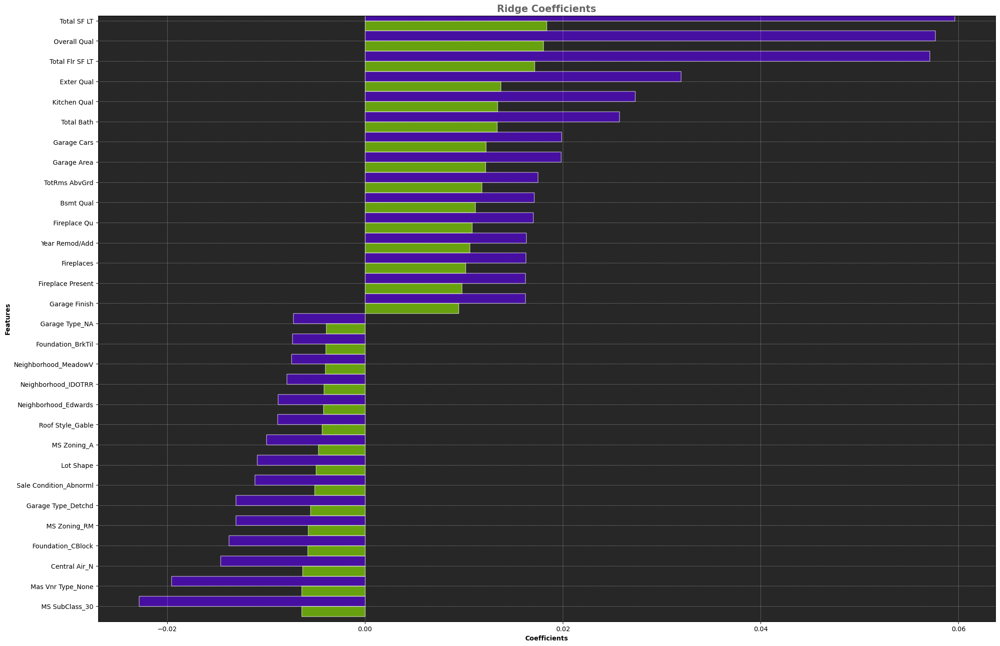

In [438]:
coefs5_ridge = pd.Series(ridge5.coef_, index = X_train.columns)

print(f"The ridge regression model without {X_train.shape[0] - X_train2.shape[0]} observations selected {str(sum(coefs5_ridge != 0))} features and excluded {str(sum(coefs5_ridge == 0))} features.\
 The second ridge regression model better addresses variability between the predictors and sale price.\n")

coefs6_ridge = pd.concat([coefs5_ridge.sort_values().head(15),
                     coefs5_ridge.sort_values().tail(15)])

fig, ax = plt.subplots(figsize=(25, 17))

coefs2_ridge.plot(ax=ax, kind="barh", color="#5e00f3", edgecolor="white", alpha=0.6, position=0)

coefs6_ridge.plot(ax=ax, kind="barh", color="#95f300", edgecolor="white", alpha=0.6, position=1)

ax.set_facecolor("#272727")
ax.set_title("Ridge Coefficients", fontweight="bold", fontsize=15, alpha=0.6)
ax.set_xlabel("Coefficients", fontweight="bold")
ax.set_ylabel("Features", fontweight="bold")

ax.grid(True, which='both', linestyle='--', linewidth=0.5, color='white', alpha=0.5)

plt.show()

**Huber Regression - Complex Model 3**

In [439]:
complex_tr_rescaled_huber3 = scaler.fit_transform(X_train2)

complex_val_rescaled_huber3 = scaler.fit_transform(X_val2)

huber5 = HuberRegressor(epsilon=1.35, max_iter=500000)

huber5.fit(complex_tr_rescaled_huber3, y_train2)

HuberRegressor(max_iter=500000)

In [440]:
print(f"MSE train set (complex_model): {round(MSE(y_train2, huber5.predict(complex_tr_rescaled_huber3)), 4)}\n")

print(f"MAE train set (complex model): ${round(MAE(np.expm1(y_train2), np.expm1(huber5.predict(complex_tr_rescaled_huber3))), 2):,.2f}\n")

MSE train set (complex_model): 0.0086

MAE train set (complex model): $10,975.68



In [441]:
y_pred_huber_complex3 = huber5.predict(complex_val_rescaled_huber3)

mae_huber_complex3 = round(MAE(np.expm1(y_val2), np.expm1(y_pred_huber_complex3)), 2)

In [442]:
print(f"MSE validation set (complex model): {round(MSE(y_val2, y_pred_huber_complex3), 4)}\n")

print(f"MAE validation set (complex model): ${mae_huber_complex3:,.2f}\n")

MSE validation set (complex model): 0.0129

MAE validation set (complex model): $13,870.26



In [443]:
r2_huber_complex3 = r2_score(y_val2, y_pred_huber_complex3)

print(f"R2 validation set (complex model): {r2_huber_complex3:,.4f}")

R2 validation set (complex model): 0.8954


In [444]:
adjusted_r2_huber_complex3 = 1 - (1 - r2_huber_complex3) * (len(y_val2) - 1) / (len(y_val2) - X_train.shape[1] - 1)

print(f"\nAdjusted R2 validation set (huber complex model with {X_train.shape[1]} features and {X_train.shape[0]} observations): {adjusted_r2_huber_complex:,.6f}")

print(f"\nAdjusted R2 validation set (huber complex model with {X_train[nan_col3].shape[1]} features {X_train[nan_col3].shape[0]} observations): {adjusted_r2_huber_complex2:,.6f}\n")

print(f"Adjusted R2 validation set (huber complex model with {X_train2.shape[1]} features and {X_train2.shape[0]} observations): {adjusted_r2_huber_complex3:,.6f}\n")

print(f"\nMAE difference: ${mae_huber_complex - mae_huber_complex3:,.2f}")


Adjusted R2 validation set (huber complex model with 240 features and 1693 observations): 0.864634

Adjusted R2 validation set (huber complex model with 207 features 1693 observations): 0.871082

Adjusted R2 validation set (huber complex model with 240 features and 1565 observations): 0.837514


MAE difference: $-1,113.84


<br> The third huber regression model's mean absolute error increases by approximately \\$1,100 in comparison to the third ridge regession model which reduces by almost \\$1000. Similarly, across both types of statistical models, the second model has a stronger ability to explain variance. 

<br> As a final attempt to fit an optimised regression model, amendments to the train and validation sets will combine the above changes which are feature and outlier exclusion.

In [445]:
ridge_tr_rescaled7 = scaler.fit_transform(X_train2[nan_col3])

ridge_val_rescaled7 = scaler.transform(X_val2[nan_col3])

<br> **Regression Model 4**

In [446]:
gs_results6 = []

for alpha in np.logspace(-1, 4, num=20):
    ridge7 = Ridge(alpha=alpha)
    ridge7.fit(ridge_tr_rescaled7, y_train2)
    
    gs_results6.append(
        {
            "model": ridge,
            "alpha": alpha,
            "train mse": MSE(y_train2, ridge7.predict(ridge_tr_rescaled7)),
            "train mae": MAE(np.expm1(y_train2), np.expm1(ridge7.predict(ridge_tr_rescaled7))),
            "validation mse": MSE(y_val2, ridge7.predict(ridge_val_rescaled7)),
            "validation mae": MAE(np.expm1(y_val2), np.expm1(ridge7.predict(ridge_val_rescaled7))),
        }
    )

gs_results6 = pd.DataFrame(gs_results6)

gs_results6 = gs_results6.sort_values(by="validation mae").reset_index(drop=True)

gs_results6.head()

,model,alpha,train mse,train mae,validation mse,validation mae
0,Ridge(alpha=10000.0),23.357215,0.008547,11676.853591,0.011024,12566.185892
1,Ridge(alpha=10000.0),12.742750,0.008504,11631.019150,0.011053,12572.043395
2,Ridge(alpha=10000.0),42.813324,0.008633,11755.581519,0.011017,12575.284163
3,Ridge(alpha=10000.0),6.951928,0.008484,11603.218856,0.011086,12582.081270
4,Ridge(alpha=10000.0),3.792690,0.008476,11588.834450,0.011113,12593.959275


In [447]:
print(f"\nBest alpha (ridge regression with {X_train2[nan_col3].shape[1]} features and {X_train2.shape[0]} observations):", gs_results6.loc[0, "alpha"])


Best alpha (ridge regression with 207 features and 1565 observations): 23.357214690901213


In [448]:
hyperparam_ridge3 = gs_results6.loc[0, "alpha"]

ridge_tr_rescaled8 = scaler.fit_transform(X_train2[nan_col3])

ridge_val_rescaled8 = scaler.transform(X_val2[nan_col3])

ridge8 = Ridge(alpha=hyperparam_ridge3)

ridge8.fit(ridge_tr_rescaled8, y_train2)

Ridge(alpha=23.357214690901213)

In [449]:
print(f"MSE train set (complex_model): {round(MSE(y_train2, ridge8.predict(ridge_tr_rescaled8)), 4)}\n")

print(f"MAE train set (complex model): ${round(MAE(np.expm1(y_train2), np.expm1(ridge8.predict(ridge_tr_rescaled8))), 2):,.2f}\n")

MSE train set (complex_model): 0.0085

MAE train set (complex model): $11,676.85



In [450]:
y_pred_ridge4 = ridge8.predict(ridge_val_rescaled8)

mae_ridge4 = round(MAE(np.expm1(y_val2), np.expm1(y_pred_ridge4)), 2)

print(f"MSE validation set (complex model): {round(MSE(y_val2, y_pred_ridge4), 4)}\n")

print(f"MAE validation set (complex model): ${mae_ridge4:,.2f}\n")

MSE validation set (complex model): 0.011

MAE validation set (complex model): $12,566.19



In [451]:
r2_ridge4 = r2_score(y_val2, y_pred_ridge4)

print(f"R2 validation set (complex model): {r2_ridge4:.4f}")

R2 validation set (complex model): 0.9104


In [452]:
adjusted_r2_ridge4 = 1 - (1 - r2_ridge4) * (len(y_val2) - 1) / (len(y_val2) - ridge_val_rescaled8.shape[1] - 1)

print(f"\nAdjusted R2 validation set (ridge regression with {X_train.shape[1]} features and {X_train.shape[0]} observations): {adjusted_r2_ridge:,.6f}")

print(f"\nAdjusted R2 validation set (ridge regression with {X_train[nan_col3].shape[1]} features and {X_train[nan_col3].shape[0]} observations): {adjusted_r2_ridge2:,.6f}")

print(f"\nAdjusted R2 validation set (ridge regression with {X_train2.shape[1]} features and {X_train2.shape[0]} observations): {adjusted_r2_ridge3:,.6f}")

print(f"\nAdjusted R2 validation set (ridge regression with {X_train2[nan_col3].shape[1]} features and {X_train2[nan_col3].shape[0]} observations): {adjusted_r2_ridge4:,.6f}")

print(f"\nMAE difference (first and fourth ridge regression models): ${mae_ridge - mae_ridge4:,.2f}")

print(f"\nMAE difference (second and fourth ridge regression models): ${mae_ridge2 - mae_ridge4:,.2f}")

print(f"\nMAE difference (third and fourth ridge regression models): ${mae_ridge3 - mae_ridge4:,.2f}")


Adjusted R2 validation set (ridge regression with 240 features and 1693 observations): 0.855562

Adjusted R2 validation set (ridge regression with 207 features and 1693 observations): 0.867368

Adjusted R2 validation set (ridge regression with 240 features and 1565 observations): 0.857574

Adjusted R2 validation set (ridge regression with 207 features and 1565 observations): 0.870718

MAE difference (first and fourth ridge regression models): $909.81

MAE difference (second and fourth ridge regression models): $640.23

MAE difference (third and fourth ridge regression models): $57.31


<br> The fourth ridge regression model's adjusted r2 score has increased a little as has the mean absolute error whcih has decreased. However, the third ridge regression model has the lowest MAE.

The ridge regression model without 128 observations and 207 columns selected 229 features and excluded 11 features.



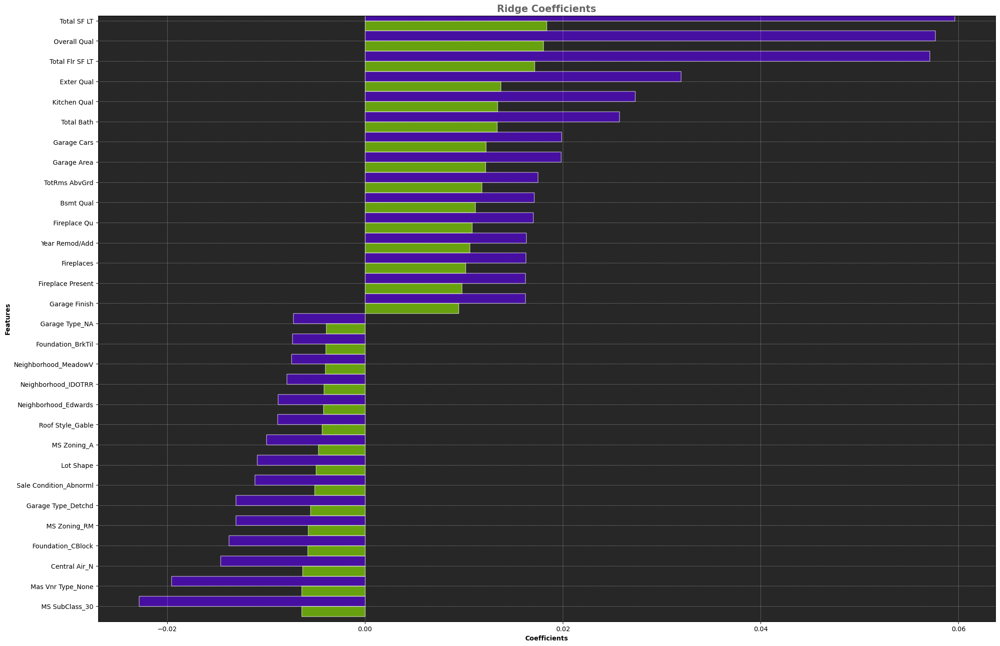

In [453]:
coefs5_ridge = pd.Series(ridge5.coef_, index = X_train.columns)

print(f"The ridge regression model without {X_train.shape[0] - X_train2.shape[0]} observations and {X_train2[nan_col3].shape[1]} columns\
 selected {str(sum(coefs5_ridge != 0))} features and excluded {str(sum(coefs5_ridge == 0))} features.\n")

coefs6_ridge = pd.concat([coefs5_ridge.sort_values().head(15),
                     coefs5_ridge.sort_values().tail(15)])

fig, ax = plt.subplots(figsize=(25, 17))

coefs2_ridge.plot(ax=ax, kind="barh", color="#5e00f3", edgecolor="white", alpha=0.6, position=0)

coefs6_ridge.plot(ax=ax, kind="barh", color="#95f300", edgecolor="white", alpha=0.6, position=1)

ax.set_facecolor("#272727")
ax.set_title("Ridge Coefficients", fontweight="bold", fontsize=15, alpha=0.6)
ax.set_xlabel("Coefficients", fontweight="bold")
ax.set_ylabel("Features", fontweight="bold")

ax.grid(True, which='both', linestyle='--', linewidth=0.5, color='white', alpha=0.5)

plt.show()

**Huber Regression - Complex Model 4**

In [454]:
complex_tr_rescaled_huber4 = scaler.fit_transform(X_train2[nan_col3])

complex_val_rescaled_huber4 = scaler.fit_transform(X_val2[nan_col3])

huber6 = HuberRegressor(epsilon=1.35, max_iter=500000)

huber6.fit(complex_tr_rescaled_huber4, y_train2)

HuberRegressor(max_iter=500000)

In [455]:
print(f"MSE train set (complex_model): {round(MSE(y_train2, huber6.predict(complex_tr_rescaled_huber4)), 4)}\n")

print(f"MAE train set (complex model): ${round(MAE(np.expm1(y_train2), np.expm1(huber6.predict(complex_tr_rescaled_huber4))), 2):,.2f}\n")

MSE train set (complex_model): 0.0089

MAE train set (complex model): $11,245.74



In [456]:
y_pred_huber_complex4 = huber6.predict(complex_val_rescaled_huber4)

mae_huber_complex4 = round(MAE(np.expm1(y_val2), np.expm1(y_pred_huber_complex4)), 2)

In [457]:
print(f"MSE validation set (complex model): {round(MSE(y_val2, y_pred_huber_complex4), 4)}\n")

print(f"MAE validation set (complex model): ${mae_huber_complex4:,.2f}\n")

MSE validation set (complex model): 0.0126

MAE validation set (complex model): $13,754.57



In [458]:
r2_huber_complex4 = r2_score(y_val2, y_pred_huber_complex4)

print(f"R2 validation set (complex model): {r2_huber_complex4:,.4f}")

R2 validation set (complex model): 0.8979


In [459]:
adjusted_r2_huber_complex4 = 1 - (1 - r2_huber_complex4) * (len(y_val2) - 1) / (len(y_val2) - X_train.shape[1] - 1)

print(f"\nAdjusted R2 validation set (huber complex model with {X_train.shape[1]} features and {X_train.shape[0]} observations): {adjusted_r2_huber_complex:,.6f}")

print(f"\nAdjusted R2 validation set (huber complex model with {X_train[nan_col3].shape[1]} features and {X_train.shape[0]} observations): {adjusted_r2_huber_complex2:,.6f}\n")

print(f"Adjusted R2 validation set (huber complex model with {X_train2.shape[1]} features and {X_train2.shape[0]} observations): {adjusted_r2_huber_complex3:,.6f}")

print(f"\nAdjusted R2 validation set (huber complex model with {X_train2[nan_col3].shape[1]} features and {X_train2[nan_col3].shape[0]} observations): {adjusted_r2_huber_complex4:,.6f}")

print(f"\nMAE difference (first and fourth huber regression models): ${mae_huber_complex - mae_huber_complex4:,.2f}")

print(f"\nMAE difference (second and fourth huber regression models): ${mae_huber_complex2 - mae_huber_complex4:,.2f}")

print(f"\nMAE difference (third and fourth huber regression models): ${mae_huber_complex3 - mae_huber_complex4:,.2f}")


Adjusted R2 validation set (huber complex model with 240 features and 1693 observations): 0.864634

Adjusted R2 validation set (huber complex model with 207 features and 1693 observations): 0.871082

Adjusted R2 validation set (huber complex model with 240 features and 1565 observations): 0.837514

Adjusted R2 validation set (huber complex model with 207 features and 1565 observations): 0.841371

MAE difference (first and fourth huber regression models): $-998.15

MAE difference (second and fourth huber regression models): $-818.09

MAE difference (third and fourth huber regression models): $115.69


<br> The fourth complex huber regression model has the highest mean absolute error and the least robust goodness of fit in comparison to the first three complex huber regression models. 

<br>**MAE and  Adjusted R2 Comparison**

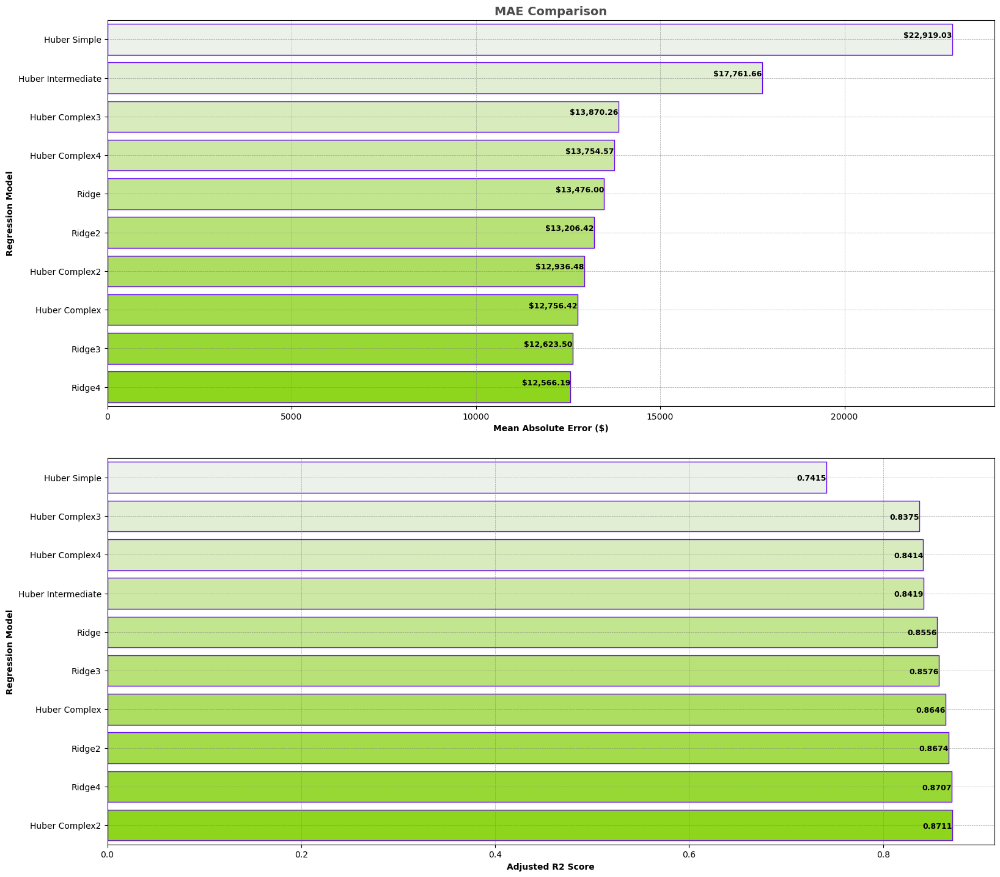

In [460]:
regression_model = [ 
    "Huber Simple", "Huber Intermediate", 
    "Huber Complex", "Huber Complex2", 
    "Huber Complex3", "Huber Complex4", 
    "Ridge", "Ridge2", "Ridge3", "Ridge4"
]

mae_values = [mae_huber_simp, mae_huber_inter, 
              mae_huber_complex,  mae_huber_complex2,  mae_huber_complex3, 
              mae_huber_complex4, mae_ridge,  mae_ridge2,  mae_ridge3, mae_ridge4]

adjusted_r2_values = [adjusted_r2_huber_simp, adjusted_r2_huber_inter, adjusted_r2_huber_complex,
                      adjusted_r2_huber_complex2, adjusted_r2_huber_complex3, adjusted_r2_huber_complex4,
                      adjusted_r2_ridge, adjusted_r2_ridge2,  adjusted_r2_ridge3, adjusted_r2_ridge4]

df_mae = pd.DataFrame({
    "Regression Model": regression_model,
    "MAE": mae_values
})

df_mae = df_mae.sort_values(by="MAE", ascending=False).reset_index(drop=True)


df_r2 =  pd.DataFrame({
    "Regression Model": regression_model,
    "R2": adjusted_r2_values
})

df_r2 = df_r2.sort_values(by="R2").reset_index(drop=True)


fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(17, 15))

sns.barplot(ax=ax[0], x="MAE", y="Regression Model", data=df_mae, hue="Regression Model", palette="light:#95f300", edgecolor="#5e00f3", legend=False)
sns.color_palette("Spectral", as_cmap=True)

for i, value in enumerate(df_mae["MAE"]):
    ax[0].text(value, i, f"${value:,.2f}", ha="right", va="bottom", color="black", fontsize=9, fontweight="bold")

ax[0].grid(True, which="both", linestyle="--", linewidth=0.5, color="gray", alpha=0.7)

ax[0].set_title("MAE Comparison", fontsize=14, fontweight="bold", alpha=0.7)
ax[0].set_xlabel("Mean Absolute Error ($)", fontweight="bold")
ax[0].set_ylabel("Regression Model", fontweight="bold")


sns.barplot(ax=ax[1], x="R2", y="Regression Model", data=df_r2, hue="Regression Model", palette="light:#95f300", edgecolor="#5e00f3", legend=False)

for i, value in enumerate(df_r2["R2"]):
    ax[1].text(value, i, f"{value:,.4f}", ha="right", va="center_baseline", color="black", fontsize=9, fontweight="bold")

ax[1].grid(True, which="both", linestyle="--", linewidth=0.5, color="gray", alpha=0.7)

ax[1].set_xlabel("Adjusted R2 Score", fontweight="bold")
ax[1].set_ylabel("Regression Model", fontweight="bold")


plt.tight_layout(pad=3)
plt.show()

The fourth ridge regression model with reduced features and observations has the lowest mean absolute errors and an adjusted r-squared score that explains 0.87% of the model's variance. 

<br> 

# **Post Modelling Analysis - Second, Third and Fourth Iterations**

<br>The true sale prices and predicted sale prices of the additional ridge and complex huber regression models are stored as dataframes and assigned to variables.  

<br>**Regression models with reduced features**

In [461]:
df_pred_2nd = pd.DataFrame({
    "y_true": y_val,
    "y_pred_huber_complex": y_pred_huber_complex2,
    "y_pred_ridge": y_pred_ridge2
})


df_pred_2nd = df_pred_2nd.apply(np.expm1)


y_true = df_pred_2nd["y_true"]
y_pred_huber = df_pred_2nd["y_pred_huber_complex"]
y_pred_ridge = df_pred_2nd["y_pred_ridge"]

<br>**Regression models with removed outleirs**

In [462]:
df_pred_3rd = pd.DataFrame({
    "y_true": y_val2,
    "y_pred_huber_complex": y_pred_huber_complex3,
    "y_pred_ridge": y_pred_ridge3
})


df_pred_3rd = df_pred_3rd.apply(np.expm1)


y_true = df_pred_3rd["y_true"]
y_pred_huber = df_pred_3rd["y_pred_huber_complex"]
y_pred_ridge = df_pred_3rd["y_pred_ridge"]

<br>**Regression models with reduced features and removed outliers**

In [463]:
df_pred_4th = pd.DataFrame({
    "y_true": y_val2,
    "y_pred_huber_complex": y_pred_huber_complex4,
    "y_pred_ridge": y_pred_ridge4
})


df_pred_4th = df_pred_4th.apply(np.expm1)


y_true = df_pred_4th["y_true"]
y_pred_huber = df_pred_4th["y_pred_huber_complex"]
y_pred_ridge = df_pred_4th["y_pred_ridge"]

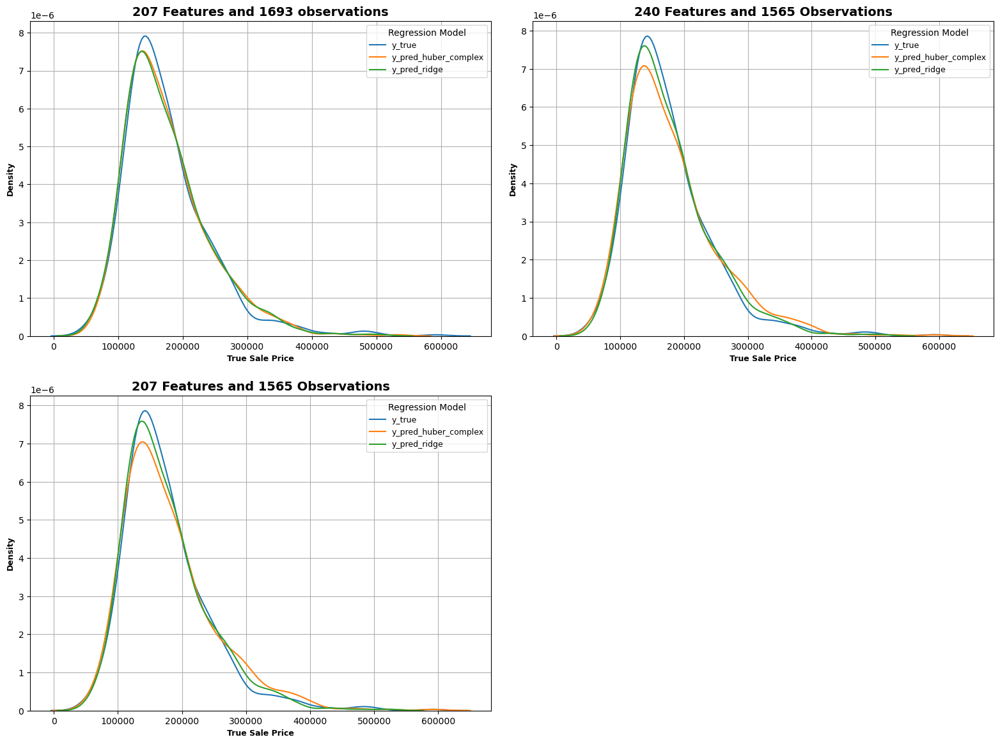

In [464]:
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(16, 12))

for c in df_pred_2nd.columns[df_pred_2nd.columns.str.startswith("y_")]:
    sns.kdeplot(df_pred_2nd[c].dropna(), label=c, ax=ax[0,0])

ax[0,0].set_title(f"{X_train[nan_col3].shape[1]} Features and {X_train.shape[0]} observations", fontsize=14, fontweight="bold")
ax[0,0].set_xlabel("True Sale Price", fontsize=9, fontweight="bold")
ax[0,0].set_ylabel("Density", fontsize=9, fontweight="bold")
ax[0,0].legend(loc="best", title="Regression Model", prop={"size": 9})
ax[0,0].grid(True)


for c in df_pred_3rd.columns[df_pred_3rd.columns.str.startswith("y_")]:
    sns.kdeplot(df_pred_3rd[c].dropna(), label=c, ax=ax[0,1])

ax[0,1].set_title(f"{X_train2.shape[1]} Features and {X_train2.shape[0]} Observations", fontsize=14, fontweight="bold")
ax[0,1].set_xlabel("True Sale Price", fontsize=9, fontweight="bold")
ax[0,1].set_ylabel("Density", fontsize=9, fontweight="bold")
ax[0,1].legend(loc="best", title="Regression Model", prop={"size": 9})
ax[0,1].grid(True)


for c in df_pred_4th.columns[df_pred_4th.columns.str.startswith("y_")]:
    sns.kdeplot(df_pred_4th[c].dropna(), label=c, ax=ax[1,0])

ax[1,0].set_title(f"{X_train2[nan_col3].shape[1]} Features and {X_train2.shape[0]} Observations", fontsize=14, fontweight="bold")
ax[1,0].set_xlabel("True Sale Price", fontsize=9, fontweight="bold")
ax[1,0].set_ylabel("Density", fontsize=9, fontweight="bold")
ax[1,0].legend(loc="best", title="Regression Model", prop={"size": 9})
ax[1,0].grid(True)

fig.delaxes(ax[1, 1])

plt.tight_layout(pad=2)
plt.show()

Both models across the three iterations roughly overestimate and underestimate the same predictions.

The purple observations are predictions from the ridge regression model and the green observations are representative of the complex huber regression model.



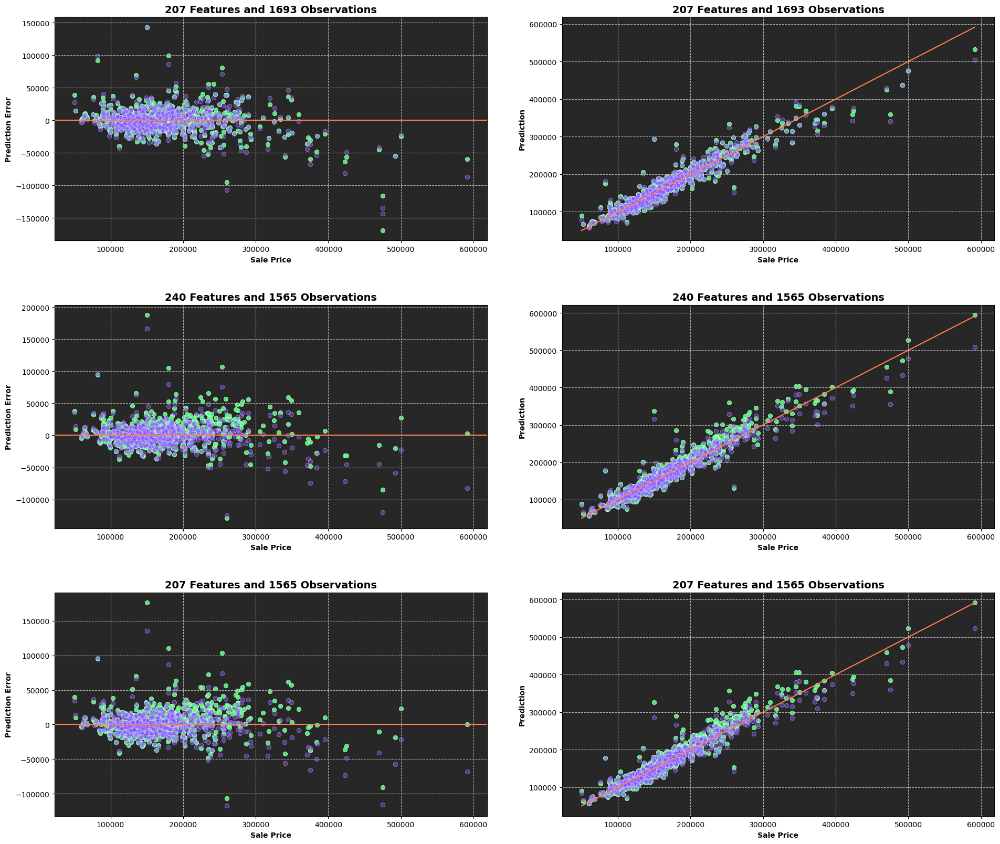

In [465]:
print(f"The purple observations are predictions from the ridge regression model and the green observations are representative of the complex huber regression model.\n")


fig, axs = plt.subplots(3, 2, figsize=(20, 17))

errors_2nd_h = df_pred_2nd.y_pred_huber_complex - df_pred_2nd.y_true
errors_2nd_r = df_pred_2nd.y_pred_ridge - df_pred_2nd.y_true

sns.scatterplot(x=df_pred_2nd.y_true, y=errors_2nd_h, ax=axs[0,0], color="#50ff7f", alpha=0.9)
sns.scatterplot(x=df_pred_2nd.y_true, y=errors_2nd_r, ax=axs[0,0], color="#7f50ff", alpha=0.5)

axs[0,0].axhline(0, color="#ff7f50", linestyle="-")
axs[0,0].set_title(f"{X_train[nan_col3].shape[1]} Features and {X_train.shape[0]} Observations", fontsize=14, fontweight="bold")
axs[0,0].set_xlabel("Sale Price", fontweight="bold")
axs[0,0].set_ylabel("Prediction Error", fontweight="bold")
axs[0,0].set_facecolor("#272727")
axs[0,0].grid(True, linestyle="--")


sns.scatterplot(x=y_true, y=df_pred_2nd.y_pred_huber_complex, ax=axs[0,1], color="#50ff7f", alpha=0.9)
sns.scatterplot(x=y_true, y=df_pred_2nd.y_pred_ridge, ax=axs[0,1], color="#7f50ff", alpha=0.5)

line_x = np.arange(df_pred_2nd.y_true.min(), df_pred_2nd.y_true.max(), 100)

axs[0,1].plot(line_x, line_x, c="#ff7f50")
axs[0,1].set_title(f"{X_train[nan_col3].shape[1]} Features and {X_train.shape[0]} Observations", fontsize=14, fontweight="bold")
axs[0,1].set_xlabel("Sale Price", fontweight="bold")
axs[0,1].set_ylabel("Prediction", fontweight="bold")
axs[0,1].set_facecolor("#272727")
axs[0,1].grid(True, linestyle="--")


errors_3rd_h = df_pred_3rd.y_pred_huber_complex - df_pred_3rd.y_true
errors_3rd_r = df_pred_3rd.y_pred_ridge - df_pred_3rd.y_true

sns.scatterplot(x=df_pred_2nd.y_true, y=errors_3rd_h, ax=axs[1,0], color="#50ff7f", alpha=0.9)
sns.scatterplot(x=df_pred_3rd.y_true, y=errors_3rd_r, ax=axs[1,0], color="#7f50ff", alpha=0.5)

axs[1,0].axhline(0, color="#ff7f50", linestyle="-")
axs[1,0].set_title(f"{X_train2.shape[1]} Features and {X_train2.shape[0]} Observations", fontsize=14, fontweight="bold")
axs[1,0].set_xlabel("Sale Price", fontweight="bold")
axs[1,0].set_ylabel("Prediction Error", fontweight="bold")
axs[1,0].set_facecolor("#272727")
axs[1,0].grid(True, linestyle="--")


sns.scatterplot(x=y_true, y=df_pred_3rd.y_pred_huber_complex, ax=axs[1,1], color="#50ff7f", alpha=0.9)
sns.scatterplot(x=y_true, y=df_pred_3rd.y_pred_ridge, ax=axs[1,1], color="#7f50ff", alpha=0.5)


line_x = np.arange(df_pred_3rd.y_true.min(), df_pred_3rd.y_true.max(), 100)

axs[1,1].plot(line_x, line_x, c="#ff7f50")
axs[1,1].set_title(f"{X_train2.shape[1]} Features and {X_train2.shape[0]} Observations", fontsize=14, fontweight="bold")
axs[1,1].set_xlabel("Sale Price", fontweight="bold")
axs[1,1].set_ylabel("Prediction", fontweight="bold")
axs[1,1].set_facecolor("#272727")
axs[1,1].grid(True, linestyle="--")


errors_4th_h = df_pred_4th.y_pred_huber_complex - df_pred_4th.y_true
errors_4th_r = df_pred_4th.y_pred_ridge - df_pred_4th.y_true

sns.scatterplot(x=df_pred_4th.y_true, y=errors_4th_h, ax=axs[2,0], color="#50ff7f", alpha=0.9)
sns.scatterplot(x=df_pred_4th.y_true, y=errors_4th_r, ax=axs[2,0], color="#7f50ff", alpha=0.5)

axs[2,0].axhline(0, color="#ff7f50", linestyle="-")
axs[2,0].set_title(f"{X_train2[nan_col3].shape[1]} Features and {X_train2.shape[0]} Observations", fontsize=14, fontweight="bold")
axs[2,0].set_xlabel("Sale Price", fontweight="bold")
axs[2,0].set_ylabel("Prediction Error", fontweight="bold")
axs[2,0].set_facecolor("#272727")
axs[2,0].grid(True, linestyle="--")


sns.scatterplot(x=y_true, y=df_pred_4th.y_pred_huber_complex, ax=axs[2,1], color="#50ff7f", alpha=0.9)
sns.scatterplot(x=y_true, y=df_pred_4th.y_pred_ridge, ax=axs[2,1], color="#7f50ff", alpha=0.5)

line_x = np.arange(df_pred_4th.y_true.min(), df_pred_4th.y_true.max(), 100)
axs[2,1].plot(line_x, line_x, c="#ff7f50")
axs[2,1].set_title(f"{X_train2[nan_col3].shape[1]} Features and {X_train2.shape[0]} Observations", fontsize=14, fontweight="bold")
axs[2,1].set_xlabel("Sale Price", fontweight="bold")
axs[2,1].set_ylabel("Prediction", fontweight="bold")
axs[2,1].set_facecolor("#272727")
axs[2,1].grid(True, linestyle="--")


plt.tight_layout(pad=4)
plt.show()

The residual and regression model plots confirm that the underestimated and overestimated predictions are approximately similar.

To prepare the selected regression models for the test data, the training and validaion sets will be combined to provide the models with more training data.

The selected regression models include the simple and intermediate huber models. In addition, the fourth iteration of the ridge regression model as the removal of features and outliers improved the model's ability to map data variability. 

<br> 

## **Simple Model Predictions**

In [466]:
X_te = df_te.drop(["Order", "PID"], axis=1)

In [467]:
X_rescaled_simp_te = scaler.fit_transform(X_te[simp_features])

In [468]:
pred_simp_te = huber.predict(X_rescaled_simp_te)

In [469]:
pred_simp_df = pd.DataFrame({
    "PID": df_te["PID"],
    "SalePrice": pred_simp_te
})

pred_simp_df["SalePrice"] = pred_simp_df["SalePrice"].apply(np.expm1)

pred_simp_df["SalePrice"] = pred_simp_df["SalePrice"].round(2)

pred_simp_df

,PID,SalePrice
0,909279080,179857.52
1,907126050,122186.67
2,528144030,256968.20
3,535452060,128540.05
4,911202100,106476.08
...,...,...
495,905378040,105979.38
496,533252020,162071.24
497,527127100,339500.87
498,906340120,267405.36


<br> 

## **Intermediate Model Predictions**

The columns Neighboorhood Green and Foundation Wood are missing from the test set. To mitigate the liklihood of a key error the colums are added to the dataframe and are filled with the boolean value false.

In [470]:
X_te["Foundation_Wood"] = False

X_te["Neighborhood_Greens"] = False

X_rescaled_inter_te = scaler.fit_transform(X_te[inter_features])

In [471]:
pred_inter_te = huber2.predict(X_rescaled_inter_te)

In [472]:
pred_inter_df = pd.DataFrame({
    "PID": df_te["PID"],
    "SalePrice": pred_inter_te
})


pred_inter_df["SalePrice"] = pred_inter_df["SalePrice"].apply(np.expm1)

pred_inter_df["SalePrice"] = pred_inter_df["SalePrice"].round(2)

pred_inter_df

,PID,SalePrice
0,909279080,173758.06
1,907126050,131898.69
2,528144030,285888.78
3,535452060,129437.10
4,911202100,95917.21
...,...,...
495,905378040,122672.34
496,533252020,187748.65
497,527127100,334940.08
498,906340120,284057.98


<br>

## **Complex Model Prediction**

13 features are missing from the test set. To mitigate the liklihood of a key error the colums are added to the dataframe and are filled with the boolean value false. The features include:
* MS SubClass_150,
* MS Zoning_A,
* MS Zoning_I,
* Roof Style_Shed,
* Exterior 1st_AsphShn,
* Exterior 1st_BrkComm, 
* Exterior 1st_CBlock,
* Exterior 1st_ImStucc,
* Exterior 1st_PreCast,
* Exterior 1st_Stone,
* Exterior 2nd_AsphShn,
* Exterior 2nd_PreCast,
* Mas Vnr Type_CBlock,
* Sale Type_Con, and
* Sale Type_VWD.

In [473]:
missing_categories = [
    "MS SubClass_150", "MS Zoning_A", "MS Zoning_I", "Roof Style_Shed", 
    "Exterior 1st_AsphShn", "Exterior 1st_BrkComm", "Exterior 1st_CBlock", 
    "Exterior 1st_ImStucc", "Exterior 1st_PreCast", "Exterior 1st_Stone", 
    "Exterior 2nd_AsphShn", "Exterior 2nd_PreCast", "Mas Vnr Type_CBlock", 
    "Sale Type_Con", "Sale Type_VWD"
]

for col in missing_categories:
    if col not in X_te.columns:
        X_te[col] = False
        
X_rescaled_complex_te = scaler.fit_transform(X_te[nan_col3])

In [474]:
pred_complex_te = ridge8.predict(X_rescaled_complex_te)

In [475]:
pred_complex_df = pd.DataFrame({
    "PID": df_te["PID"],
    "SalePrice": pred_complex_te
})


pred_complex_df["SalePrice"] = pred_complex_df["SalePrice"].apply(np.expm1)

pred_complex_df["SalePrice"] = pred_complex_df["SalePrice"].round(2)

pred_complex_df

,PID,SalePrice
0,909279080,201118.46
1,907126050,144228.56
2,528144030,287007.93
3,535452060,130578.55
4,911202100,104759.48
...,...,...
495,905378040,125245.24
496,533252020,179163.13
497,527127100,342597.28
498,906340120,265804.96


<br> The assigned variables with the predictions are converted to csv files.

In [476]:
pred_simp_df.to_csv("predictions-simple-model.csv", index=False)

pred_inter_df.to_csv("predictions-intermediate-model.csv", index=False)

pred_complex_df.to_csv("predictions-complex-model.csv", index=False)